In [153]:
%pip install matplotlib 
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [154]:
import random
import pandas as pd

In [155]:
random.seed(42)

visualization


In [156]:
%pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


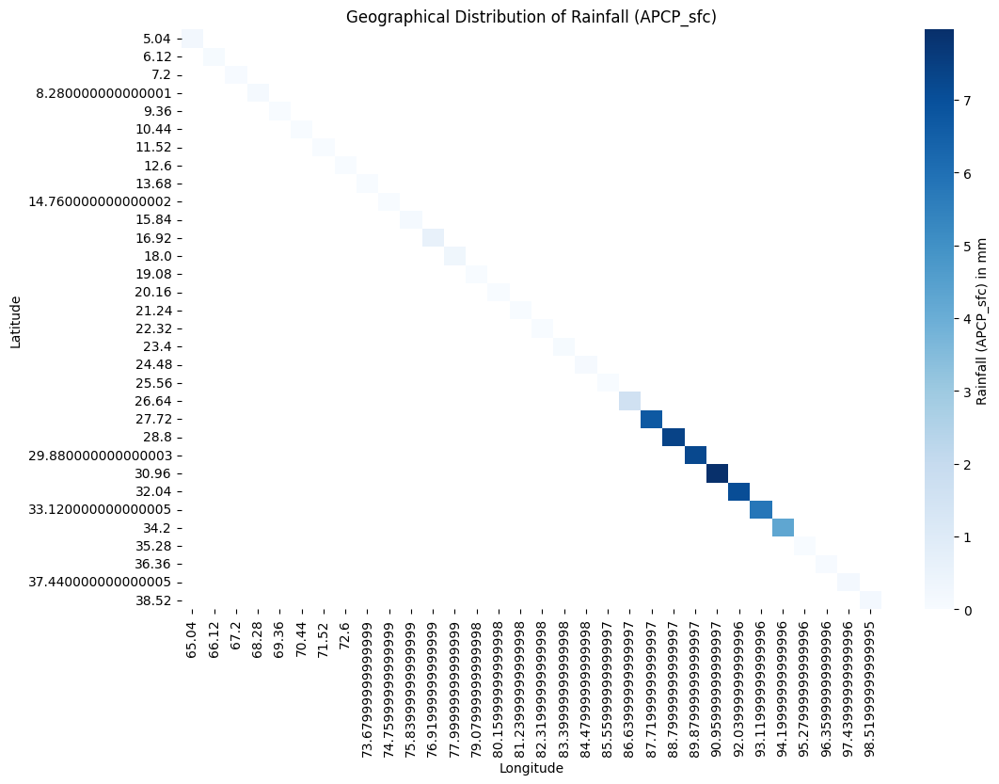

In [157]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a pivot table for latitude, longitude, and rainfall
df = pd.read_csv('csv_files-20241019T080204Z-001/csv_files/merged.csv')
rainfall_pivot = df.pivot_table(index='lat', columns='lon', values='APCP_sfc', aggfunc='mean')

# Heatmap for Rainfall Distribution by Latitude and Longitude
plt.figure(figsize=(12, 8))
sns.heatmap(rainfall_pivot, cmap='Blues', cbar_kws={'label': 'Rainfall (APCP_sfc) in mm'})
plt.title('Geographical Distribution of Rainfall (APCP_sfc)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


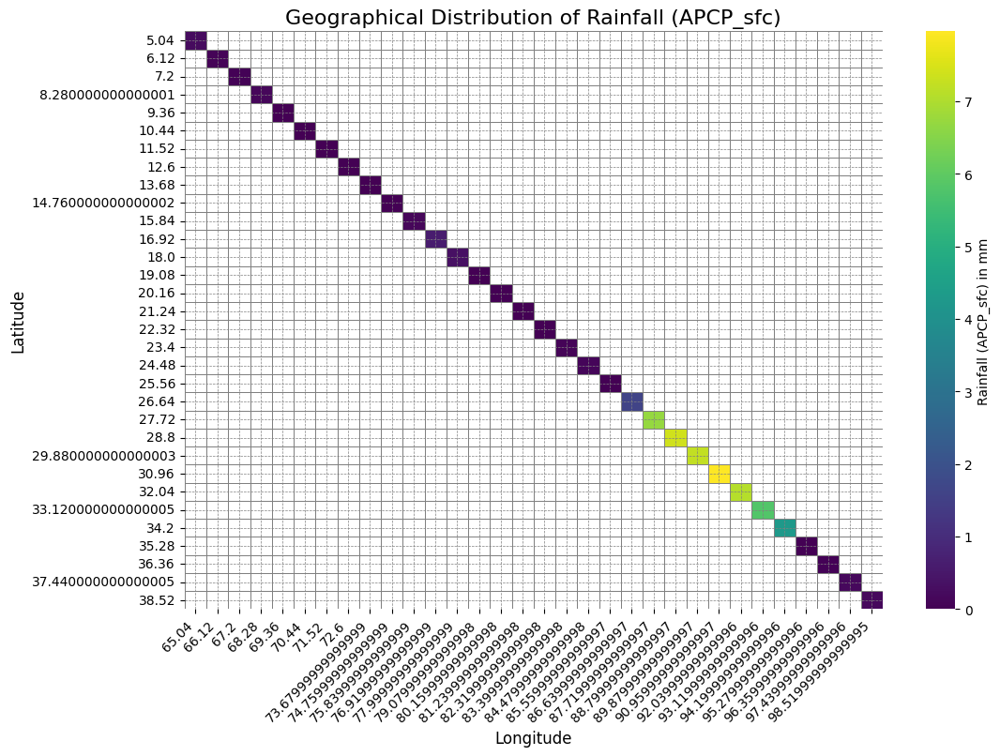

In [158]:
import seaborn as sns
import matplotlib.pyplot as plt

# Adjusting the heatmap to use a more distinguishable color map
plt.figure(figsize=(12, 8))

# Using the 'viridis' colormap for better contrast
sns.heatmap(rainfall_pivot, cmap='viridis', cbar_kws={'label': 'Rainfall (APCP_sfc) in mm'}, 
            linewidths=0.5, linecolor='gray')

plt.title('Geographical Distribution of Rainfall (APCP_sfc)', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate longitude labels for readability
plt.yticks(rotation=0)  # Keep latitude labels horizontal

# Show gridlines for clarity
plt.grid(True, which='both', color='gray', linestyle='--', linewidth=0.5)

plt.show()


Interpretation:
Concentration of Rainfall: Rainfall appears to be concentrated along specific latitudes and longitudes, indicating that certain geographical regions in the dataset are experiencing higher rainfall.
Temperature or Geographical Correlation: There may be a strong relationship between these geographical coordinates and variables like temperature or height (HGT_prl), which could explain the patterns observed.


The lighter-colored squares, especially at the top-left and bottom-right of the diagonal, indicate areas with very low or no rainfall. This is likely due to the fact that these geographical regions have different climate conditions, possibly drier ones.


Rainfall is more prominent in regions with latitudes and longitudes around the middle of the range.
Latitudes between 19° and 29° and longitudes between 75° and 85° seem to experience the most significant rainfall in this dataset (visible in the darker blue shades).

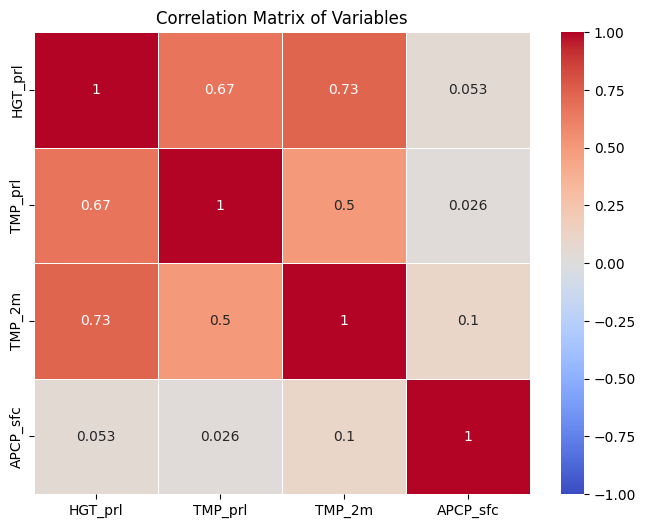

In [159]:
# Compute the correlation matrix
corr_matrix = df[['HGT_prl', 'TMP_prl', 'TMP_2m', 'APCP_sfc']].corr()

# Correlation Matrix Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix of Variables')
plt.show()


preprocessing 


In [160]:
%pip install dask[dataframe]
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [161]:
import pandas as pd

# Define the number of rows you want to extract
n = 85292
# Use the chunksize parameter to read the file in smaller chunks
chunk_size = 10000  # Adjust this based on your memory limits
chunks = pd.read_csv('csv_files-20241019T080204Z-001/csv_files/merged.csv', chunksize=chunk_size)

# Open the output file in write mode
with open('exact_extracted.csv', 'w', newline='', encoding='utf-8') as output_file:
    for i, chunk in enumerate(chunks):
        if i == 0:
            # Write the header in the first chunk
            chunk.head(n).to_csv(output_file, index=False)
        else:
            # Write the subsequent rows without the header
            chunk.head(n - chunk_size * i).to_csv(output_file, header=False, index=False)
       
        if len(chunk) >= n:
            break
        n -= len(chunk)


In [162]:
# Load the dataset
df = pd.read_csv('exact_extracted.csv')  # Replace 'file.csv' with your actual file path

# Convert Unix timestamp to datetime format
df['time'] = pd.to_datetime(df['time'], unit='s')

# Extract year, month, and day from the 'time' column
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['day'] = df['time'].dt.day

# Optionally, extract other time-based features (if needed)
df['day_of_week'] = df['time'].dt.dayofweek  # Day of the week (Monday=0, Sunday=6)
df['week_of_year'] = df['time'].dt.isocalendar().week  # Week of the year

# Save the updated dataframe to a new CSV file
df.to_csv('date_updated.csv', index=False)

print("Updated CSV file with date components saved as 'date_updated.csv'")

Updated CSV file with date components saved as 'date_updated.csv'


In [163]:
import dask.dataframe as dd

In [164]:
import dask.dataframe as dd
import numpy as np

# Load only necessary columns (lat, lon, and any other relevant columns)
# Specify `usecols` to load only the columns you need
df = dd.read_csv('date_updated.csv', usecols=['lat', 'lon'], dtype={'week_of_year': 'float64'})

# Define the latitudes and longitudes ranges
latitudes = np.arange(5.04, 38.52 + 1.08, 1.08)
longitudes = np.arange(65.04, 98.51 + 1.08, 1.08)

# Function to process and assign lat/lon in chunks
def process_chunk(chunk, latitudes, longitudes):
    num_rows = len(chunk)
    lat_repeated = np.tile(latitudes, num_rows // len(latitudes) + 1)[:num_rows]
    lon_repeated = np.tile(longitudes, num_rows // len(longitudes) + 1)[:num_rows]
    
    chunk['lat'] = lat_repeated
    chunk['lon'] = lon_repeated
    return chunk

# Apply the function to each partition
df = df.map_partitions(process_chunk, latitudes, longitudes)

# Persist the result into memory-efficient chunks
df = df.persist()

# Save the result to a CSV file, writing in chunks
df.to_csv('new_lat_lon.csv', index=False, single_file=True)

['/home/iiitd/Desktop/ML_Project_35/new_lat_lon.csv']

In [165]:
# Load the original hi.csv file
hi_df = pd.read_csv('date_updated.csv')  # Adjust blocksize if needed

# Load the updated merged file
updated_df = pd.read_csv('new_lat_lon.csv')

# Rename the lat and lon columns in the updated_df to avoid overlap
updated_df = updated_df.rename(columns={'lat': 'updated_lat', 'lon': 'updated_lon'})

# Perform a join operation
try:
    hi_updated_df = hi_df.join(updated_df[['updated_lat', 'updated_lon']], how='left', lsuffix='', rsuffix='_updated')
except Exception as e:
    print(f"Error during join: {e}")

# Save the result to a new CSV file
try:
    hi_updated_df.to_csv('add_lat_lon.csv', index=False)
except Exception as e:
    print(f"Error during save: {e}")


merged.csv ->exact_extracted.csv-> date_updated.csv -> new_lat_lon.csv -> add_lat_lon.csv -> final_data.csv 

In [166]:
df = pd.read_csv('add_lat_lon.csv')
df = df.drop(['lat','lon'], axis=1)
df.to_csv('Final_data_no_wind.csv', index=False)

In [167]:
import pandas as pd

# Define the number of rows you want to extract
n = 85292
# Use the chunksize parameter to read the file in smaller chunks
chunk_size = 10000  # Adjust this based on your memory limits
chunks = pd.read_csv('csv_files-20241019T080204Z-003/csv_files/ugrd.csv', chunksize=chunk_size)

# Open the output file in write mode
with open('wind_Ucomp_extracted.csv', 'w', newline='', encoding='utf-8') as output_file:
    for i, chunk in enumerate(chunks):
        if i == 0:
            # Write the header in the first chunk
            chunk.head(n).to_csv(output_file, index=False)
        else:
            # Write the subsequent rows without the header
            chunk.head(n - chunk_size * i).to_csv(output_file, header=False, index=False)
       
        if len(chunk) >= n:
            break
        n -= len(chunk)

In [168]:
import pandas as pd

# Define the number of rows you want to extract
n = 85292
# Use the chunksize parameter to read the file in smaller chunks
chunk_size = 10000  # Adjust this based on your memory limits
chunks = pd.read_csv('csv_files-20241019T080204Z-003/csv_files/vgrd.csv', chunksize=chunk_size)

# Open the output file in write mode
with open('wind_Vcomp_extracted.csv', 'w', newline='', encoding='utf-8') as output_file:
    for i, chunk in enumerate(chunks):
        if i == 0:
            # Write the header in the first chunk
            chunk.head(n).to_csv(output_file, index=False)
        else:
            # Write the subsequent rows without the header
            chunk.head(n - chunk_size * i).to_csv(output_file, header=False, index=False)
       
        if len(chunk) >= n:
            break
        n -= len(chunk)

In [169]:
import pandas as pd

# Define the number of rows you want to extract
n = 85292
# Use the chunksize parameter to read the file in smaller chunks
chunk_size = 10000  # Adjust this based on your memory limits
chunks = pd.read_csv('csv_files-20241019T080204Z-002/csv_files/mterh.csv', chunksize=chunk_size)

# Open the output file in write mode
with open('humidity_mterh_extracted.csv', 'w', newline='', encoding='utf-8') as output_file:
    for i, chunk in enumerate(chunks):
        if i == 0:
            # Write the header in the first chunk
            chunk.head(n).to_csv(output_file, index=False)
        else:
            # Write the subsequent rows without the header
            chunk.head(n - chunk_size * i).to_csv(output_file, header=False, index=False)
       
        if len(chunk) >= n:
            break
        n -= len(chunk)

In [170]:
df_ucomp = pd.read_csv('wind_Ucomp_extracted.csv')
ucomp = df_ucomp['UGRD_10m']

In [171]:
df_vcomp = pd.read_csv('wind_Vcomp_extracted.csv', usecols = ['VGRD_10m'])
vcomp = df_vcomp['VGRD_10m']

In [172]:
df_vcomp = pd.read_csv('humidity_mterh_extracted.csv', usecols = ['MTERH_sfc'])
hcomp = df_vcomp['MTERH_sfc']

In [173]:
df_wind = pd.concat([ucomp, vcomp,hcomp], axis = 1)
df_wind

,UGRD_10m,VGRD_10m,MTERH_sfc
0,-5.683823,-2.306593,0.359467
1,-5.230695,-2.665968,0.359467
2,-5.011946,-2.775344,0.359467
3,-5.121321,-2.759718,0.359467
4,-5.105695,-2.869093,0.359467
...,...,...,...
45287,-3.007516,-3.485792,0.359467
45288,-0.882515,-3.501413,0.359467
45289,0.054970,-2.501409,0.359467
45290,-1.538766,0.357955,970.359440


missing values

In [174]:
df_wind['wind_speed'] = np.sqrt(df_wind['UGRD_10m']**2 + df_wind['VGRD_10m']**2)
df_wind['wind_dir'] = (270 - np.degrees(np.arctan2(df_wind['VGRD_10m'], df_wind['UGRD_10m']))) % 360
df_wind = df_wind.drop(['VGRD_10m', 'UGRD_10m'], axis = 1)
df_wind

,MTERH_sfc,wind_speed,wind_dir
0,0.359467,6.134021,67.911843
1,0.359467,5.870908,62.993081
2,0.359467,5.729061,61.024696
3,0.359467,5.817557,61.681173
4,0.359467,5.856604,60.666637
...,...,...,...
45287,0.359467,4.603900,40.787383
45288,0.359467,3.610918,14.146492
45289,0.359467,2.502013,358.741083
45290,970.359440,1.579852,103.095521


In [175]:
df_final = pd.read_csv('Final_data_no_wind.csv')
df_final = pd.concat([df_final,df_wind], axis = 1)
df_final.to_csv('Complete_data.csv')

In [176]:
# Check for missing values in the updated dataset
missing_data = df_final.isnull().sum()
print("Missing values in each column:\n", missing_data)

# Check the percentage of missing data (for a better perspective)
missing_percentage = df_final.isnull().sum() * 100 / len(df)
print("\nPercentage of missing values in each column:\n", missing_percentage)


Missing values in each column:
 HGT_prl         0
time            0
TMP_prl         0
TMP_2m          0
APCP_sfc        0
year            0
month           0
day             0
day_of_week     0
week_of_year    0
updated_lat     0
updated_lon     0
MTERH_sfc       0
wind_speed      0
wind_dir        0
dtype: int64

Percentage of missing values in each column:
 HGT_prl         0.0
time            0.0
TMP_prl         0.0
TMP_2m          0.0
APCP_sfc        0.0
year            0.0
month           0.0
day             0.0
day_of_week     0.0
week_of_year    0.0
updated_lat     0.0
updated_lon     0.0
MTERH_sfc       0.0
wind_speed      0.0
wind_dir        0.0
dtype: float64


Rainfall division according to latitude and longitude (by taking mean over all observations of the given coordinate)

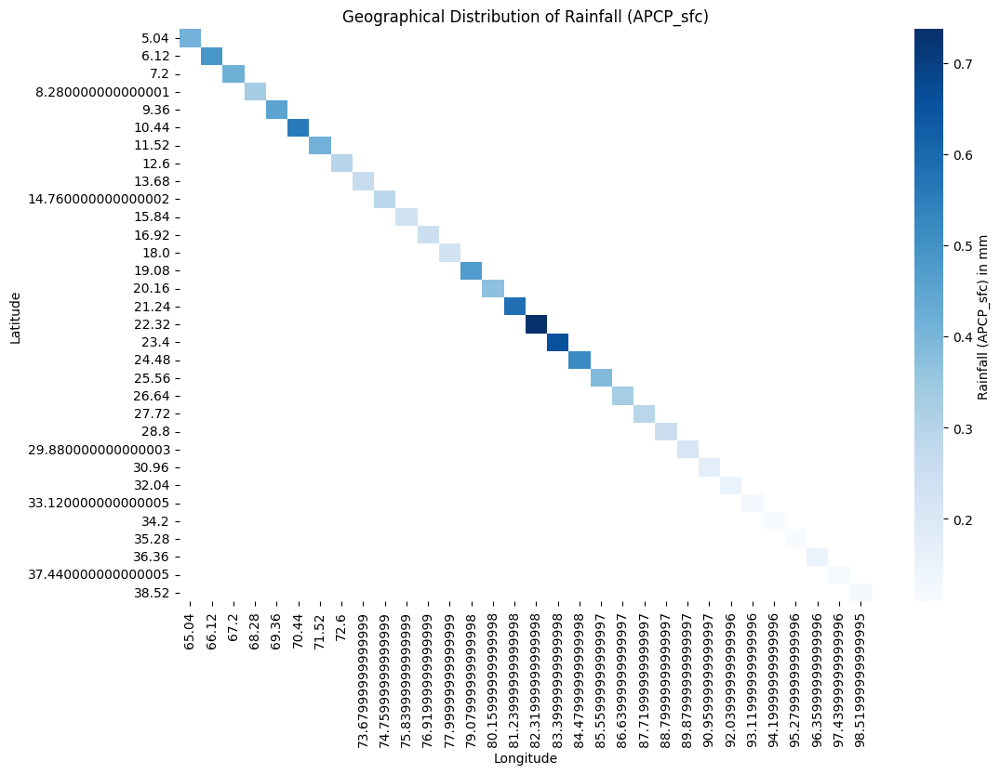

In [177]:
import seaborn as sns

# Create a pivot table for latitude, longitude, and rainfall
rainfall_pivot = df.pivot_table(index='updated_lat', columns='updated_lon', values='APCP_sfc', aggfunc='mean')

# Heatmap for Rainfall Distribution by Latitude and Longitude
plt.figure(figsize=(12, 8))
sns.heatmap(rainfall_pivot, cmap='Blues', cbar_kws={'label': 'Rainfall (APCP_sfc) in mm'})
plt.title('Geographical Distribution of Rainfall (APCP_sfc)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

Heatmap for the same with grid

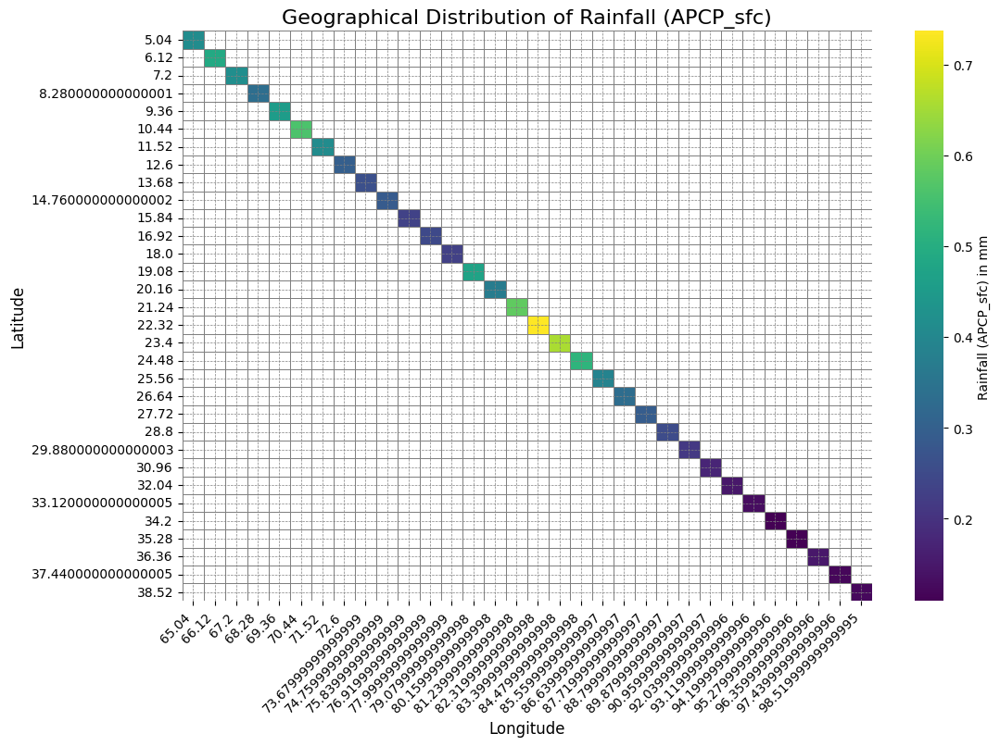

In [178]:
import seaborn as sns
import matplotlib.pyplot as plt

# Adjusting the heatmap to use a more distinguishable color map
plt.figure(figsize=(12, 8))

# Using the 'viridis' colormap for better contrast
sns.heatmap(rainfall_pivot, cmap='viridis', cbar_kws={'label': 'Rainfall (APCP_sfc) in mm'}, 
            linewidths=0.5, linecolor='gray')

plt.title('Geographical Distribution of Rainfall (APCP_sfc)', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate longitude labels for readability
plt.yticks(rotation=0)  # Keep latitude labels horizontal

# Show gridlines for clarity
plt.grid(True, which='both', color='gray', linestyle='--', linewidth=0.5)

plt.show()


correlation of different local metreological features with the precipitation

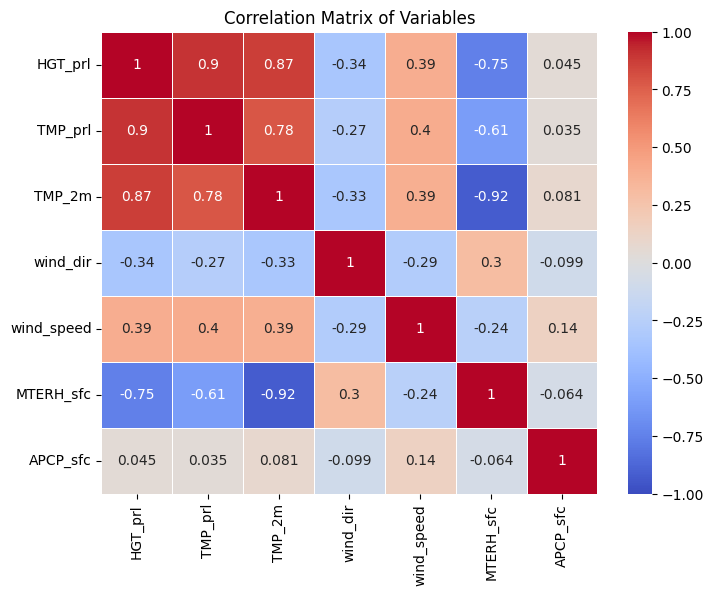

In [179]:
# Compute the correlation matrix
corr_matrix = df_final[['HGT_prl', 'TMP_prl', 'TMP_2m', 'wind_dir', 'wind_speed', 'MTERH_sfc', 'APCP_sfc']].corr()

# Correlation Matrix Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix of Variables')
plt.show()


In [180]:
df = pd.read_csv('Complete_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45292 entries, 0 to 45291
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    45292 non-null  int64  
 1   HGT_prl       45292 non-null  float64
 2   time          45292 non-null  object 
 3   TMP_prl       45292 non-null  float64
 4   TMP_2m        45292 non-null  float64
 5   APCP_sfc      45292 non-null  float64
 6   year          45292 non-null  int64  
 7   month         45292 non-null  int64  
 8   day           45292 non-null  int64  
 9   day_of_week   45292 non-null  int64  
 10  week_of_year  45292 non-null  int64  
 11  updated_lat   45292 non-null  float64
 12  updated_lon   45292 non-null  float64
 13  MTERH_sfc     45292 non-null  float64
 14  wind_speed    45292 non-null  float64
 15  wind_dir      45292 non-null  float64
dtypes: float64(9), int64(6), object(1)
memory usage: 5.5+ MB


### Linear Regression

In [181]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

# Load your dataset
df = pd.read_csv('Complete_data.csv')

# Ensure 'time' is in datetime format
df['time'] = pd.to_datetime(df['time'], errors='coerce')

# Extract year and month if not already done
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month

# Aggregate data by month and year
monthly_data = df.groupby(['year', 'month', 'updated_lat', 'updated_lon']).agg({
    'APCP_sfc': 'sum',  # Total rainfall per month
    'TMP_prl': 'mean',
    'TMP_2m': 'mean',
    'HGT_prl': 'mean',
    'MTERH_sfc': 'mean',
    'wind_speed': 'mean',
    'wind_dir': 'mean'
}).reset_index()

# Prepare features and target variable
X = monthly_data[['TMP_prl', 'TMP_2m', 'HGT_prl', 'MTERH_sfc', 'wind_speed', 'wind_dir']]
y = monthly_data['APCP_sfc']  # Monthly rainfall
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# columns_to_normalize = ['HGT_prl', 'TMP_prl', 'TMP_2m', 'MTERH_sfc', 'wind_speed', 'wind_dir']

# # Initialize the MinMaxScaler
# scaler = MinMaxScaler()

# # Apply the scaler to the selected columns
# X_train[columns_to_normalize] = scaler.fit_transform(X_train[columns_to_normalize])
# X_test[columns_to_normalize] = scaler.transform(X_test[columns_to_normalize])  # Note the use of transform, not fit_transform

print(X_train.head())

# Fit the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the training and test set
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluate the model
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)

print(f'Mean Squared Error on Training Set: {mse_train}')
print(f'Mean Squared Error on Testing Set: {mse_test}')

# Print model coefficients
print(f'Coefficients: {model.coef_}')


         TMP_prl      TMP_2m      HGT_prl    MTERH_sfc  wind_speed    wind_dir
1379  292.642455  299.431333  5859.580000     0.359467    6.250568   14.271103
9417  287.057803  287.142570  5778.326767  1435.026111    8.108778  129.295609
9383  278.061647  266.709195  5651.445300  2937.360142    1.694613  189.711896
416   281.659453  292.563680  5743.321667   366.359482    1.424224  135.466413
4923  290.245025  299.523135  5864.954500     0.359467    5.457450  102.917632
Mean Squared Error on Training Set: 18.49571753367509
Mean Squared Error on Testing Set: 17.91686217506536
Coefficients: [-9.98014282e-02  3.64468009e-02 -8.15732868e-03 -1.68672315e-04
  3.77669744e-01 -4.73162632e-03]


### Linear Regression with RFE

In [182]:
# import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error

# Load your dataset
df = pd.read_csv('Complete_data.csv')

# Preprocessing (assuming you already cleaned your data)
# Fill NaN values if necessary, or drop them based on your cleaning strategy
df.fillna(0, inplace=True)

# Define the features and target variable
X = df[['HGT_prl', 'TMP_prl', 'TMP_2m',  'MTERH_sfc', 'wind_speed', 'wind_dir']]
y = df['APCP_sfc']  # Assuming you want to predict monthly rainfall (or whatever your target is)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Use RFE to select the top 2 features
selector = RFE(model, n_features_to_select=3)
selector = selector.fit(X_train, y_train)

# Get the selected features
selected_features = X.columns[selector.support_]
print("Selected Features:", selected_features)

# Train the model using the selected features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

print(X_train_selected.head())

model.fit(X_train_selected, y_train)

# Predict and evaluate the model on the training set
y_train_pred = model.predict(X_train_selected)
train_mse = mean_squared_error(y_train, y_train_pred)

# Predict and evaluate the model on the testing set
y_test_pred = model.predict(X_test_selected)
test_mse = mean_squared_error(y_test, y_test_pred)

# Print the Mean Squared Errors
print("Mean Squared Error on Training Set:", train_mse)
print("Mean Squared Error on Testing Set:", test_mse)

# Get the model coefficients
print("Coefficients:", model.coef_)


Selected Features: Index(['TMP_prl', 'TMP_2m', 'wind_speed'], dtype='object')
         TMP_prl     TMP_2m  wind_speed
10217  277.22607  261.64710    7.014653
16341  280.13565  249.01564    1.292707
17191  280.37670  280.97452    2.527327
16377  273.83878  250.10939    1.569459
5306   290.24010  299.14618    6.897054
Mean Squared Error on Training Set: 2.127999362364942
Mean Squared Error on Testing Set: 2.247667423859303
Coefficients: [-0.02984081  0.00972615  0.08274387]


### Avg precipitation for each subdivision over the period 1990-2020

/tmp/ipykernel_36372/640818913.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='coordinate_id', y='APCP_sfc', data=mean_apcp, palette='viridis')


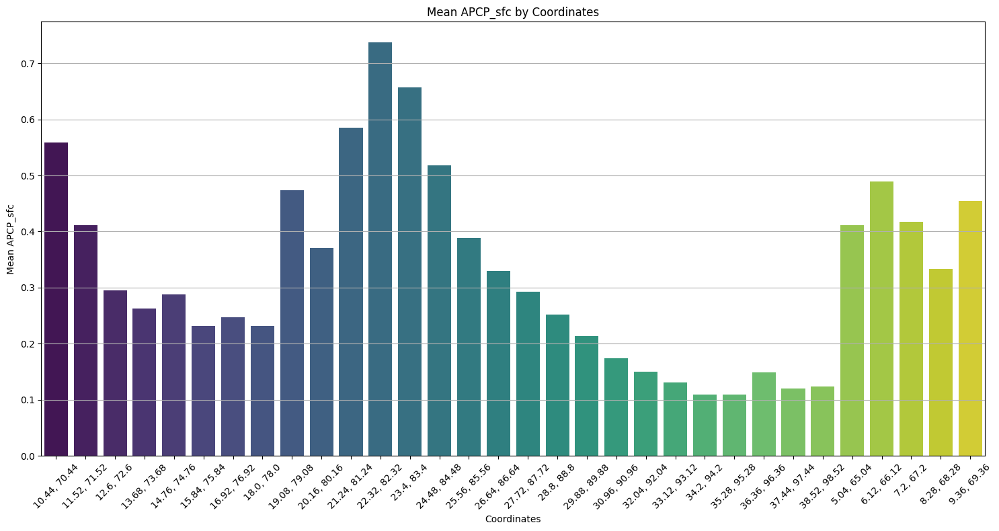

In [183]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Limit decimal values of latitude and longitude to 3 places
data['updated_lat'] = data['updated_lat'].round(3)
data['updated_lon'] = data['updated_lon'].round(3)

# Combine latitude and longitude into a single coordinate identifier
data['coordinate_id'] = data['updated_lat'].astype(str) + ', ' + data['updated_lon'].astype(str)

# Calculate the mean APCP_sfc for each coordinate
mean_apcp = data.groupby('coordinate_id')['APCP_sfc'].mean().reset_index()

# Create a bar plot for mean APCP_sfc by coordinates
plt.figure(figsize=(15, 8))
sns.barplot(x='coordinate_id', y='APCP_sfc', data=mean_apcp, palette='viridis')
plt.title('Mean APCP_sfc by Coordinates')
plt.xlabel('Coordinates')
plt.ylabel('Mean APCP_sfc')
plt.xticks(rotation=45)  # Rotate x-ticks for better visibility
plt.grid(axis='y')
plt.tight_layout()  # Adjust layout to make room for x-ticks
plt.show()


In [184]:
%pip install seaborn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


### Avg Precipitation for each year subdivision wise

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


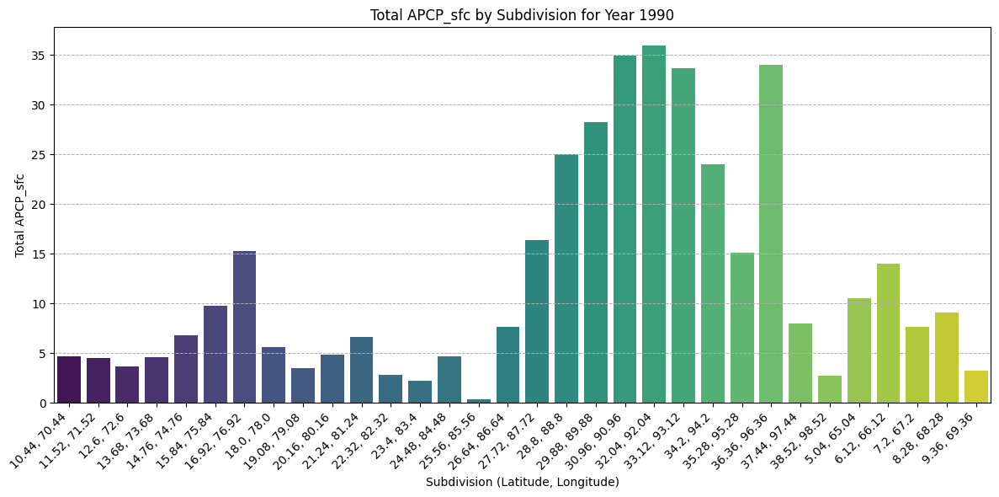

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


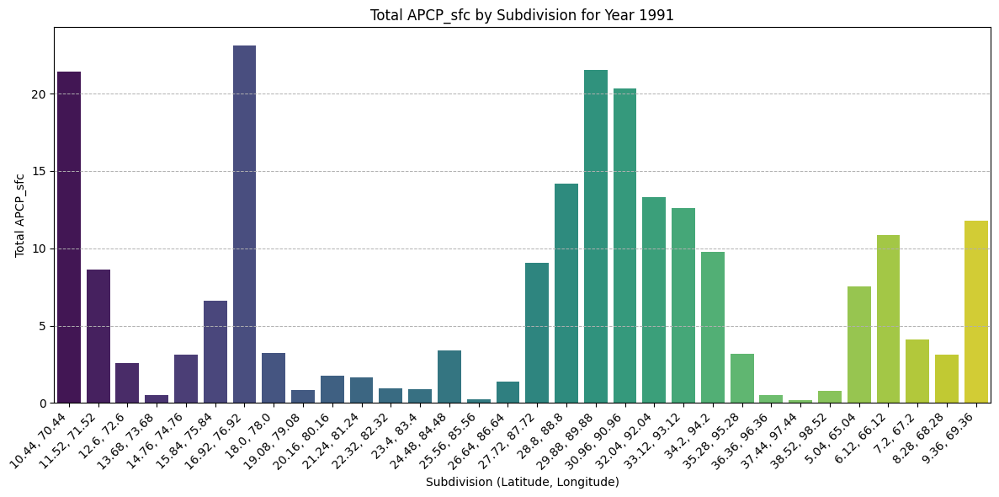

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


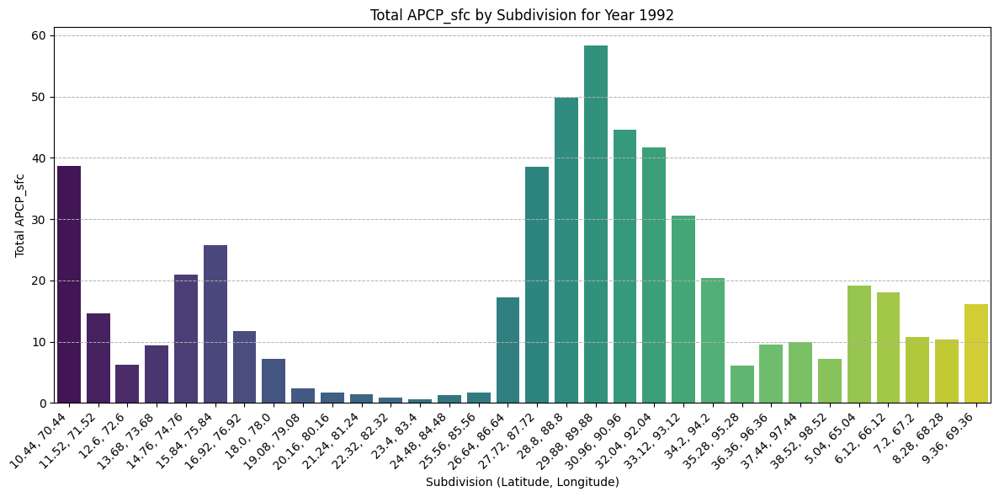

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


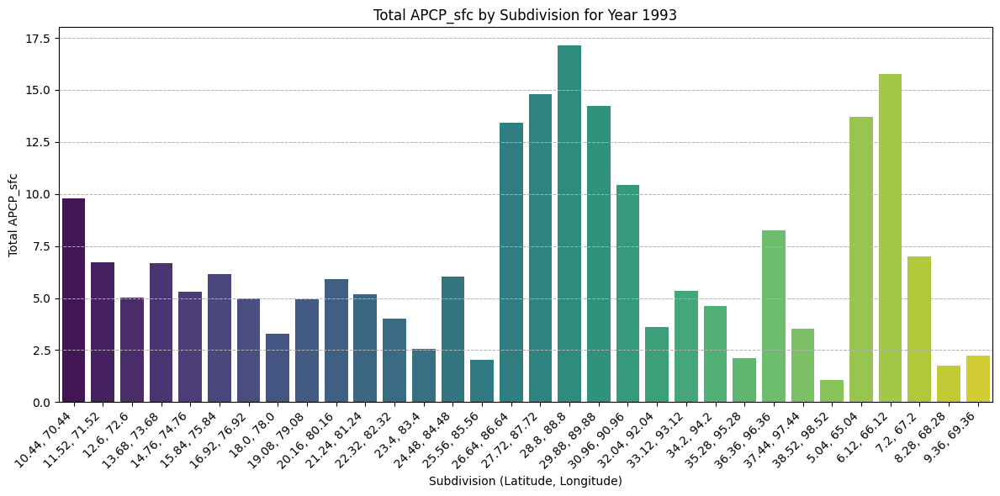

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


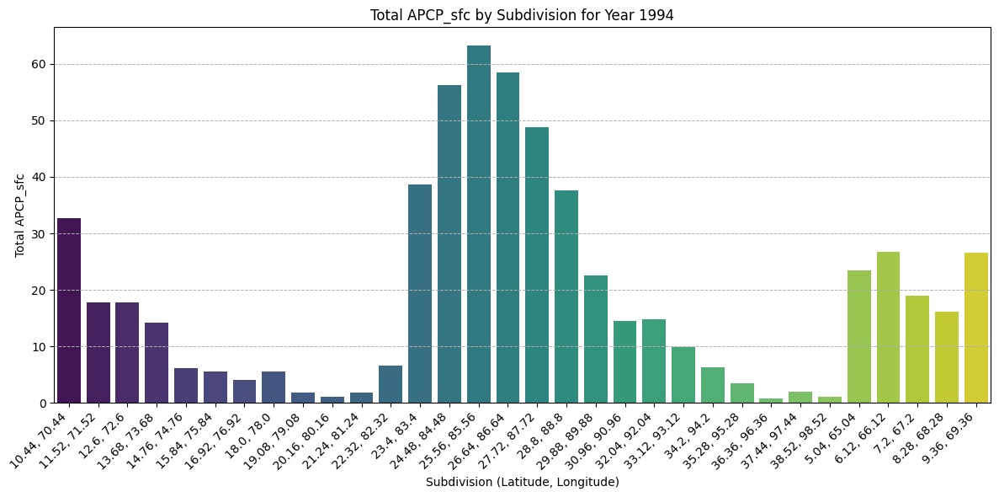

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


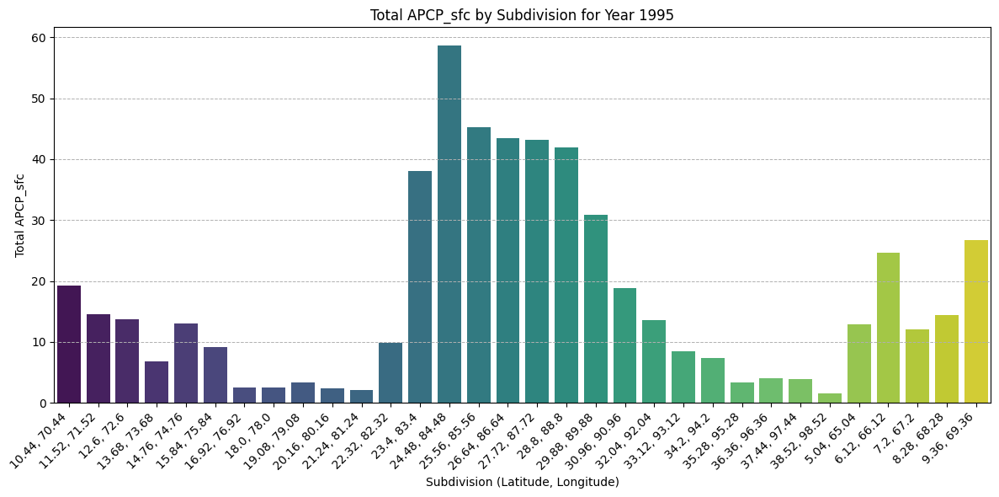

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


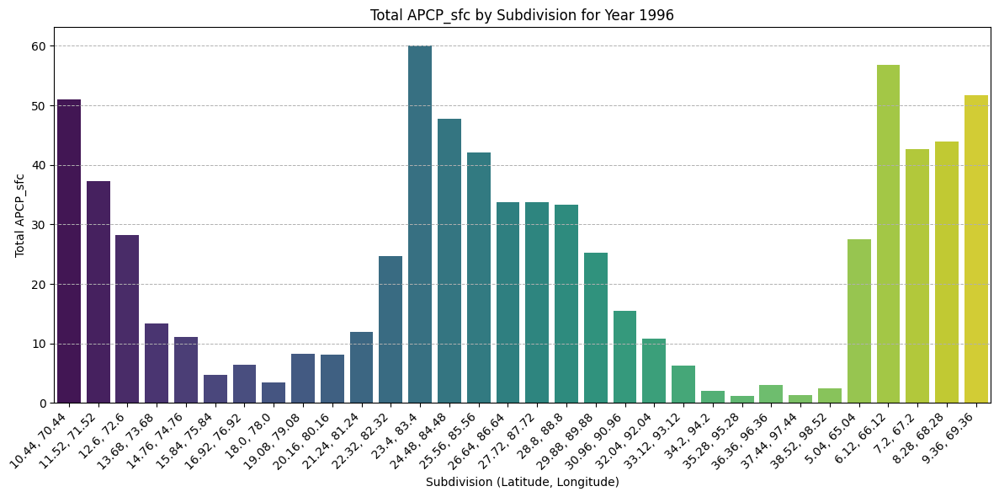

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


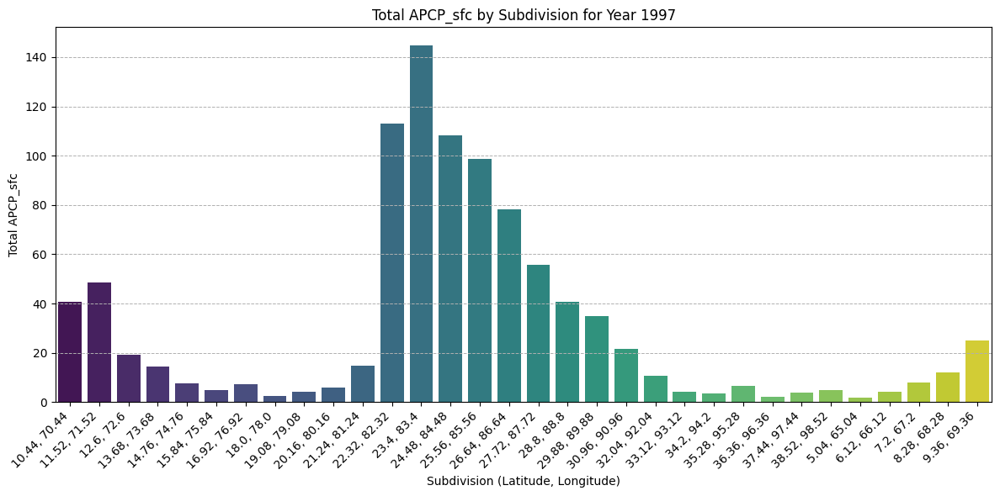

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


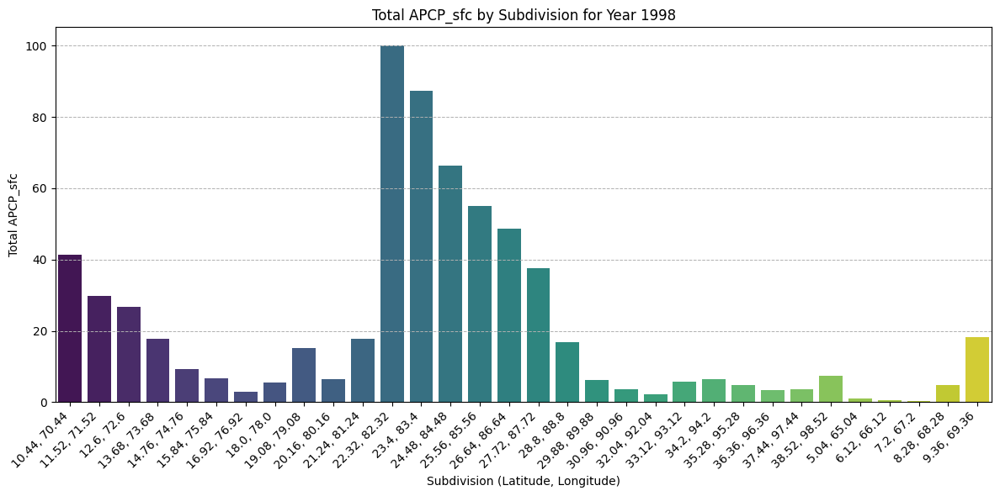

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


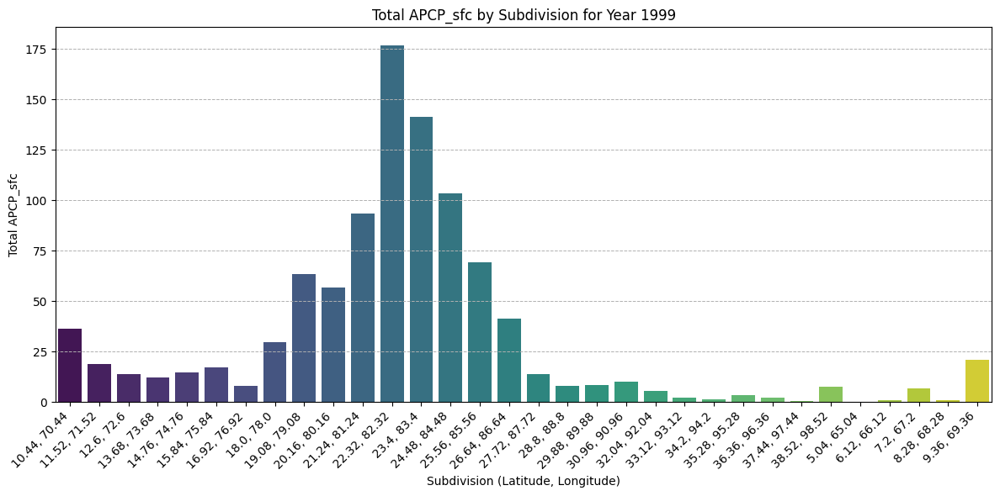

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


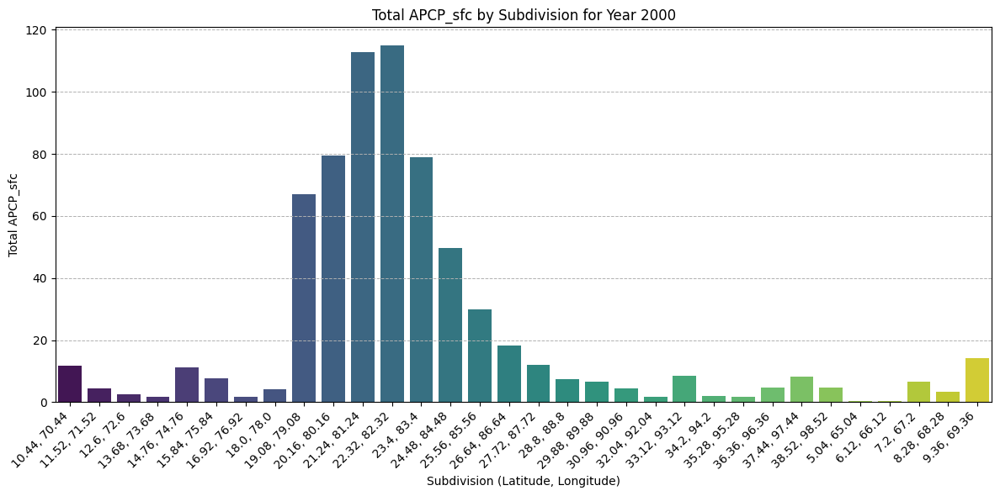

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


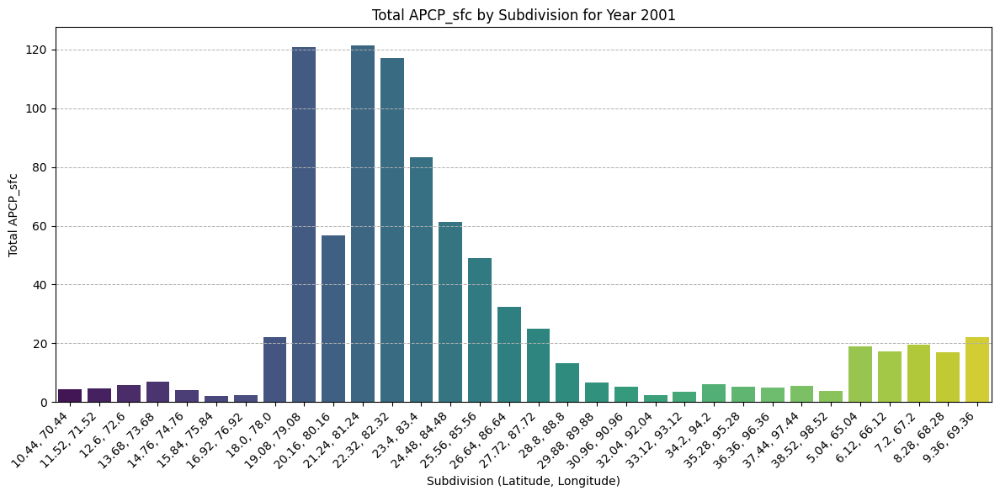

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


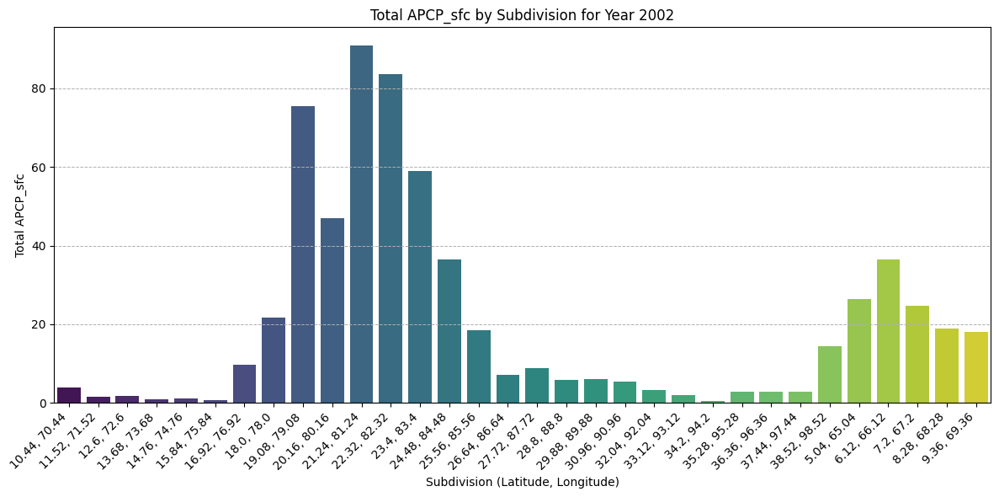

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


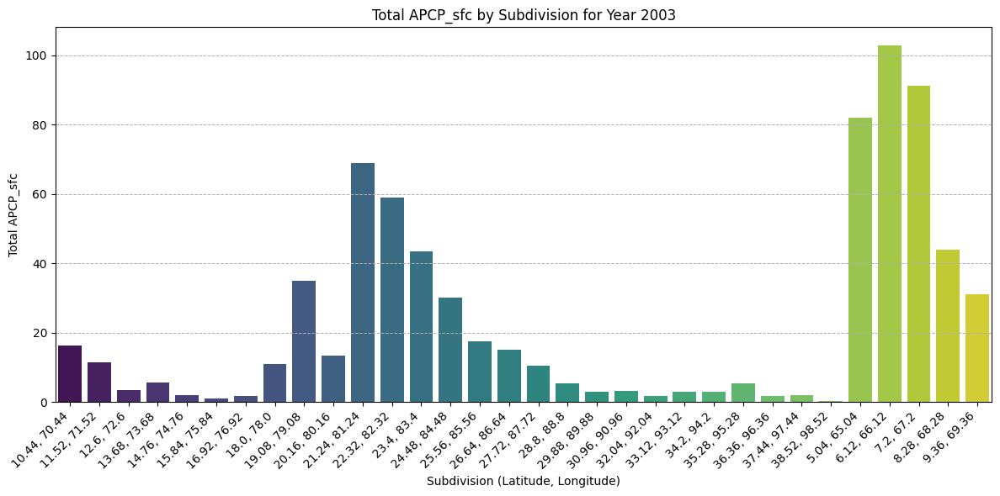

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


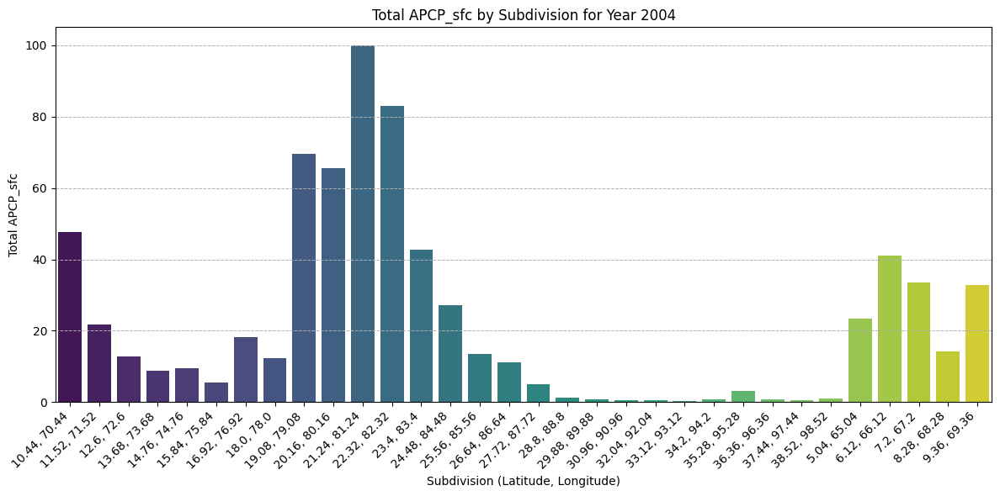

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


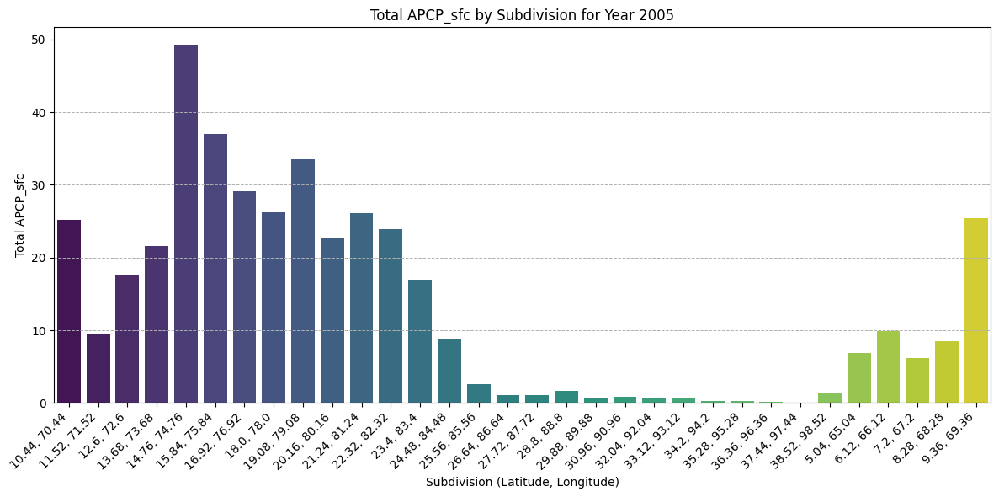

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


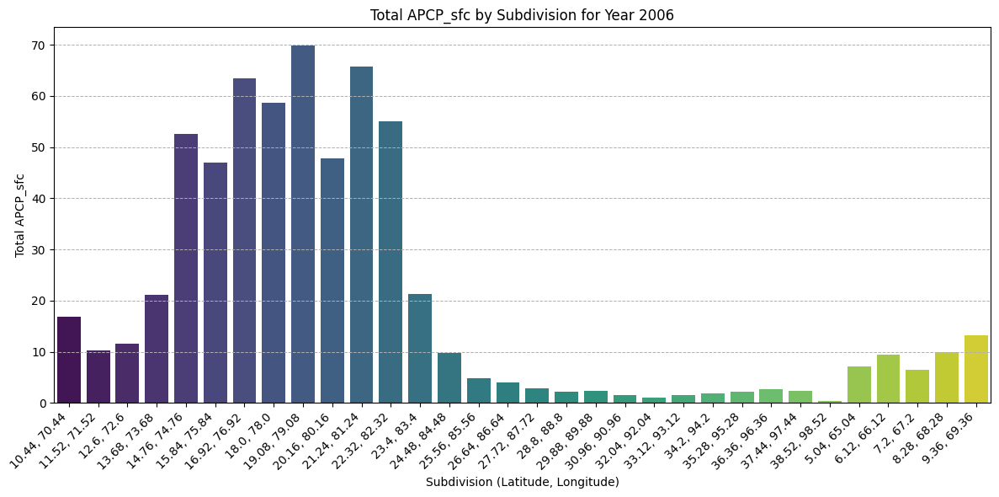

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


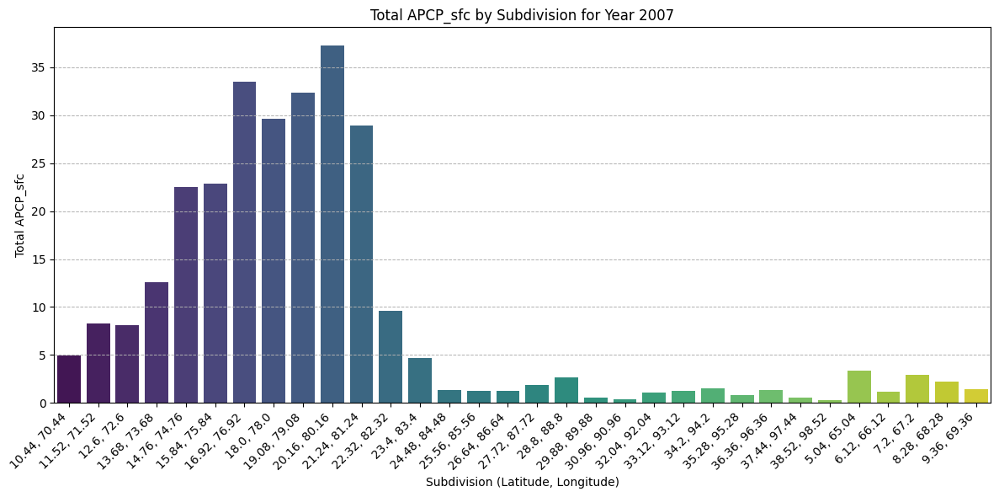

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


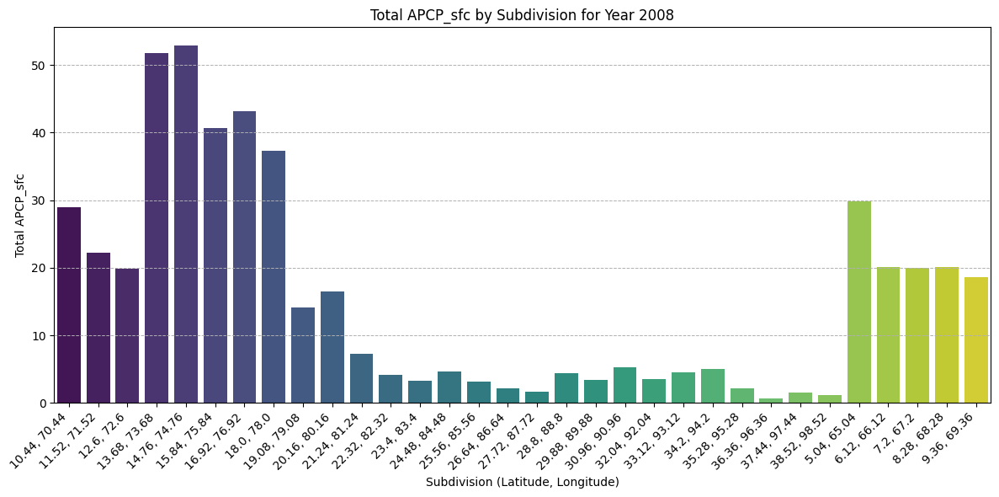

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


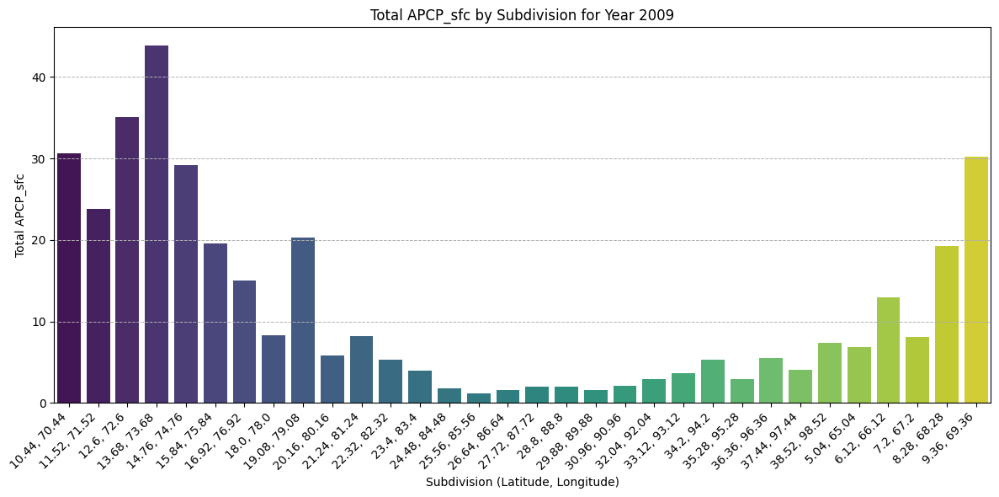

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


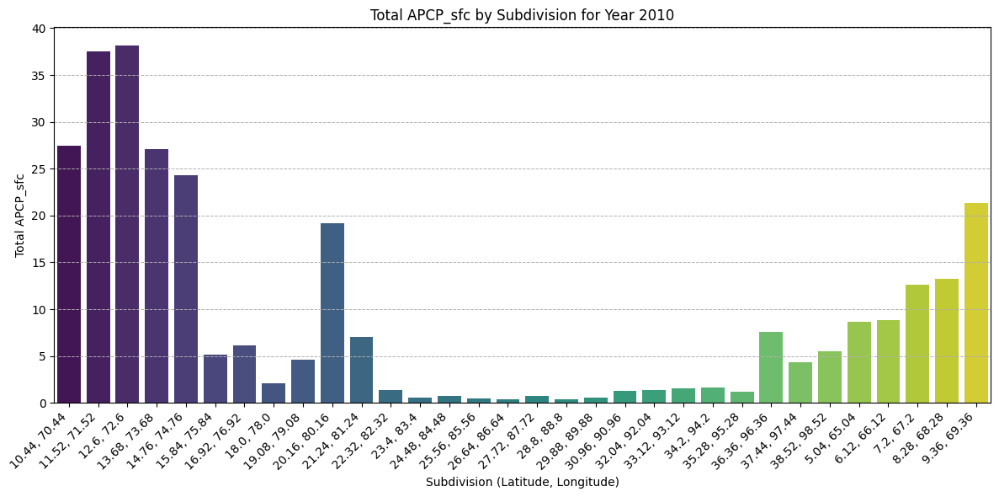

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


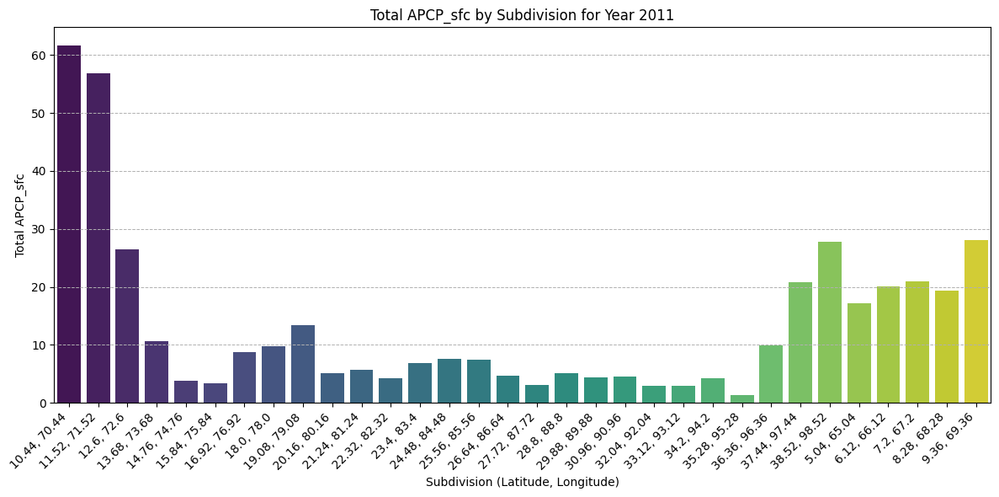

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


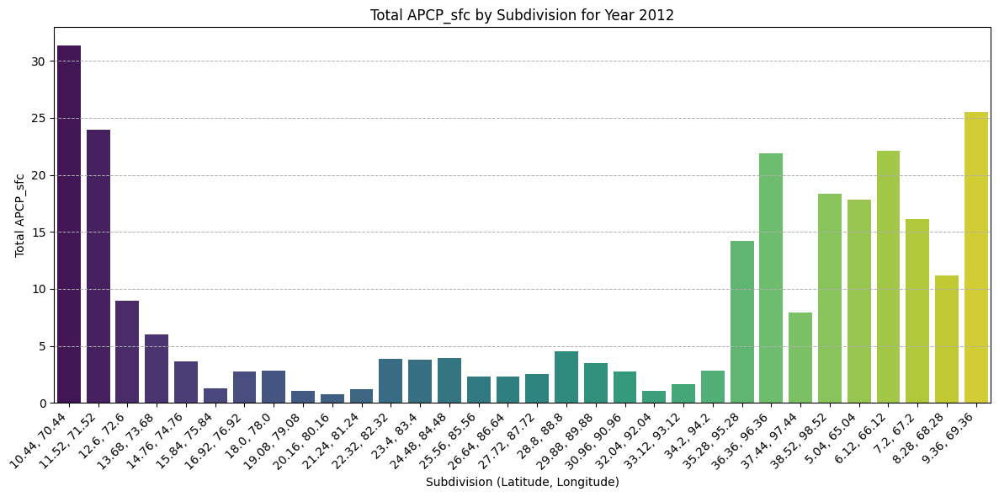

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


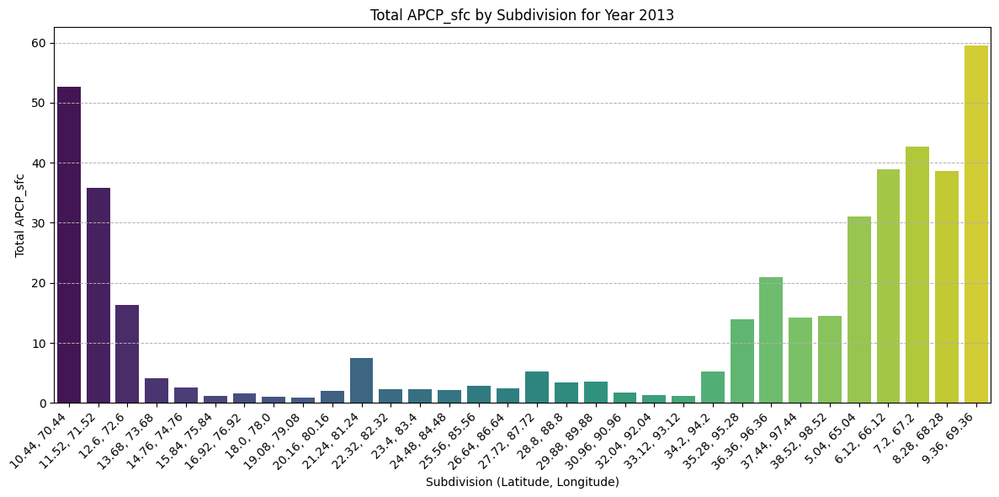

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


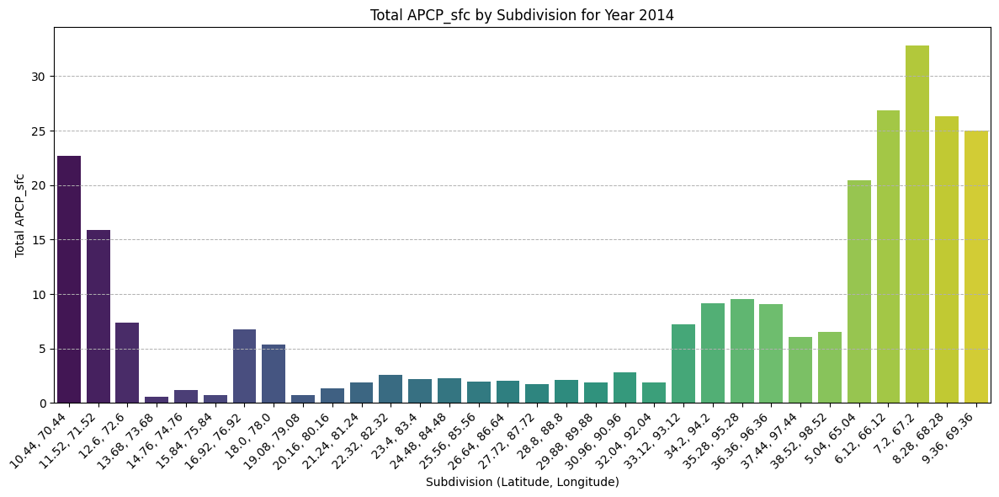

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


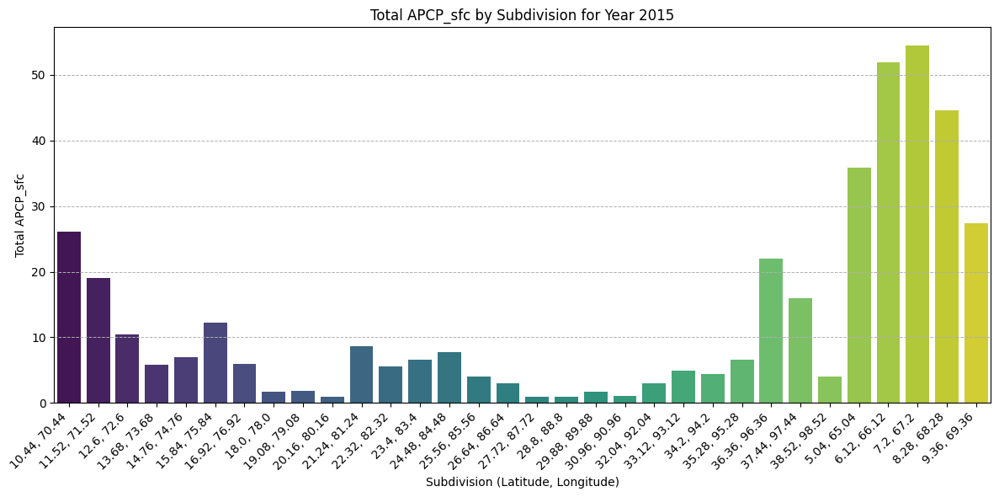

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


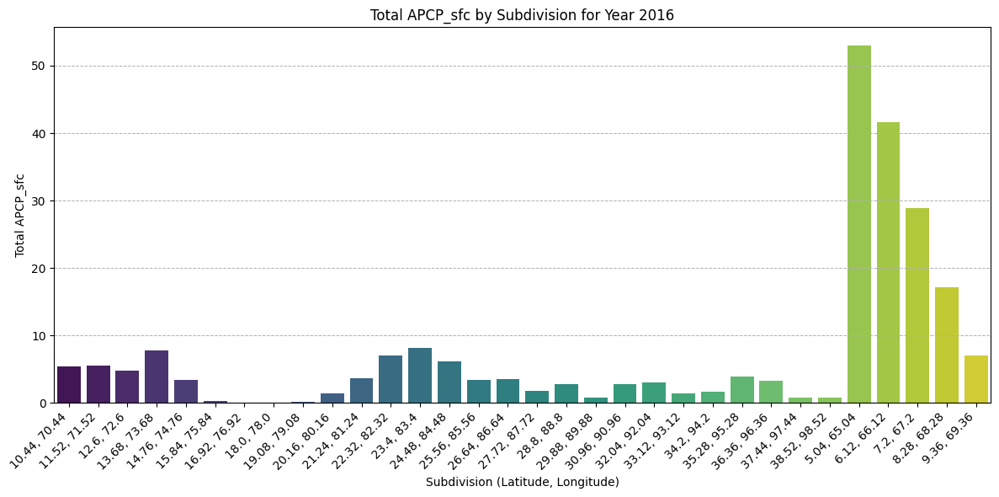

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


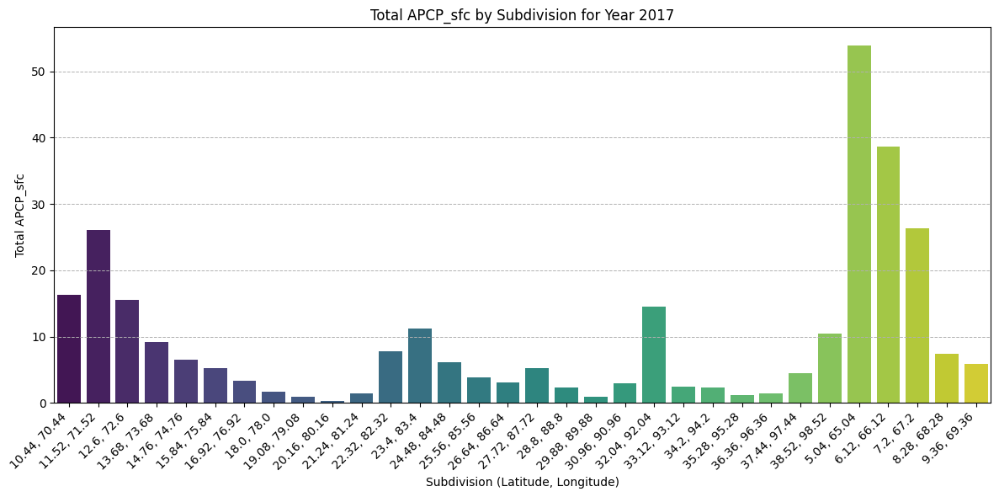

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


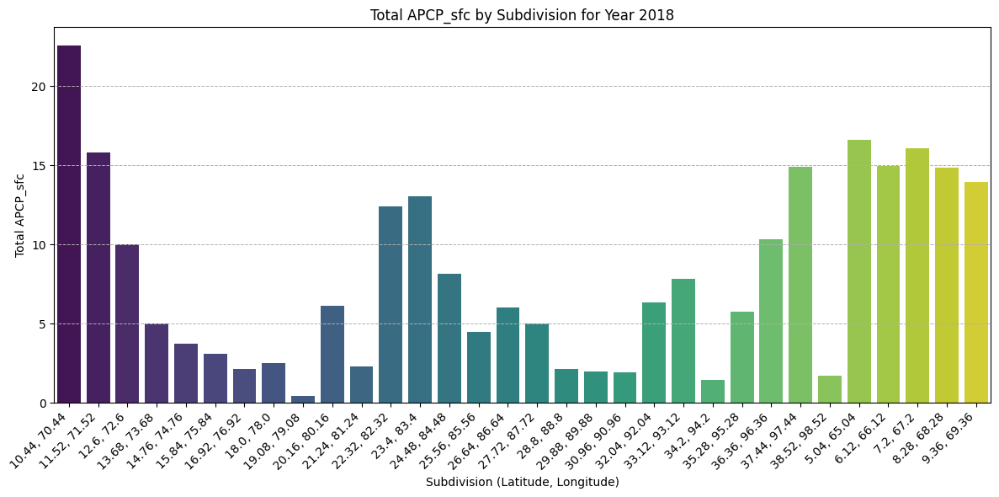

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


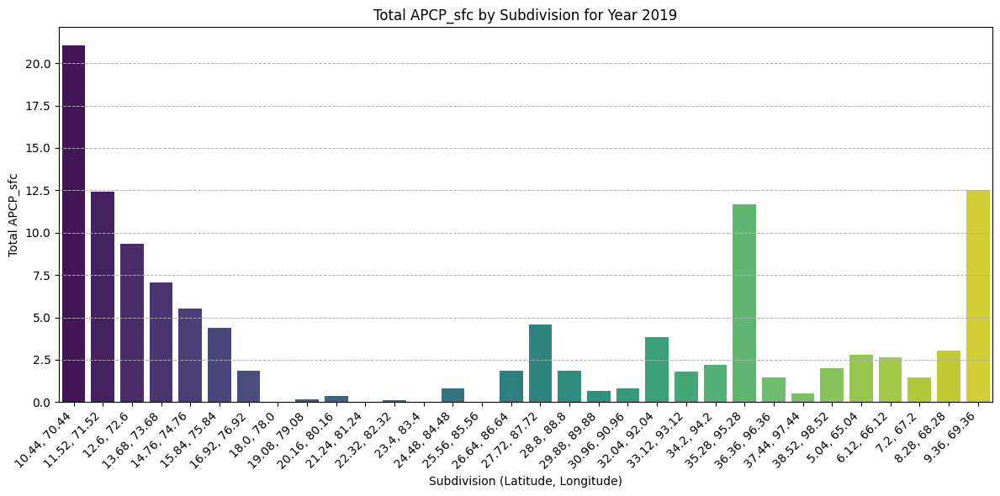

/tmp/ipykernel_36372/2393095343.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')


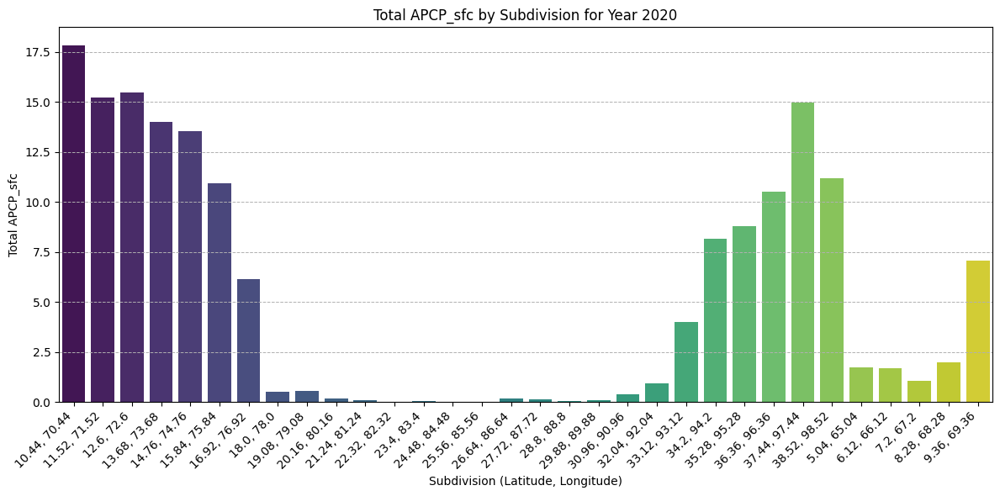

In [185]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('Complete_data.csv')

# Limit latitude and longitude precision and combine them to define subdivisions
data['updated_lat'] = data['updated_lat'].round(3)
data['updated_lon'] = data['updated_lon'].round(3)
data['subdivision'] = data['updated_lat'].astype(str) + ', ' + data['updated_lon'].astype(str)

# Group the data by year and subdivision to sum APCP_sfc
yearly_apcp = data.groupby(['year', 'subdivision'])['APCP_sfc'].sum().reset_index()

# Get a list of unique years
years = yearly_apcp['year'].unique()

# Generate a bar plot for each year
for year in years:
    # Filter data for the current year
    year_data = yearly_apcp[yearly_apcp['year'] == year]
    
    # Create a bar plot
    plt.figure(figsize=(12, 6))
    sns.barplot(x='subdivision', y='APCP_sfc', data=year_data, palette='viridis')
    
    # Add titles and labels
    plt.title(f'Total APCP_sfc by Subdivision for Year {year}')
    plt.xlabel('Subdivision (Latitude, Longitude)')
    plt.ylabel('Total APCP_sfc')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
    plt.grid(axis='y', linestyle='--', linewidth=0.7)
    
    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()


### Total monthly precipitation of each year

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


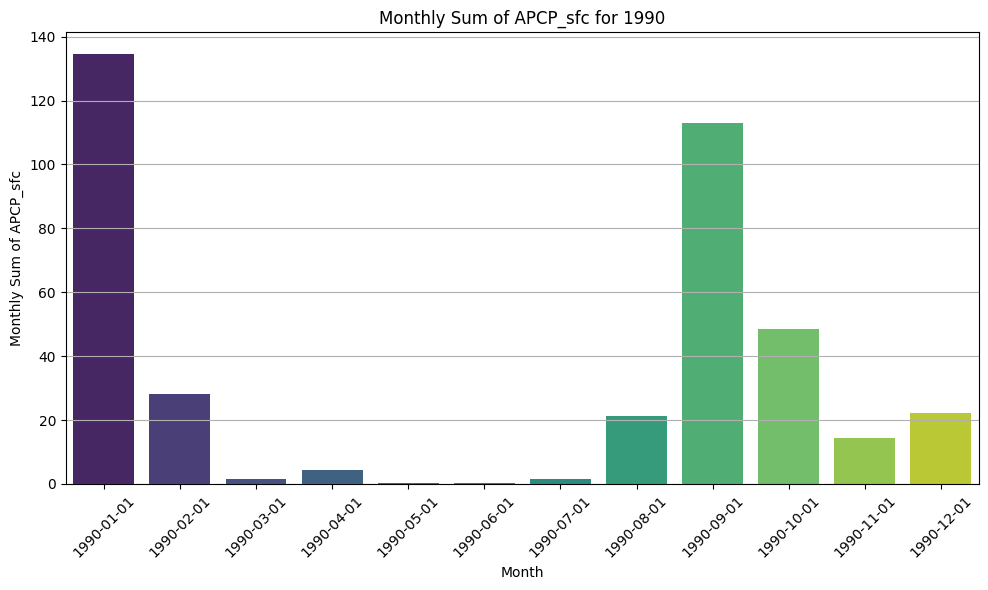

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


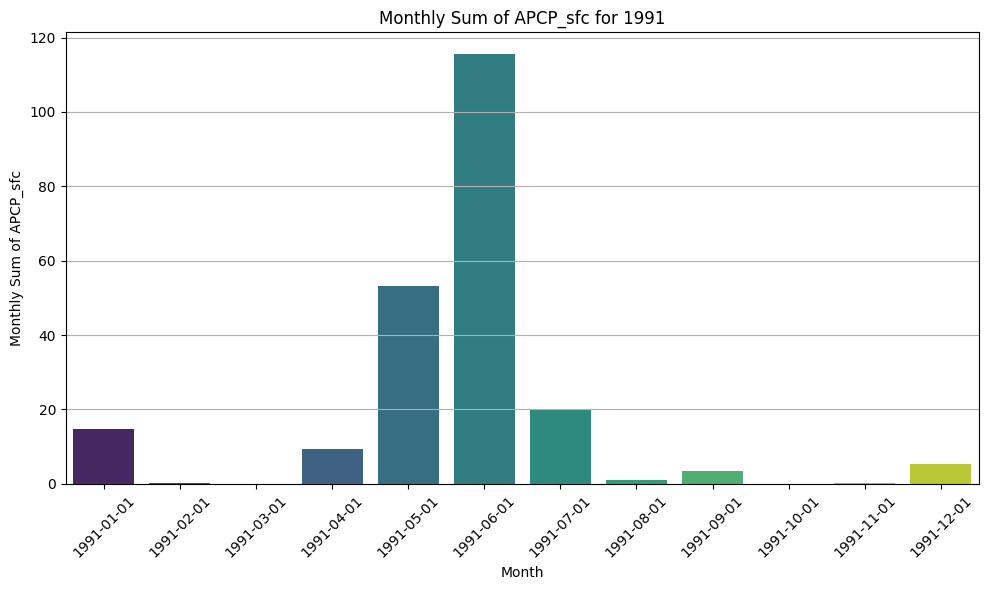

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


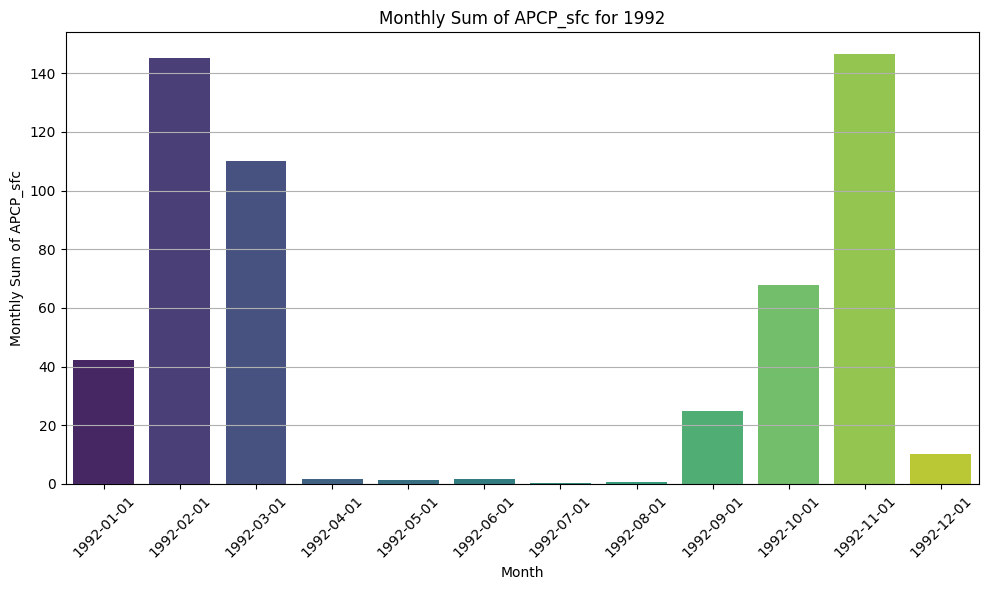

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


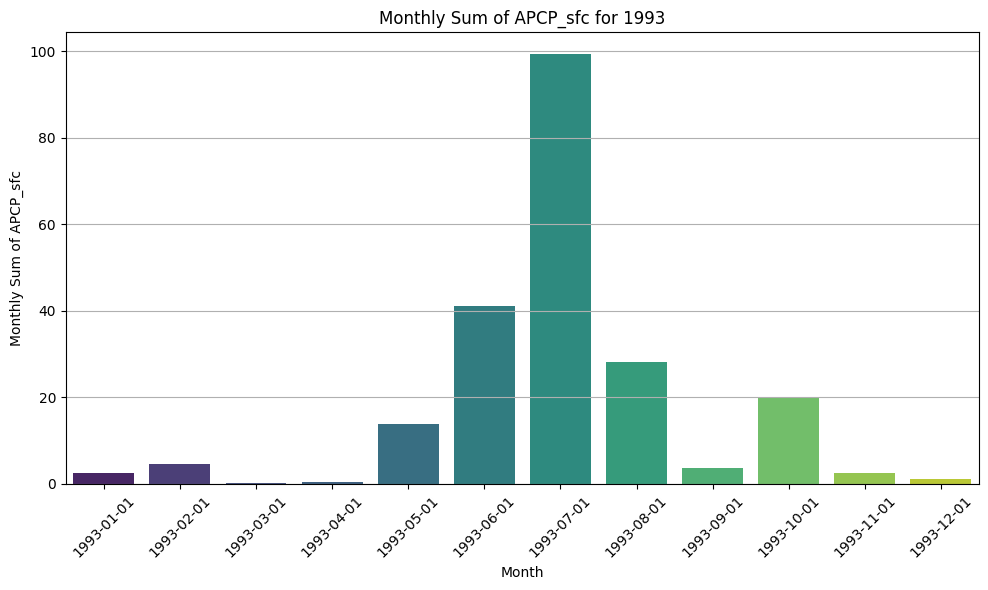

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


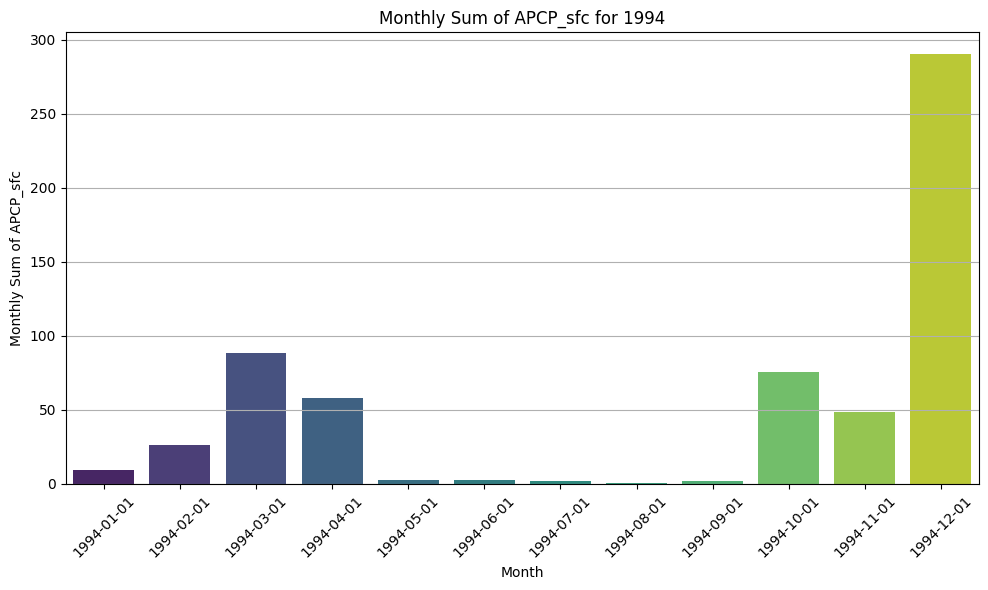

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


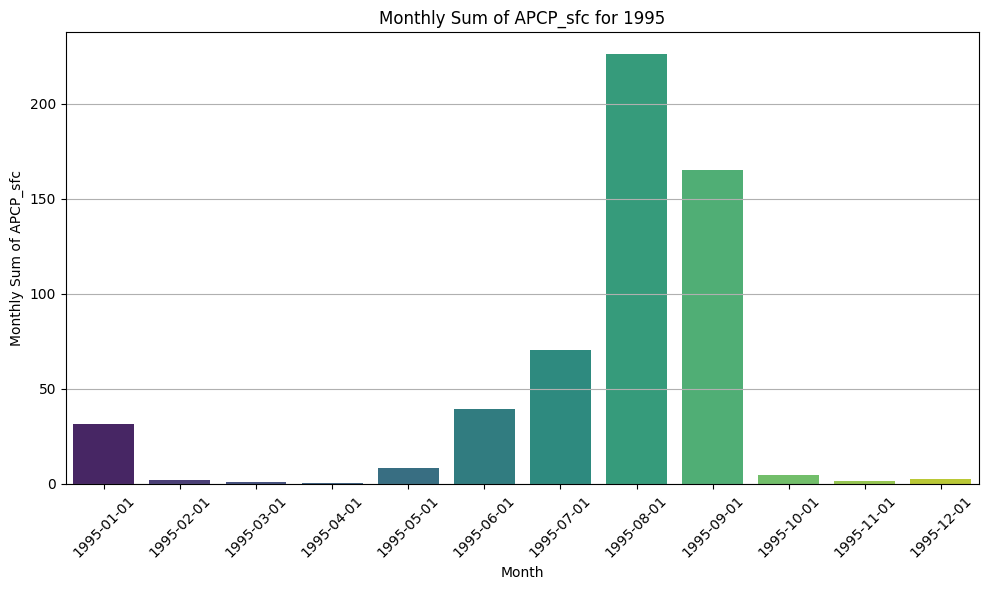

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


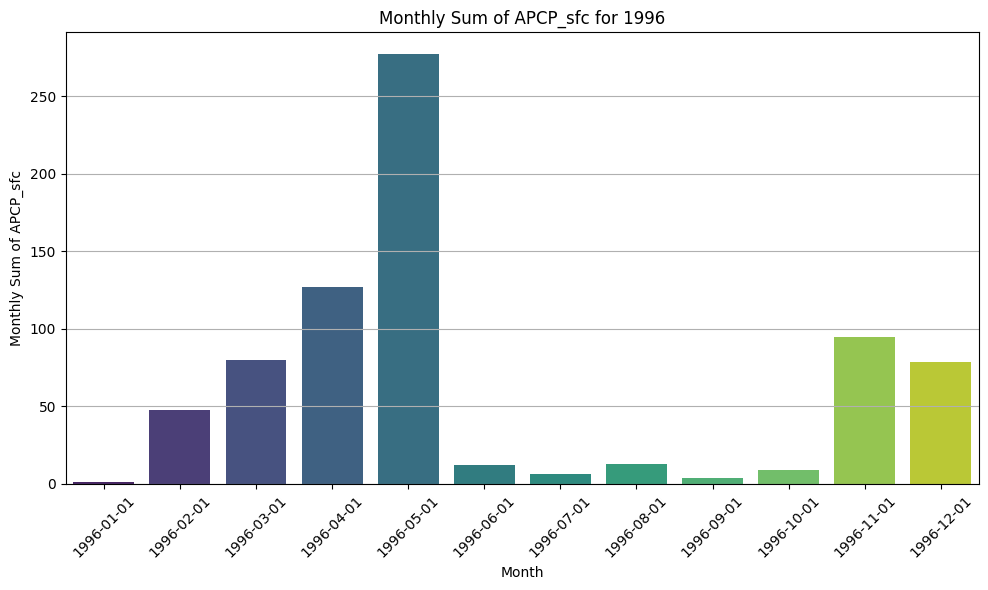

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


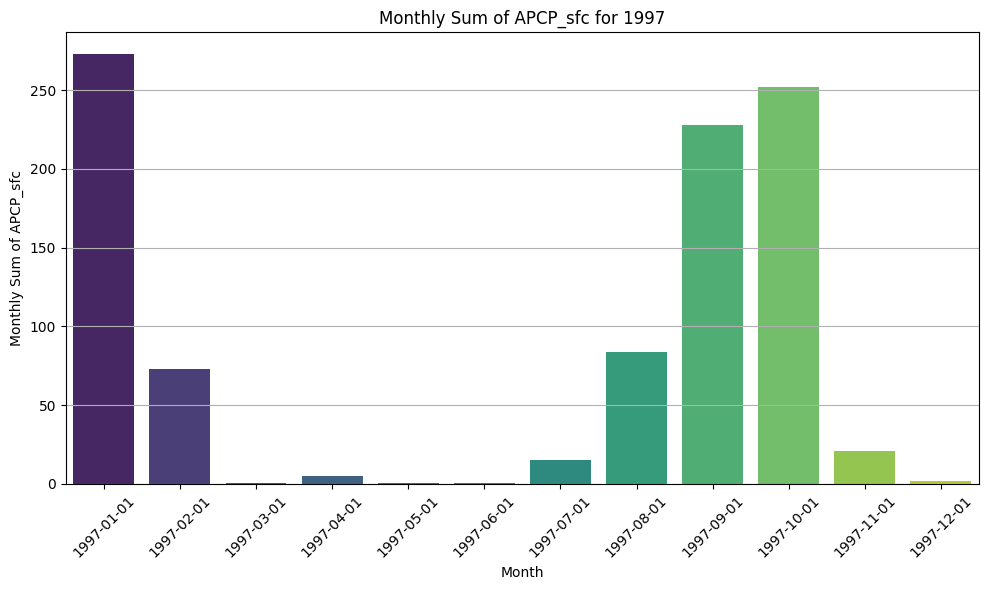

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


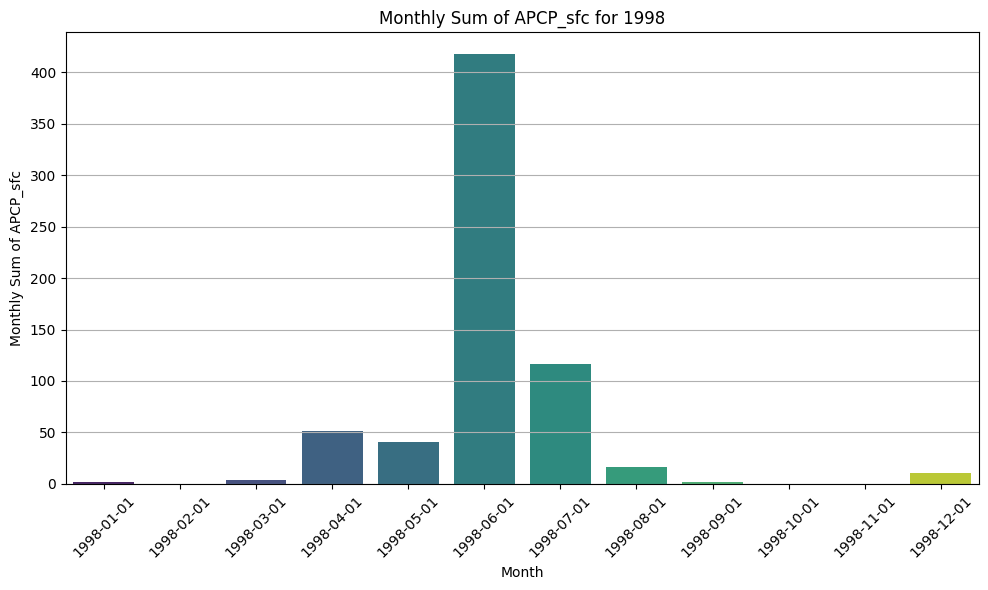

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


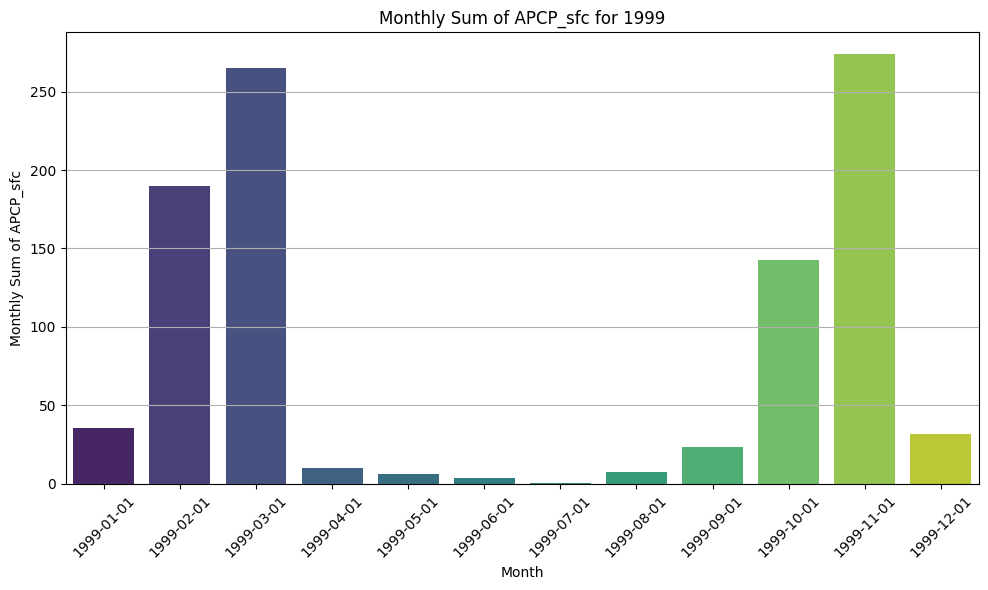

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


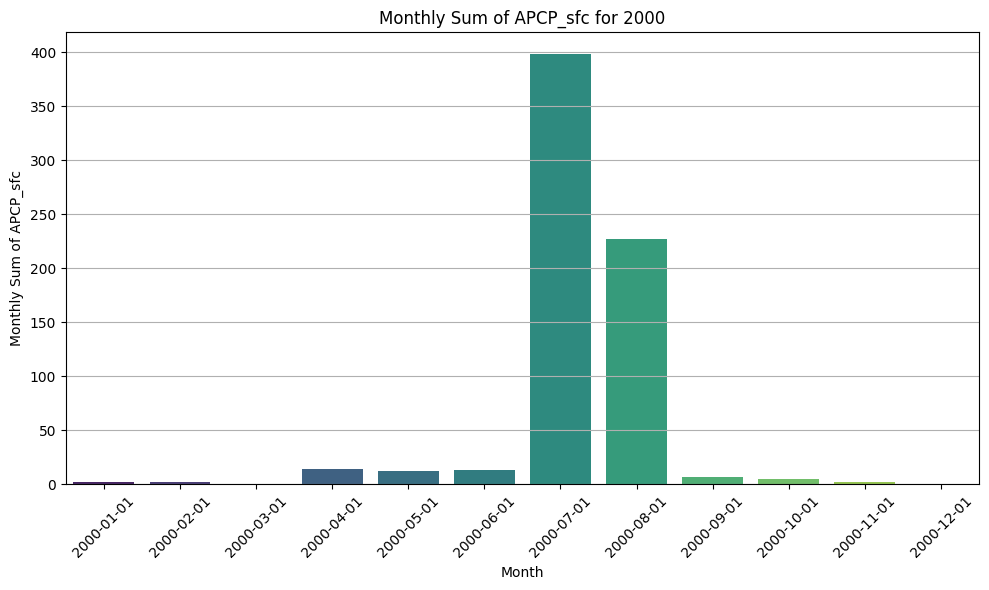

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


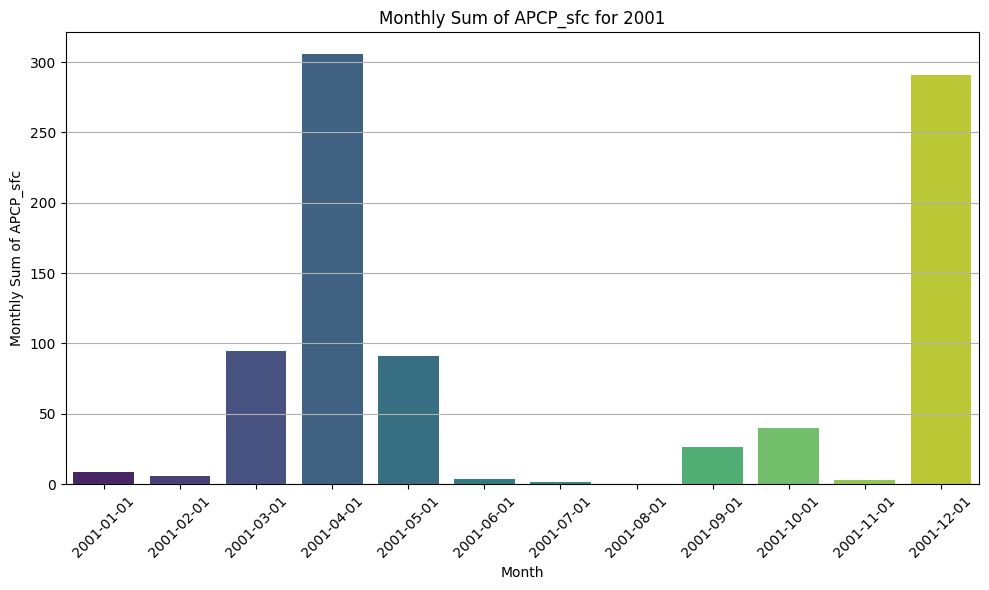

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


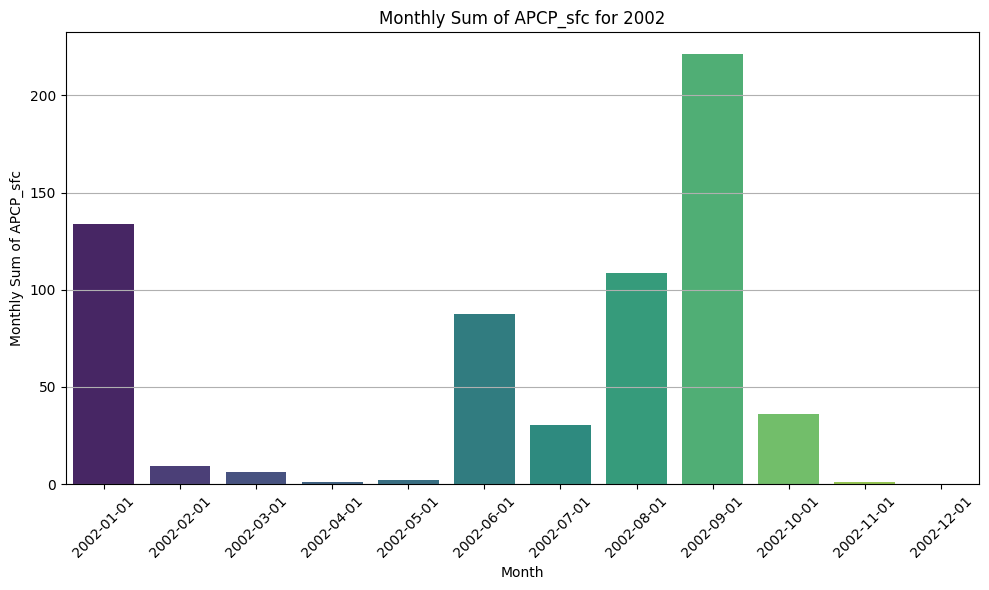

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


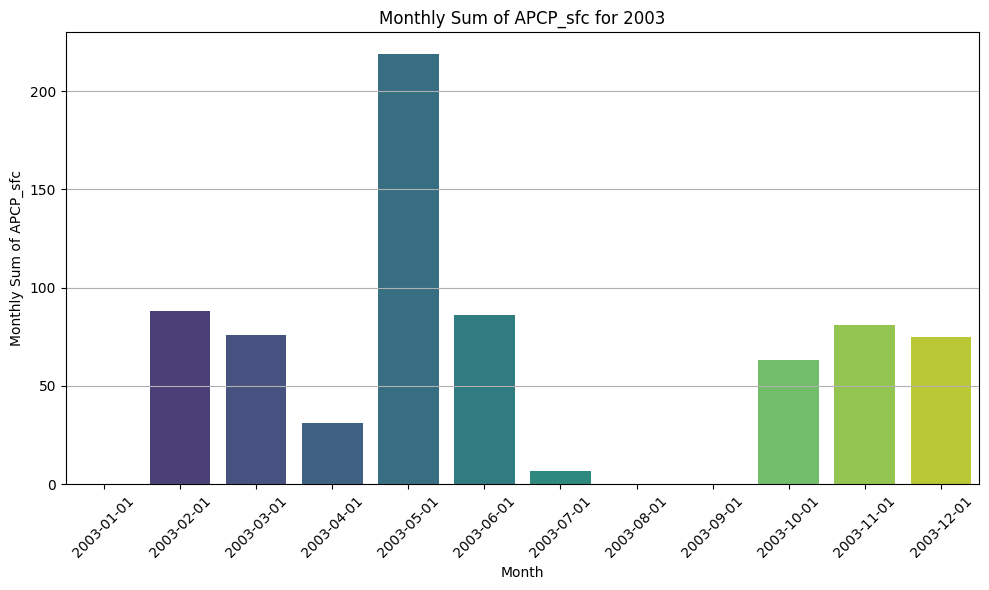

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


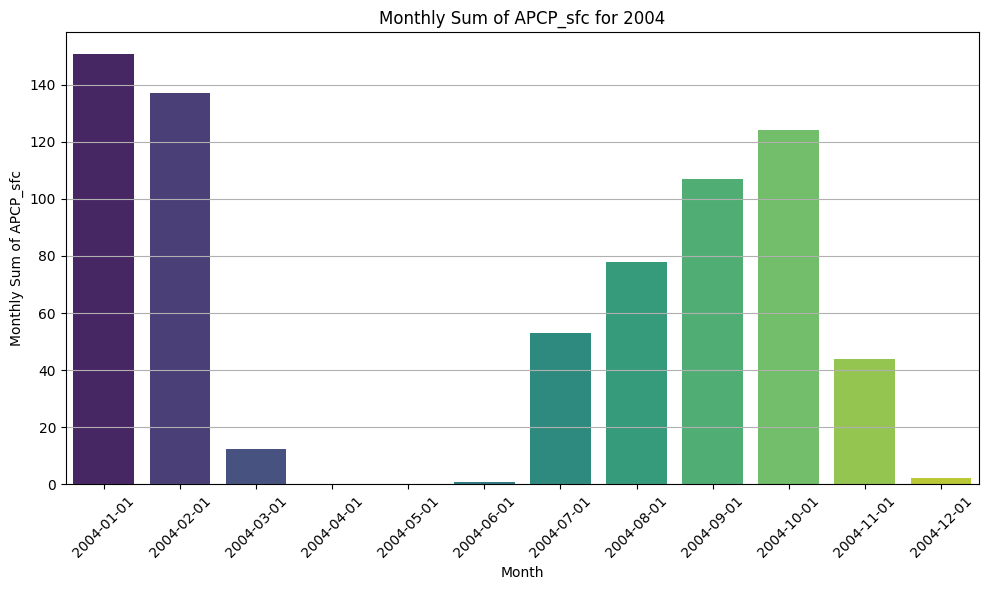

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


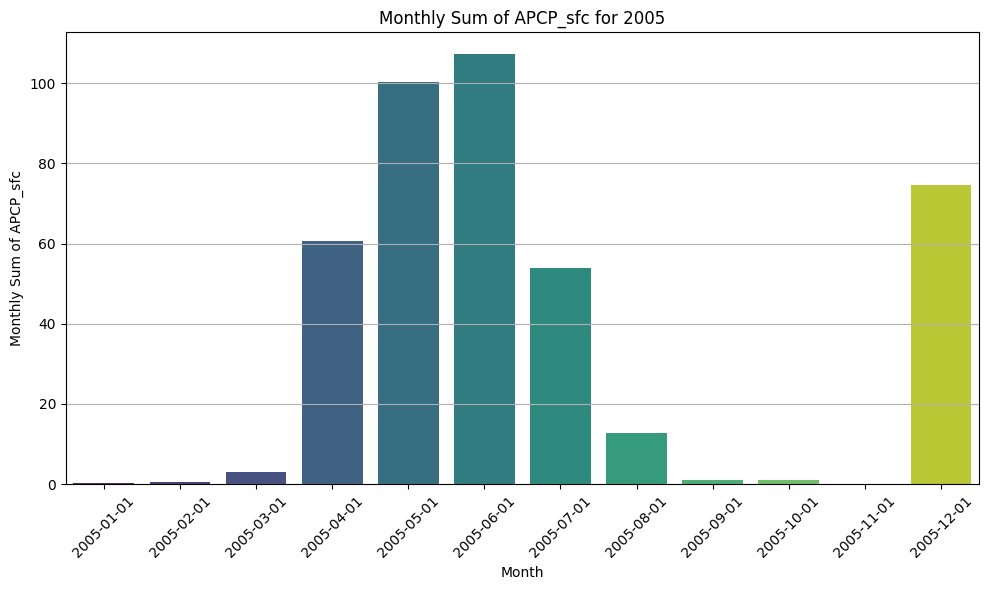

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


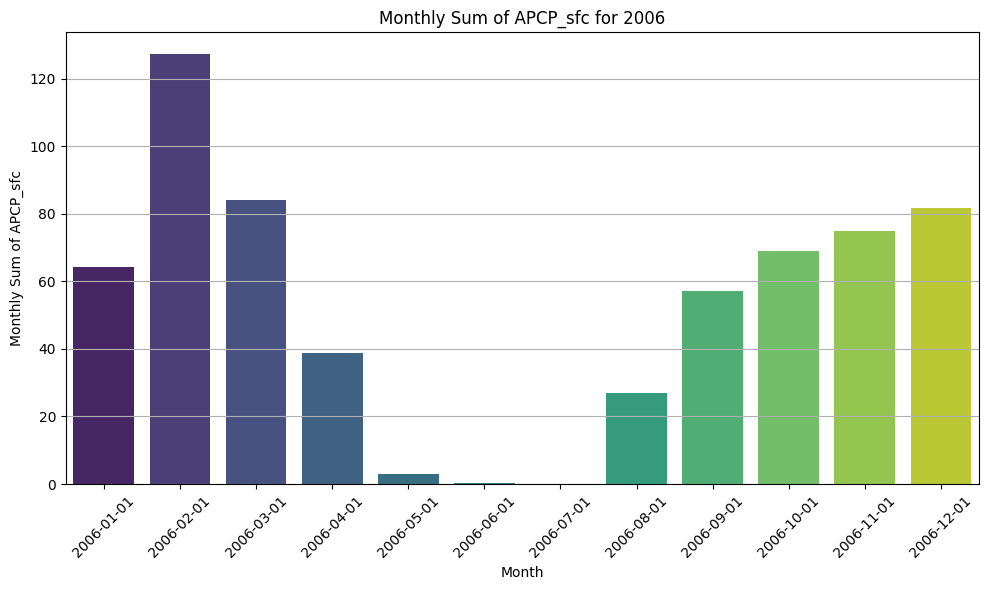

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


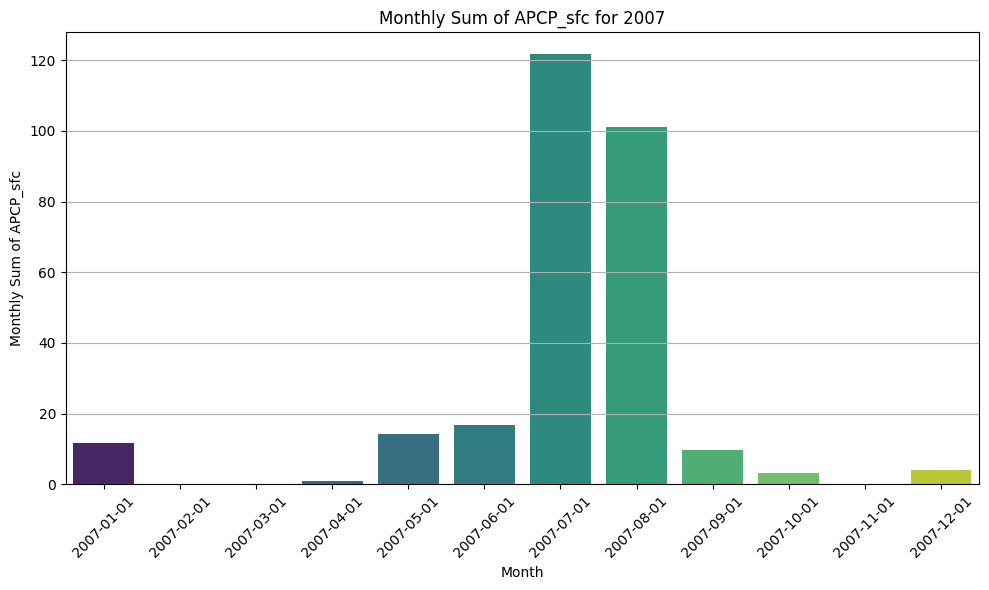

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


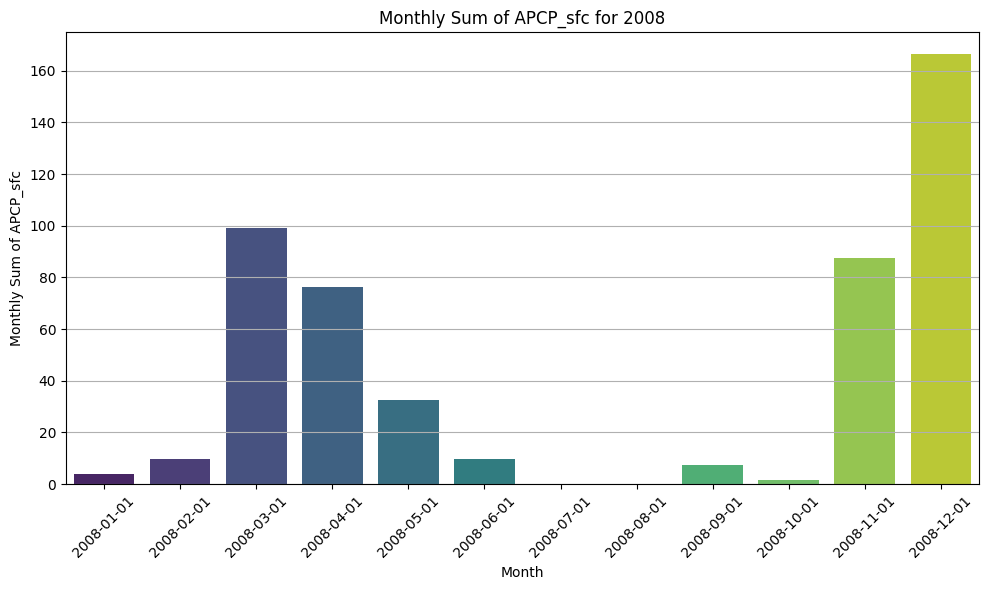

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


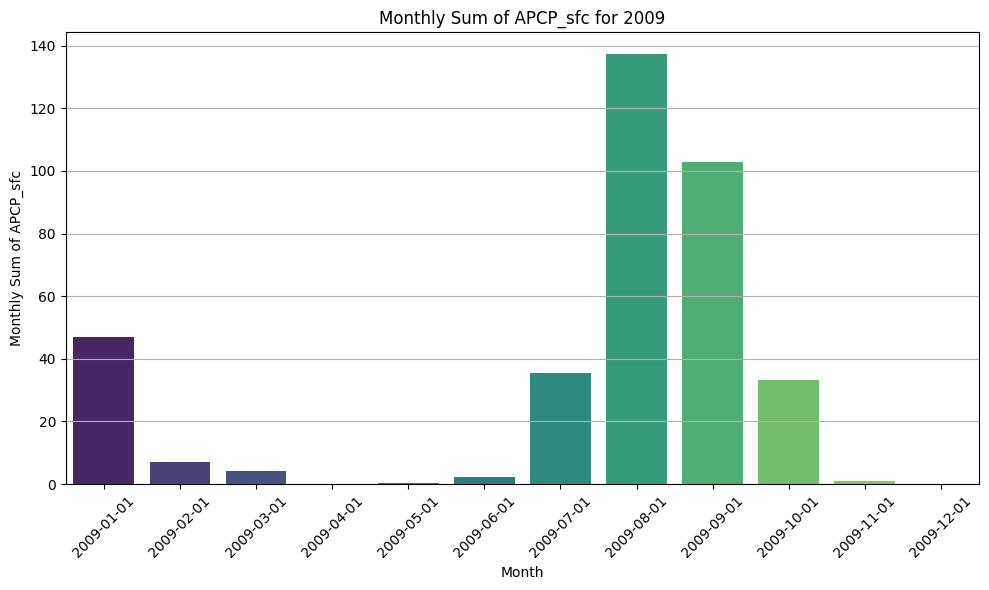

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


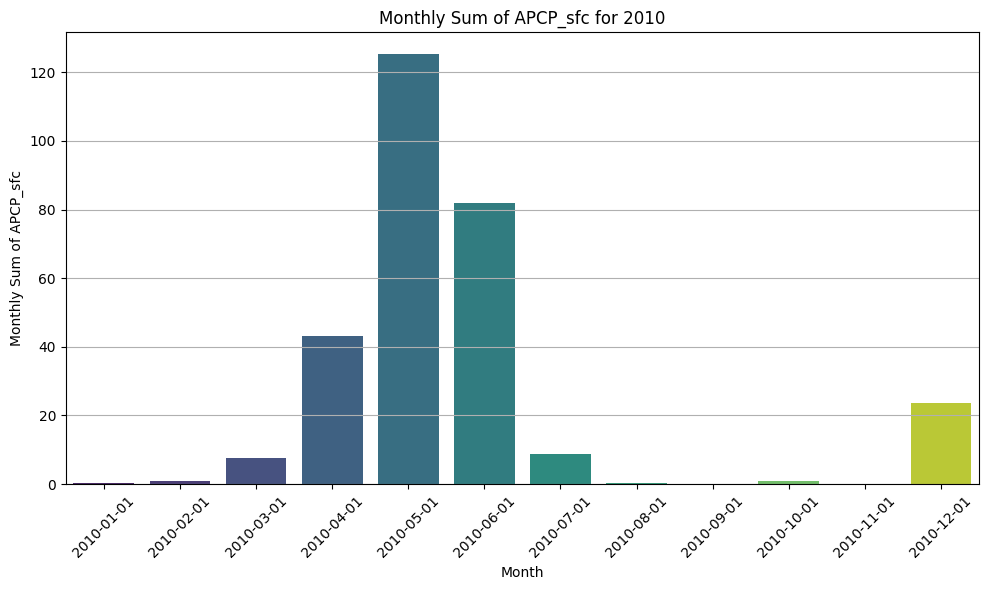

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


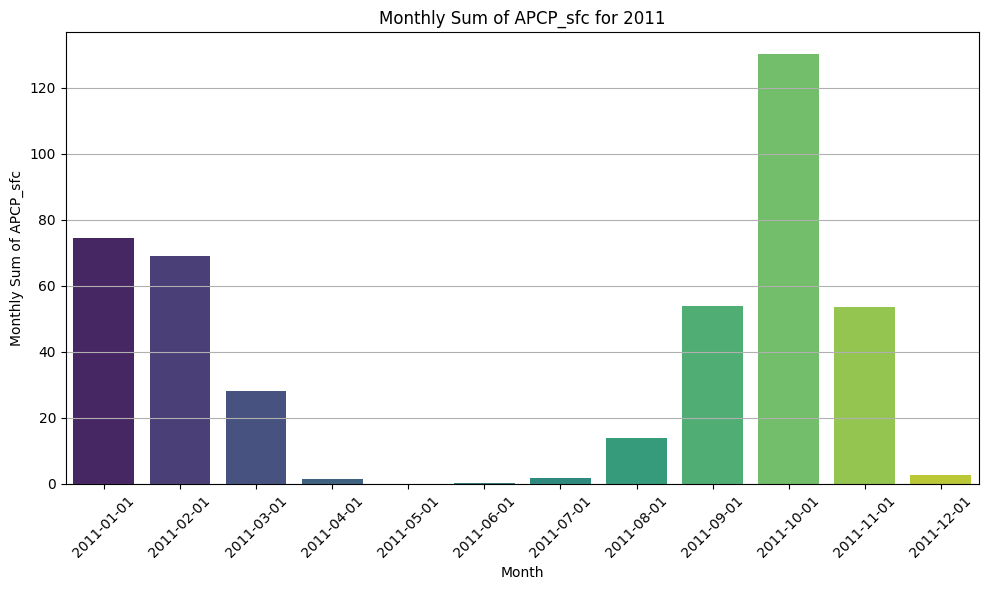

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


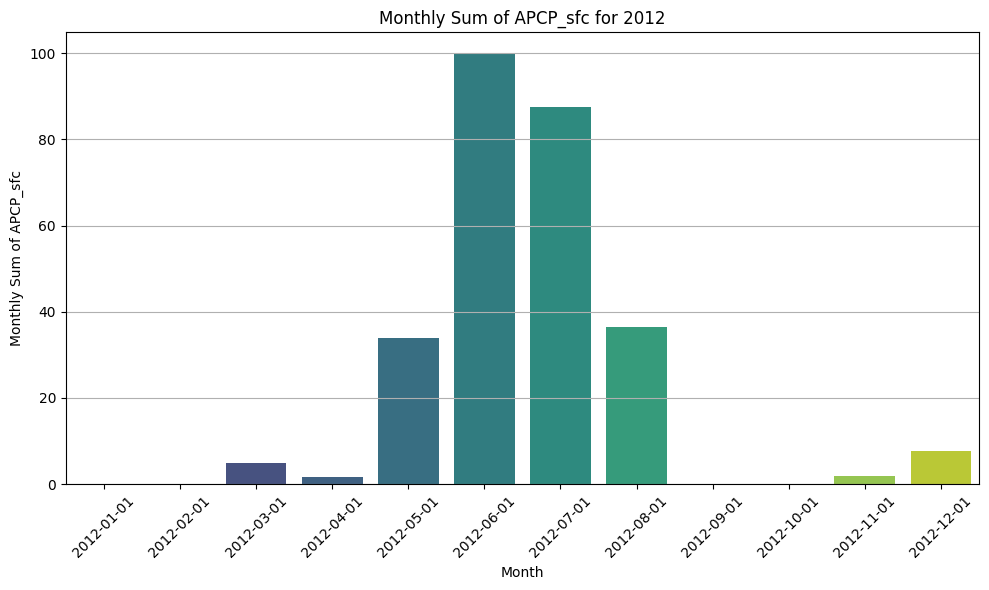

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


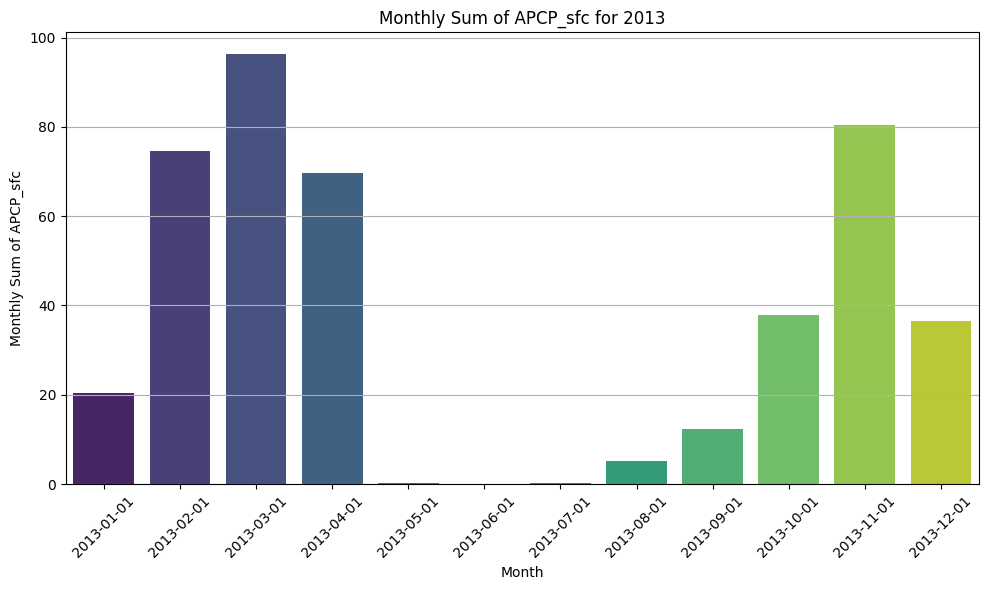

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


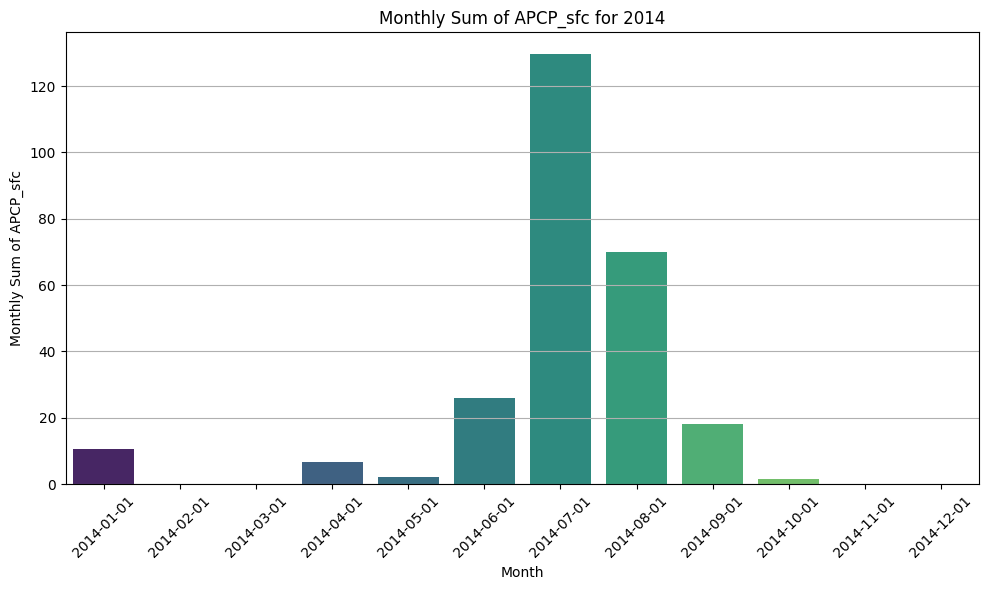

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


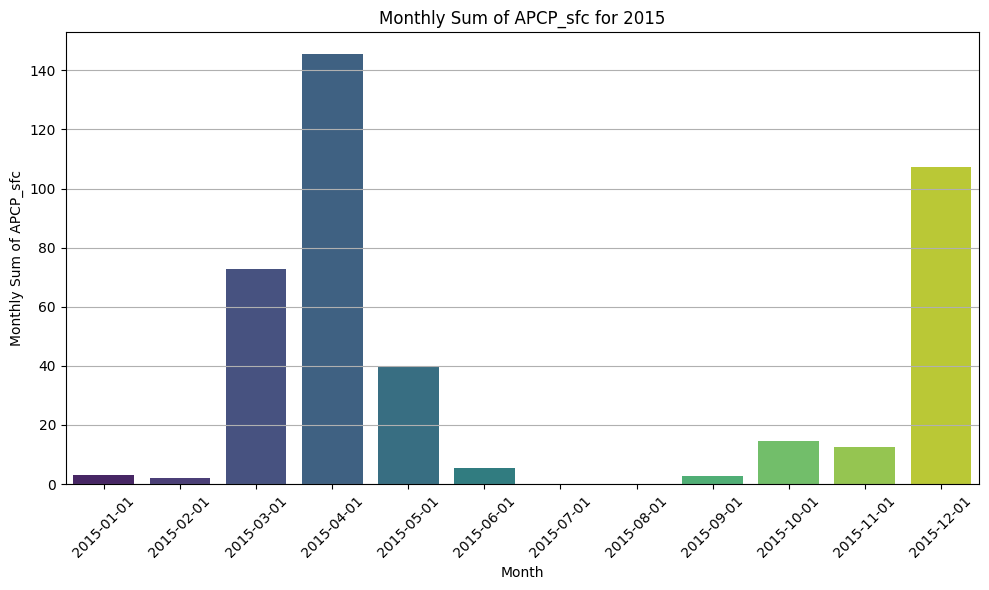

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


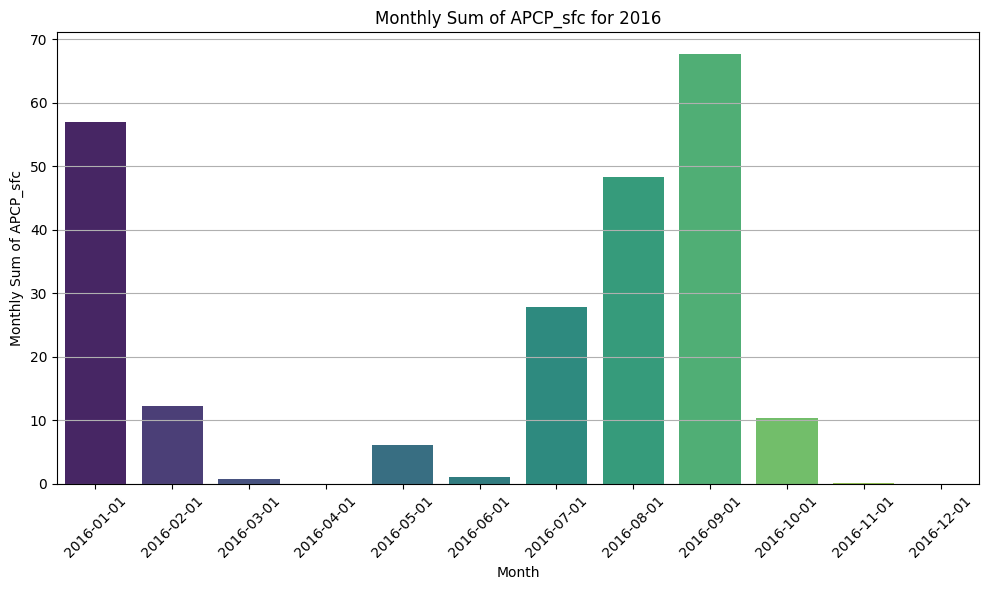

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


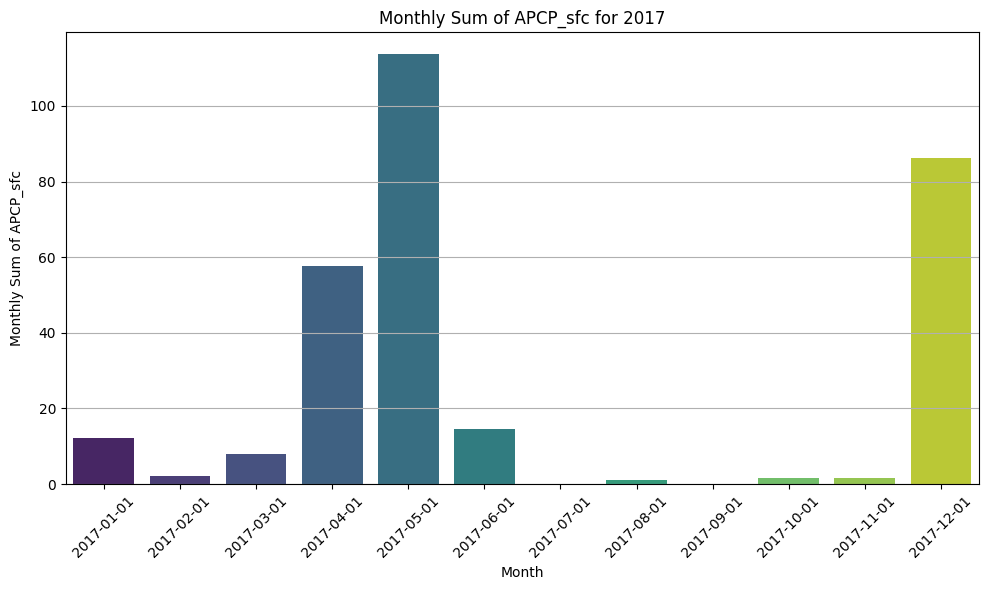

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


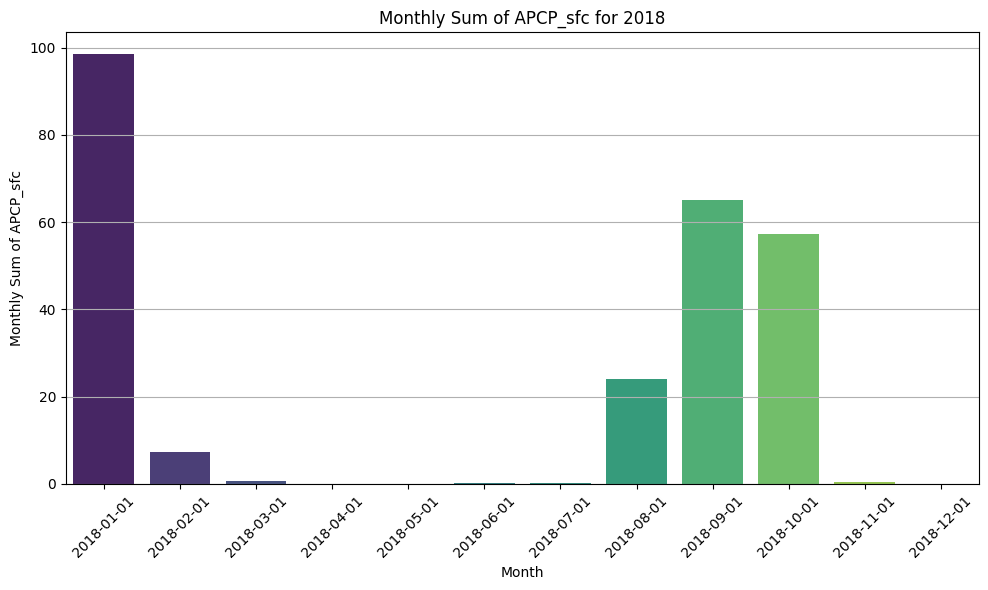

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


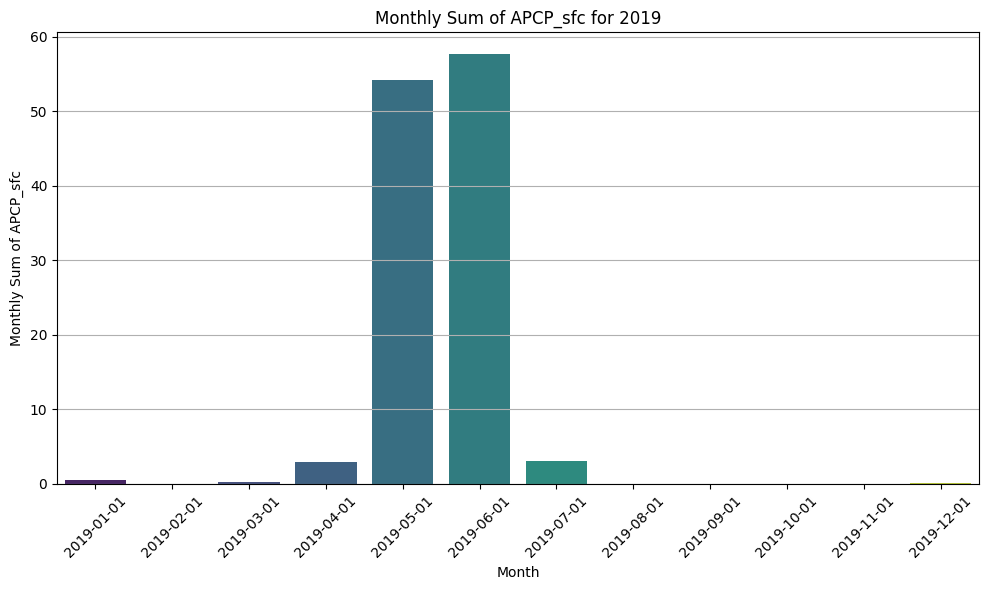

/tmp/ipykernel_36372/578848620.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')


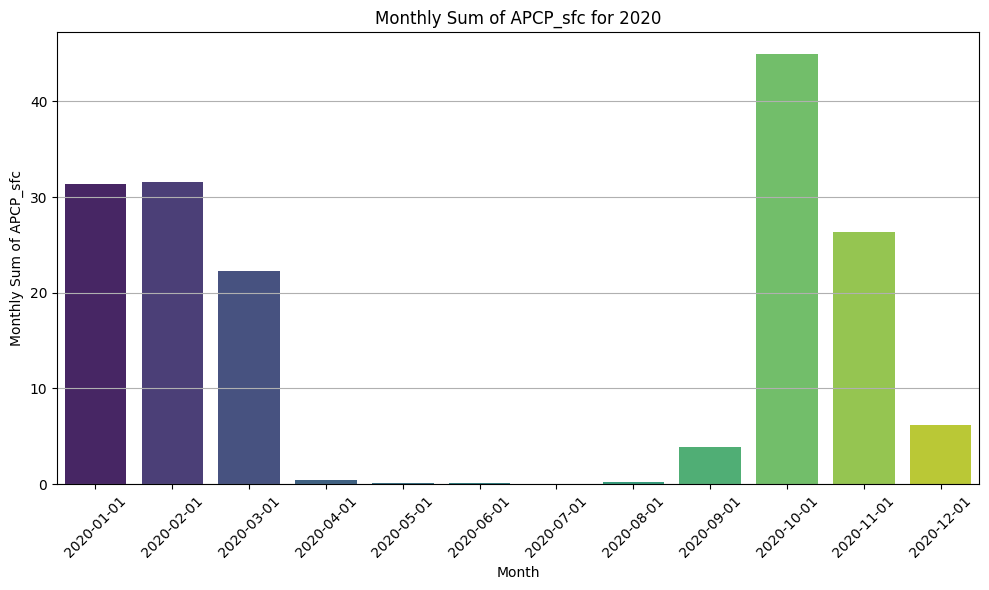

In [186]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Convert 'time' to datetime
data['time'] = pd.to_datetime(data['time'])

# Extract month and year
data['year'] = data['time'].dt.year
data['month'] = data['time'].dt.month

# Calculate the monthly sum of APCP_sfc
monthly_sum = data.groupby(['year', 'month'])['APCP_sfc'].sum().reset_index()

# Create a new column for a datetime object for plotting
monthly_sum['date'] = pd.to_datetime(monthly_sum[['year', 'month']].assign(day=1))

# Get unique years for plotting
years = monthly_sum['year'].unique()

# Create separate plots for each year
for year in years:
    plt.figure(figsize=(10, 6))
    yearly_data = monthly_sum[monthly_sum['year'] == year]
    sns.barplot(x='date', y='APCP_sfc', data=yearly_data, palette='viridis')
    plt.title(f'Monthly Sum of APCP_sfc for {year}')
    plt.xlabel('Month')
    plt.ylabel('Monthly Sum of APCP_sfc')
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


### Total Yearly Precipitation over period of 1990-2020

/tmp/ipykernel_36372/82155411.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='year', y='APCP_sfc', data=yearly_sum, palette='viridis')


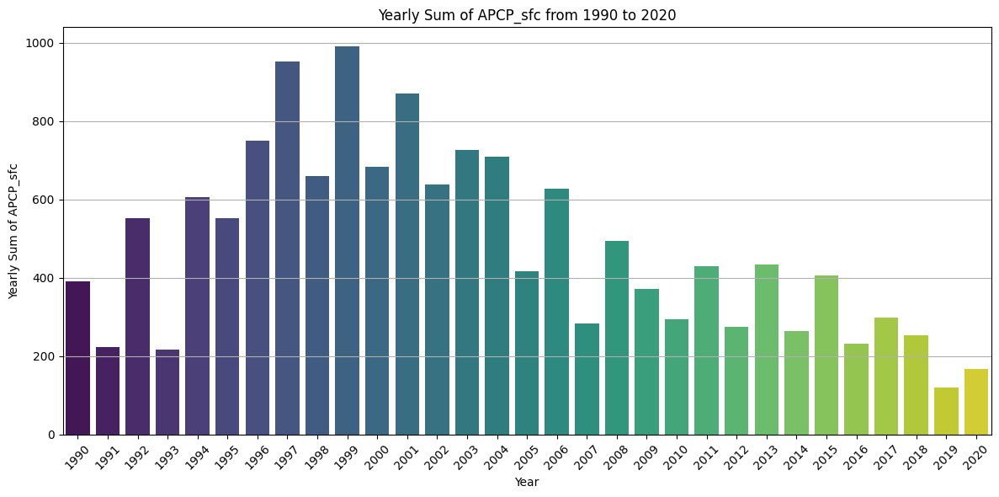

In [187]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Convert 'time' to datetime
data['time'] = pd.to_datetime(data['time'])

# Extract year
data['year'] = data['time'].dt.year

# Calculate the yearly sum of APCP_sfc
yearly_sum = data.groupby('year')['APCP_sfc'].sum().reset_index()

# Create a bar plot for yearly sums of APCP_sfc
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='APCP_sfc', data=yearly_sum, palette='viridis')
plt.title('Yearly Sum of APCP_sfc from 1990 to 2020')
plt.xlabel('Year')
plt.ylabel('Yearly Sum of APCP_sfc')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### Mean yearly precipitation

/tmp/ipykernel_36372/3706588073.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='year', y='APCP_sfc', data=yearly_mean, palette='viridis')


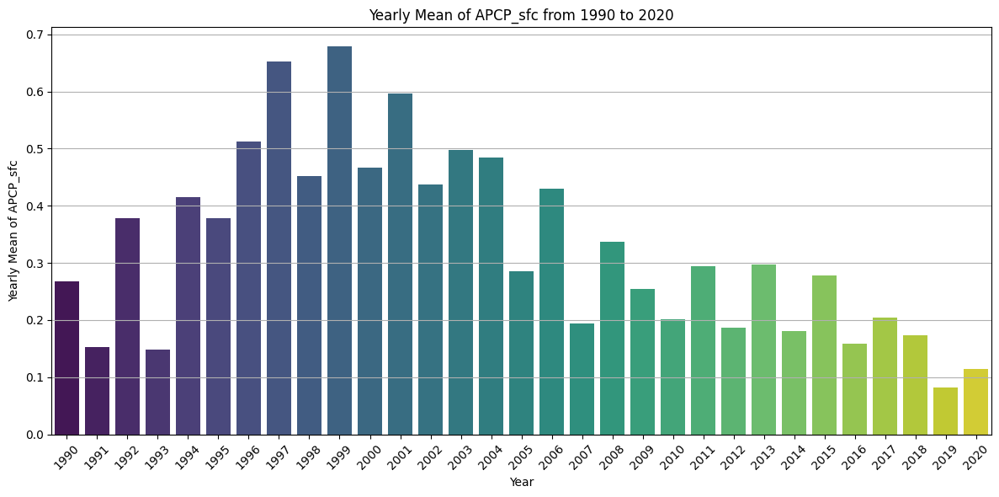

In [188]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Convert 'time' to datetime
data['time'] = pd.to_datetime(data['time'])

# Extract year
data['year'] = data['time'].dt.year

# Calculate the yearly mean of APCP_sfc
yearly_mean = data.groupby('year')['APCP_sfc'].mean().reset_index()

# Create a bar plot for yearly mean of APCP_sfc
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='APCP_sfc', data=yearly_mean, palette='viridis')
plt.title('Yearly Mean of APCP_sfc from 1990 to 2020')
plt.xlabel('Year')
plt.ylabel('Yearly Mean of APCP_sfc')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### Total precipitation coordinate wise

/tmp/ipykernel_36372/1255229182.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='coordinate_id', y='APCP_sfc', data=sum_apcp, palette='viridis')


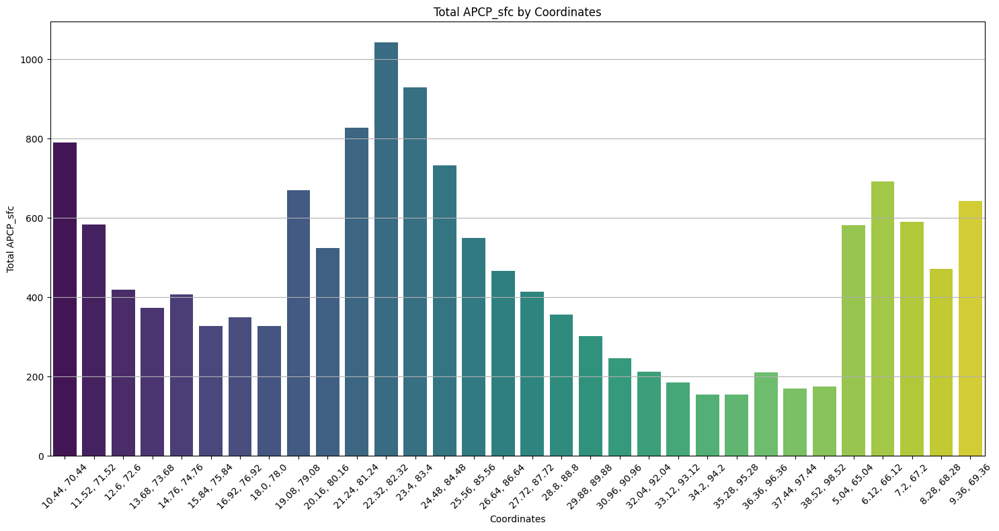

In [189]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Limit decimal values of latitude and longitude to 3 places
data['updated_lat'] = data['updated_lat'].round(3)
data['updated_lon'] = data['updated_lon'].round(3)

# Combine latitude and longitude into a single coordinate identifier
data['coordinate_id'] = data['updated_lat'].astype(str) + ', ' + data['updated_lon'].astype(str)

# Calculate the sum of APCP_sfc for each coordinate
sum_apcp = data.groupby('coordinate_id')['APCP_sfc'].sum().reset_index()

# Create a bar plot for total APCP_sfc by coordinates
plt.figure(figsize=(15, 8))
sns.barplot(x='coordinate_id', y='APCP_sfc', data=sum_apcp, palette='viridis')
plt.title('Total APCP_sfc by Coordinates')
plt.xlabel('Coordinates')
plt.ylabel('Total APCP_sfc')
plt.xticks(rotation=45)  # Rotate x-ticks for better visibility
plt.grid(axis='y')
plt.tight_layout()  # Adjust layout to make room for x-ticks
plt.show()


In [190]:
%pip install scikit-learn
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [191]:
%pip install Pillow


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [192]:
%pip install pandas numpy scikit-learn matplotlib


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Run after this 

Split data

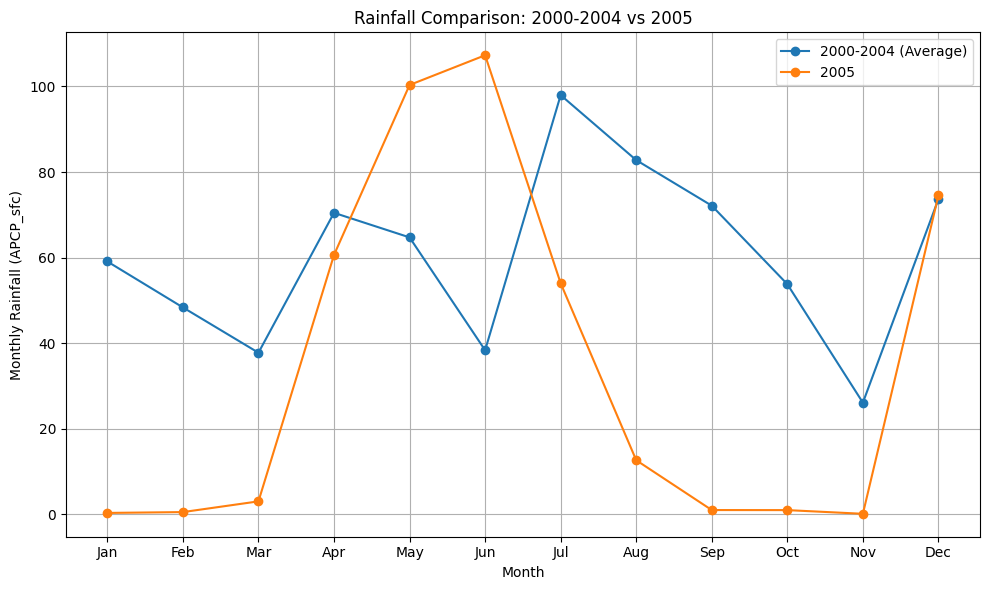

Percentage differences between 1995-2000 and 2005:
    month  percentage_difference
0       1             -99.392017
1       2             -98.853433
2       3             -91.896808
3       4             -13.962047
4       5              55.005551
5       6             179.600977
6       7             -44.871468
7       8             -84.694648
8       9             -98.570655
9      10             -98.112386
10     11             -99.401878
11     12               1.172430


In [193]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Convert 'time' to datetime
data['time'] = pd.to_datetime(data['time'])

# Extract month and year
data['year'] = data['time'].dt.year
data['month'] = data['time'].dt.month

# Calculate the monthly sum of APCP_sfc
monthly_sum = data.groupby(['year', 'month'])['APCP_sfc'].sum().reset_index()

# Create a datetime object for plotting
monthly_sum['date'] = pd.to_datetime(monthly_sum[['year', 'month']].assign(day=1))

# Define periods for comparison
period1 = monthly_sum[(monthly_sum['year'] >= 2000) & (monthly_sum['year'] <= 2004)]
specific_year = monthly_sum[monthly_sum['year'] == 2005]

# Calculate average for period1
period1_avg = period1.groupby('month')['APCP_sfc'].mean().reset_index()
specific_year_data = specific_year[['month', 'APCP_sfc']]

# Merge the datasets for comparison
comparison = pd.merge(period1_avg, specific_year_data, on='month', suffixes=('_period1', '_specific_year'))

# Plot the comparison
plt.figure(figsize=(10, 6))
plt.plot(comparison['month'], comparison['APCP_sfc_period1'], label='2000-2004 (Average)', marker='o')
plt.plot(comparison['month'], comparison['APCP_sfc_specific_year'], label='2005', marker='o')
plt.title('Rainfall Comparison: 2000-2004 vs 2005')
plt.xlabel('Month')
plt.ylabel('Monthly Rainfall (APCP_sfc)')
plt.xticks(comparison['month'], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Compute percentage difference for analysis
comparison['percentage_difference'] = (
    (comparison['APCP_sfc_specific_year'] - comparison['APCP_sfc_period1']) / comparison['APCP_sfc_period1'] * 100
)

# Print percentage differences
print("Percentage differences between 1995-2000 and 2005:")
print(comparison[['month', 'percentage_difference']])

# Optional: Save comparison results to a CSV file
comparison.to_csv('rainfall_comparison.csv', index=False)


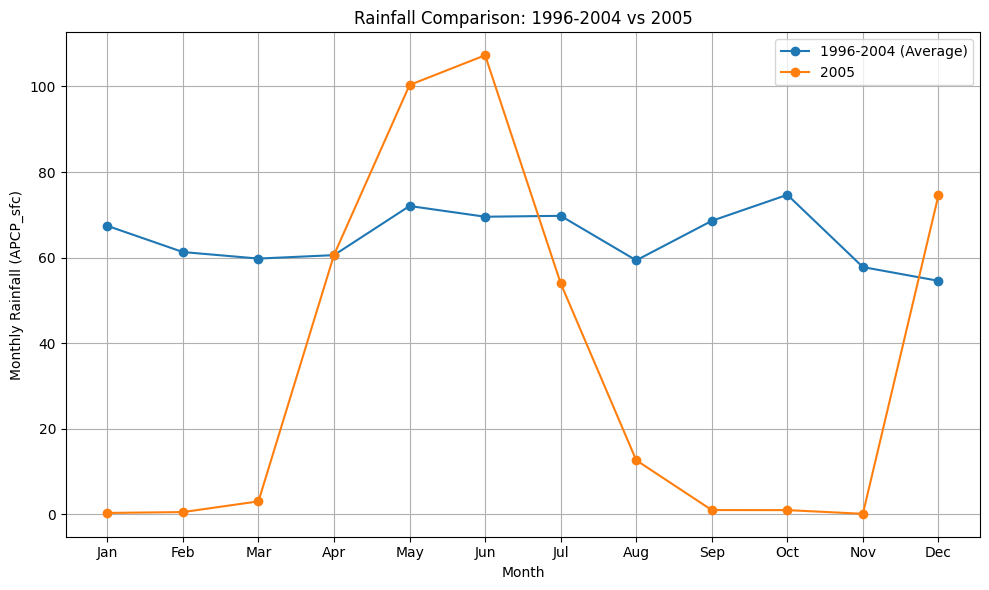

Percentage differences between 1995-2000 and 2005:
    month  percentage_difference
0       1             -99.467127
1       2             -99.095337
2       3             -94.878049
3       4               0.074492
4       5              39.232807
5       6              54.233735
6       7             -22.589072
7       8             -78.658519
8       9             -98.496868
9      10             -98.640215
10     11             -99.729693
11     12              36.579161


In [194]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Convert 'time' to datetime
data['time'] = pd.to_datetime(data['time'])

# Extract month and year
data['year'] = data['time'].dt.year
data['month'] = data['time'].dt.month

# Calculate the monthly sum of APCP_sfc
monthly_sum = data.groupby(['year', 'month'])['APCP_sfc'].sum().reset_index()

# Create a datetime object for plotting
monthly_sum['date'] = pd.to_datetime(monthly_sum[['year', 'month']].assign(day=1))

# Define periods for comparison
period1 = monthly_sum[(monthly_sum['year'] >=1996 ) & (monthly_sum['year'] <= 2004)]
specific_year = monthly_sum[monthly_sum['year'] == 2005]

# Calculate average for period1
period1_avg = period1.groupby('month')['APCP_sfc'].mean().reset_index()
specific_year_data = specific_year[['month', 'APCP_sfc']]

# Merge the datasets for comparison
comparison = pd.merge(period1_avg, specific_year_data, on='month', suffixes=('_period1', '_specific_year'))

# Plot the comparison
plt.figure(figsize=(10, 6))
plt.plot(comparison['month'], comparison['APCP_sfc_period1'], label='1996-2004 (Average)', marker='o')
plt.plot(comparison['month'], comparison['APCP_sfc_specific_year'], label='2005', marker='o')
plt.title('Rainfall Comparison: 1996-2004 vs 2005')
plt.xlabel('Month')
plt.ylabel('Monthly Rainfall (APCP_sfc)')
plt.xticks(comparison['month'], labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Compute percentage difference for analysis
comparison['percentage_difference'] = (
    (comparison['APCP_sfc_specific_year'] - comparison['APCP_sfc_period1']) / comparison['APCP_sfc_period1'] * 100
)

# Print percentage differences
print("Percentage differences between 1995-2000 and 2005:")
print(comparison[['month', 'percentage_difference']])

# Optional: Save comparison results to a CSV file
comparison.to_csv('rainfall_comparison.csv', index=False)


Seasonal trend

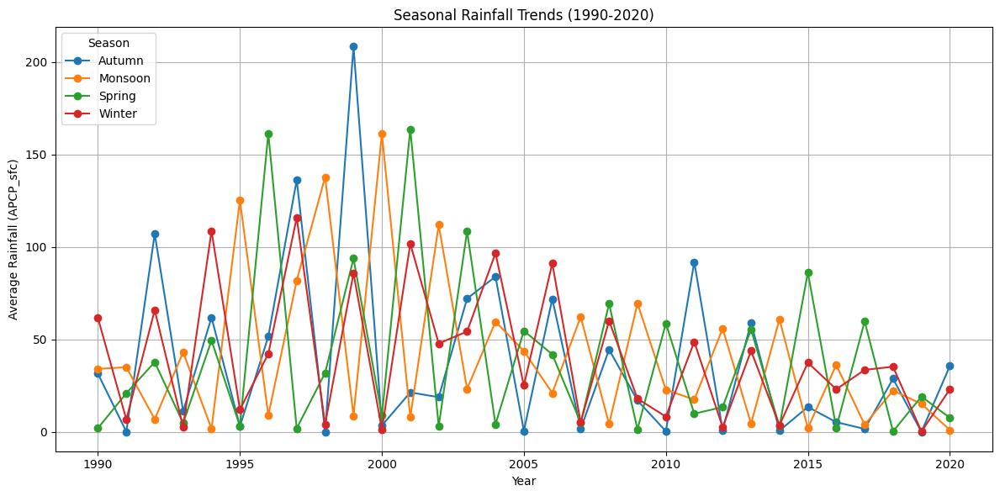

In [195]:
# Define seasons based on months
def assign_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8, 9]:
        return 'Monsoon'
    else:
        return 'Autumn'

# Assign seasons to the data
monthly_sum['season'] = monthly_sum['month'].apply(assign_season)

# Aggregate data by season and year
seasonal_data = monthly_sum.groupby(['year', 'season'])['APCP_sfc'].mean().reset_index()

# Pivot the data for easier visualization
seasonal_pivot = seasonal_data.pivot(index='year', columns='season', values='APCP_sfc')

# Plot seasonal trends
seasonal_pivot.plot(kind='line', figsize=(12, 6), marker='o')
plt.title('Seasonal Rainfall Trends (1990-2020)')
plt.ylabel('Average Rainfall (APCP_sfc)')
plt.xlabel('Year')
plt.legend(title='Season', loc='upper left')
plt.grid()
plt.tight_layout()
plt.show()


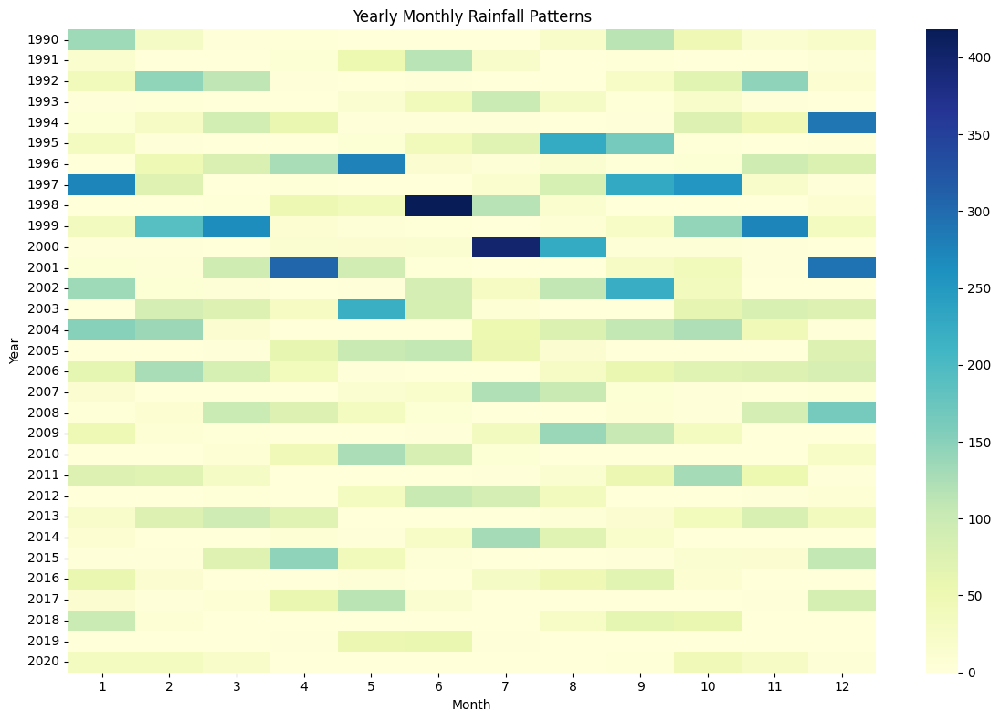

In [196]:
# Pivot data for heatmap
heatmap_data = monthly_sum.pivot(index='year', columns='month', values='APCP_sfc')

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=False, cbar=True)
plt.title('Yearly Monthly Rainfall Patterns')
plt.xlabel('Month')
plt.ylabel('Year')
plt.tight_layout()
plt.show()


Wettest year: 1999.0 with total rainfall: 990.3437500000032 mm
Driest year: 2019.0 with total rainfall: 118.88281250000122 mm


/tmp/ipykernel_36372/2838091041.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='year', y='APCP_sfc', data=total_rainfall_per_year[total_rainfall_per_year['year'].isin([wettest_year['year'], driest_year['year']])], palette='viridis')


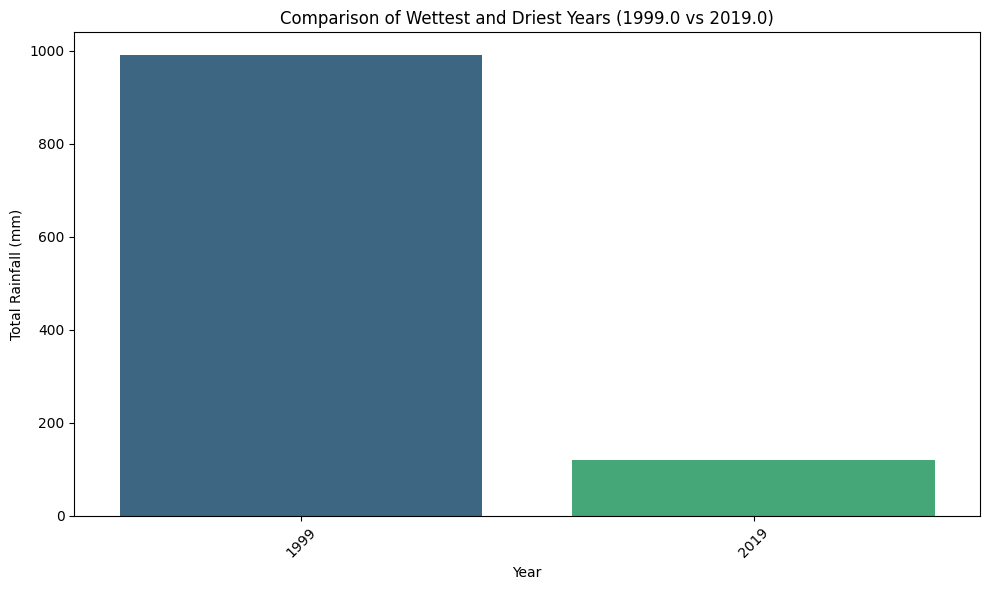

/tmp/ipykernel_36372/2838091041.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='month', y='APCP_sfc', data=monthly_rainfall_wettest, palette='Blues')
/tmp/ipykernel_36372/2838091041.py:56: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='month', y='APCP_sfc', data=monthly_rainfall_driest, palette='Oranges')


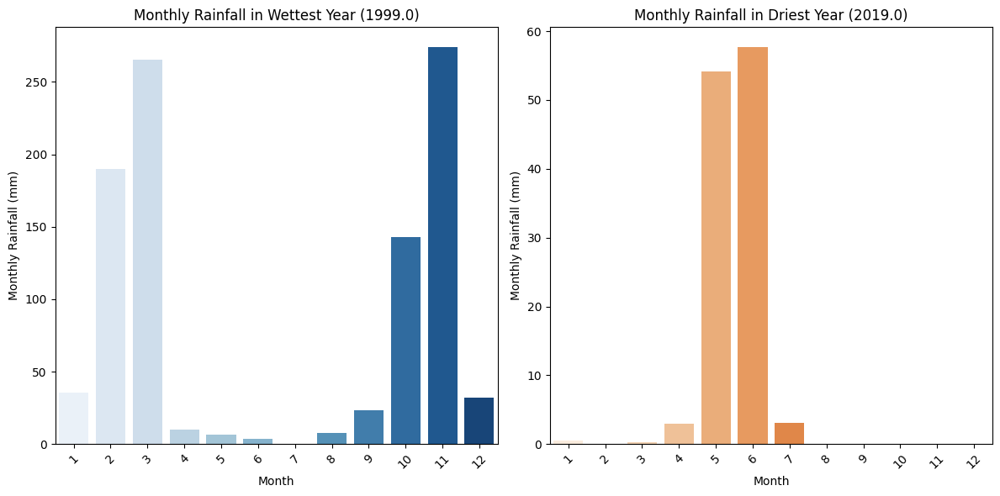

In [197]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your data
data = pd.read_csv('Complete_data.csv')

# Convert 'time' to datetime
data['time'] = pd.to_datetime(data['time'])

# Extract year and month
data['year'] = data['time'].dt.year
data['month'] = data['time'].dt.month

# Calculate total rainfall for each year
total_rainfall_per_year = data.groupby('year')['APCP_sfc'].sum().reset_index()

# Identify the wettest and driest years based on total rainfall
wettest_year = total_rainfall_per_year.loc[total_rainfall_per_year['APCP_sfc'].idxmax()]
driest_year = total_rainfall_per_year.loc[total_rainfall_per_year['APCP_sfc'].idxmin()]

print(f"Wettest year: {wettest_year['year']} with total rainfall: {wettest_year['APCP_sfc']} mm")
print(f"Driest year: {driest_year['year']} with total rainfall: {driest_year['APCP_sfc']} mm")

# Plot the total rainfall for wettest and driest years (side-by-side bar plot)
plt.figure(figsize=(10, 6))
sns.barplot(x='year', y='APCP_sfc', data=total_rainfall_per_year[total_rainfall_per_year['year'].isin([wettest_year['year'], driest_year['year']])], palette='viridis')
plt.title(f'Comparison of Wettest and Driest Years ({wettest_year["year"]} vs {driest_year["year"]})')
plt.xlabel('Year')
plt.ylabel('Total Rainfall (mm)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Now, compare month-by-month breakdown of the wettest and driest years
wettest_data = data[data['year'] == wettest_year['year']]
driest_data = data[data['year'] == driest_year['year']]

# Calculate the monthly rainfall for the wettest and driest years
monthly_rainfall_wettest = wettest_data.groupby('month')['APCP_sfc'].sum().reset_index()
monthly_rainfall_driest = driest_data.groupby('month')['APCP_sfc'].sum().reset_index()

# Plot the month-by-month rainfall for the wettest and driest years (side-by-side bar plot)
plt.figure(figsize=(12, 6))

# Wettest year
plt.subplot(1, 2, 1)
sns.barplot(x='month', y='APCP_sfc', data=monthly_rainfall_wettest, palette='Blues')
plt.title(f'Monthly Rainfall in Wettest Year ({wettest_year["year"]})')
plt.xlabel('Month')
plt.ylabel('Monthly Rainfall (mm)')
plt.xticks(rotation=45)

# Driest year
plt.subplot(1, 2, 2)
sns.barplot(x='month', y='APCP_sfc', data=monthly_rainfall_driest, palette='Oranges')
plt.title(f'Monthly Rainfall in Driest Year ({driest_year["year"]})')
plt.xlabel('Month')
plt.ylabel('Monthly Rainfall (mm)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


### Adding Additional features

In [198]:
import pandas as pd
import os

# URL of the dataset
url = "https://www.cpc.ncep.noaa.gov/data/indices/darwin"  # Replace with the exact file URL

# Read the data as space-separated values, skipping unnecessary rows
data = pd.read_csv(url, delim_whitespace=True, skiprows=3, header=None)

# Define the column names
column_names = ["YEAR", "JAN", "FEB", "MAR", "APR", "MAY", "JUN", "JUL", "AUG", "SEP", "OCT", "NOV", "DEC"]
data.columns = column_names

# Remove any rows where "YEAR" is not numeric (handles extra rows like headers)
data = data[pd.to_numeric(data["YEAR"], errors="coerce").notna()].reset_index(drop=True)

data_sliced = data[166:]

# Inspect the data structure
print(data_sliced.head())

# Create the external_data folder if it doesn't exist
os.makedirs("external_data", exist_ok=True)

# Save it to a CSV file in the external_data folder
data_sliced.to_csv("external_data/darwin_data.csv", index=False)



/tmp/ipykernel_36372/2834203811.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, skiprows=3, header=None)


     YEAR   JAN   FEB   MAR   APR   MAY   JUN   JUL   AUG   SEP   OCT   NOV  \
166  1969  -0.8  -0.5  -0.0   0.9  -0.4  -0.2   0.1   0.0  -0.4   0.7   0.2   
167  1970   1.4   0.3  -1.0   0.1  -0.8  -1.0   0.3  -1.3  -1.9  -1.9  -1.3   
168  1971  -0.8  -2.1  -2.1  -1.7  -1.0   0.1  -0.8  -1.5  -1.3  -1.1  -0.5   
169  1972  -0.8  -1.6  -1.5   0.6   2.0  -0.1   0.3   0.4   1.3   1.7   0.8   
170  1973   0.6   1.3  -1.2  -0.8  -0.6  -1.8  -0.9  -1.7  -0.8  -0.7  -2.9   

      DEC  
166  -0.4  
167  -2.0  
168  -1.4  
169   2.0  
170  -0.7  


In [199]:
import pandas as pd

# Load the original data
input_file = 'external_data/darwin_data.csv'  # Replace with your file name
data = pd.read_csv(input_file)

# Melt the data to transform it into the desired format
data_melted = data.melt(id_vars=['YEAR'], var_name='MON', value_name='val')

# Convert months from string format (e.g., 'JAN', 'FEB') to numeric format (1, 2, ...)
month_mapping = {
    'JAN': 1, 'FEB': 2, 'MAR': 3, 'APR': 4,
    'MAY': 5, 'JUN': 6, 'JUL': 7, 'AUG': 8,
    'SEP': 9, 'OCT': 10, 'NOV': 11, 'DEC': 12
}
data_melted['MON'] = data_melted['MON'].map(month_mapping)

# Rename columns to match the desired format
data_melted.rename(columns={'YEAR': 'YR'}, inplace=True)

# Sort the data by year (YR) and month (MON)
data_melted = data_melted.sort_values(by=['YR', 'MON'])



# Save the result to a new CSV file
output_file = 'external_data/formatted_darwin_data.csv'  # Replace with your desired output file name
data_melted.to_csv(output_file, index=False)

# print("Conversion complete. Data saved to:", output_file)
data_melted


,YR,MON,val
0,1969,1,-0.8
56,1969,2,-0.5
112,1969,3,-0.0
168,1969,4,0.9
224,1969,5,-0.4
...,...,...,...
447,2024,8,0.0
503,2024,9,-0.3
559,2024,10,-0.1-999.9-999.9
615,2024,11,NaN


In [200]:
import pandas as pd

# Define the column names
column_names = ["YEAR", "MON", "darwin", "tahiti", "nino34", "cpolr", "soi"]

# Create an empty dataframe
data_final = pd.DataFrame(columns=column_names)

In [201]:
# Filter the data for the years 1990 to 2020
data_filtered = data_melted[(data_melted['YR'] >= 1990) & (data_melted['YR'] <= 2020)]

# Rename the "val" column to "darwin"
data_final = data_filtered.rename(columns={"val": "darwin"})

# Optionally, you can check the result
data_final


,YR,MON,darwin
21,1990,1,0.2
77,1990,2,2.9
133,1990,3,-0.0
189,1990,4,-0.2
245,1990,5,-1.1
...,...,...,...
443,2020,8,-0.8
499,2020,9,-0.6
555,2020,10,-0.7
611,2020,11,0.1


In [202]:
import pandas as pd
import os

# URL of the dataset
url = "https://www.cpc.ncep.noaa.gov/data/indices/tahiti"  # Replace with the exact file URL

# Read the data as space-separated values, skipping unnecessary rows
data = pd.read_csv(url, delim_whitespace=True, skiprows=3, header=None)

# Define the column names
column_names = ["YEAR", "JAN", "FEB", "MAR", "APR", "MAY", "JUN", "JUL", "AUG", "SEP", "OCT", "NOV", "DEC"]
data.columns = column_names

# Remove any rows where "YEAR" is not numeric (handles extra rows like headers)
data = data[pd.to_numeric(data["YEAR"], errors="coerce").notna()].reset_index(drop=True)

data_sliced = data[166:]

# Inspect the data structure
print(data_sliced.head())

# Create the external_data folder if it doesn't exist
os.makedirs("external_data", exist_ok=True)

# Save it to a CSV file in the external_data folder
data_sliced.to_csv("external_data/tahiti_data.csv", index=False)

/tmp/ipykernel_36372/2854839644.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, skiprows=3, header=None)


     YEAR   JAN   FEB   MAR   APR   MAY   JUN   JUL   AUG   SEP   OCT  NOV  \
166  1969  -3.2  -1.4   0.7   0.3  -0.8   0.1  -0.7  -0.2  -2.0  -0.9  0.1   
167  1970  -0.5  -1.4  -0.1  -0.0  -0.2   0.6  -0.3  -0.3  -0.0  -0.1  1.3   
168  1971  -0.2   1.2   1.7   1.1   0.4   0.7  -0.5   1.0   1.0   1.6  0.3   
169  1972  -0.0   0.2  -0.4   0.4  -0.6  -1.0  -2.1  -0.4  -0.9   0.2  0.2   
170  1973   0.1  -0.9  -0.1  -0.7   0.1   0.0   0.1   0.4   1.2   0.6  1.4   

      DEC  
166   0.2  
167   1.2  
168  -1.0  
169  -0.1  
170   2.3  


In [203]:
import pandas as pd

# Load the original data
input_file = 'external_data/tahiti_data.csv'  # Replace with your file name
data = pd.read_csv(input_file)

# Melt the data to transform it into the desired format
data_melted = data.melt(id_vars=['YEAR'], var_name='MON', value_name='val')

# Convert months from string format (e.g., 'JAN', 'FEB') to numeric format (1, 2, ...)
month_mapping = {
    'JAN': 1, 'FEB': 2, 'MAR': 3, 'APR': 4,
    'MAY': 5, 'JUN': 6, 'JUL': 7, 'AUG': 8,
    'SEP': 9, 'OCT': 10, 'NOV': 11, 'DEC': 12
}
data_melted['MON'] = data_melted['MON'].map(month_mapping)

# Rename columns to match the desired format
data_melted.rename(columns={'YEAR': 'YR'}, inplace=True)

# Sort the data by year (YR) and month (MON)
data_melted = data_melted.sort_values(by=['YR', 'MON'])

# Save the result to a new CSV file
output_file = 'external_data/formatted_tahiti_data.csv'  # Replace with your desired output file name
data_melted.to_csv(output_file, index=False)

print("Conversion complete. Data saved to:", output_file)


Conversion complete. Data saved to: external_data/formatted_tahiti_data.csv


In [204]:
data_melted = data_melted[(data_melted['YR'] >= 1990) & (data_melted['YR'] <= 2020)]
data_melted = data_melted.rename(columns = {"val" : "tahiti"})
data_melted_tahiti = data_melted[['tahiti']]
data_final = pd.concat([data_final, data_melted_tahiti], axis = 1)
data_final

,YR,MON,darwin,tahiti
21,1990,1,0.2,0.1
77,1990,2,2.9,-0.1
133,1990,3,-0.0,-0.8
189,1990,4,-0.2,0.1
245,1990,5,-1.1,0.9
...,...,...,...,...
443,2020,8,-0.8,1.0
499,2020,9,-0.6,0.9
555,2020,10,-0.7,0.1
611,2020,11,0.1,1.2


In [205]:
import pandas as pd
import requests

url = "https://www.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/detrend.nino34.ascii.txt"

response = requests.get(url)
data = response.text

with open("nino34_data.txt", "w") as file:
    file.write(data)

data_df = pd.read_fwf("nino34_data.txt")



data_df.to_csv("external_data/nino34_data.csv", index=False)
data_df


,YR,MON,TOTAL,ClimAdjust ANOM
0,1950,1,24.56,26.18 -1.62
1,1950,2,25.07,26.39 -1.32
2,1950,3,25.88,26.95 -1.07
3,1950,4,26.29,27.39 -1.11
4,1950,5,26.19,27.56 -1.37
...,...,...,...,...
893,2024,6,27.91,27.73 0.18
894,2024,7,27.34,27.29 0.05
895,2024,8,26.74,26.86 -0.11
896,2024,9,26.47,26.72 -0.25


In [206]:
import pandas as pd
import requests

# Download the file
url = "https://www.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/detrend.nino34.ascii.txt"
response = requests.get(url)
data = response.text

# Write the data to a text file
with open("nino34_data.txt", "w") as file:
    file.write(data)

# Read the data into a DataFrame
data_df = pd.read_csv("nino34_data.txt", delim_whitespace=True, header=None, skiprows=1)

# Assign the proper column names
data_df.columns = ['YR', 'MON', 'TOTAL_nino', 'ClimAdjust_nino', 'ANOM_nino']

# Check if the columns are split correctly


# Save the cleaned data to CSV
data_df.to_csv("external_data/nino34_data_new.csv", index=False)
data_df


/tmp/ipykernel_36372/1584638157.py:14: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data_df = pd.read_csv("nino34_data.txt", delim_whitespace=True, header=None, skiprows=1)


,YR,MON,TOTAL_nino,ClimAdjust_nino,ANOM_nino
0,1950,1,24.56,26.18,-1.62
1,1950,2,25.07,26.39,-1.32
2,1950,3,25.88,26.95,-1.07
3,1950,4,26.29,27.39,-1.11
4,1950,5,26.19,27.56,-1.37
...,...,...,...,...,...
893,2024,6,27.91,27.73,0.18
894,2024,7,27.34,27.29,0.05
895,2024,8,26.74,26.86,-0.11
896,2024,9,26.47,26.72,-0.25


In [207]:
data_df_features = data_df[(data_df['YR'] >= 1990) & (data_df['YR'] <= 2020)]
# data_df_features = data_df_features[["TOTAL_nino", "ClimAdjust_nino", "ANOM_nino"]]
data_df_features

,YR,MON,TOTAL_nino,ClimAdjust_nino,ANOM_nino
480,1990,1,26.56,26.46,0.11
481,1990,2,26.98,26.66,0.31
482,1990,3,27.34,27.14,0.20
483,1990,4,27.90,27.58,0.33
484,1990,5,28.02,27.68,0.34
...,...,...,...,...,...
847,2020,8,26.27,26.86,-0.59
848,2020,9,25.89,26.72,-0.83
849,2020,10,25.46,26.72,-1.25
850,2020,11,25.28,26.70,-1.42


In [208]:
# Merging the two dataframes on the 'YR' and 'MON' columns
data_final = pd.merge(data_final, data_df_features, on=['YR', 'MON'], how='inner')

# Check the merged result
data_final

,YR,MON,darwin,tahiti,TOTAL_nino,ClimAdjust_nino,ANOM_nino
0,1990,1,0.2,0.1,26.56,26.46,0.11
1,1990,2,2.9,-0.1,26.98,26.66,0.31
2,1990,3,-0.0,-0.8,27.34,27.14,0.20
3,1990,4,-0.2,0.1,27.90,27.58,0.33
4,1990,5,-1.1,0.9,28.02,27.68,0.34
...,...,...,...,...,...,...,...
367,2020,8,-0.8,1.0,26.27,26.86,-0.59
368,2020,9,-0.6,0.9,25.89,26.72,-0.83
369,2020,10,-0.7,0.1,25.46,26.72,-1.25
370,2020,11,0.1,1.2,25.28,26.70,-1.42


In [209]:
import pandas as pd
import requests

url = "https://www.cpc.ncep.noaa.gov/data/indices/cpolr.mth.91-20.ascii"

response = requests.get(url)
data = response.text

with open("cpolr_data.txt", "w") as file:
    file.write(data)

data_df = pd.read_fwf("cpolr_data.txt")

print(data_df.head())

data_df.to_csv("external_data/cpolr_data.csv", index=False)


     YR  MON  CPOLR
0  1991    1   3.76
1  1991    2  -0.64
2  1991    3   3.24
3  1991    4   4.55
4  1991    5   4.20


In [210]:
# Merging the two dataframes on the 'YR' and 'MON' columns
data_final = pd.merge(data_final, data_df, on=['YR', 'MON'], how='inner')

# Check the merged result
data_final

,YR,MON,darwin,tahiti,TOTAL_nino,ClimAdjust_nino,ANOM_nino,CPOLR
0,1991,1,-0.3,0.7,27.04,26.59,0.45,3.76
1,1991,2,-0.3,0.1,27.08,26.79,0.29,-0.64
2,1991,3,1.1,-0.1,27.33,27.28,0.05,3.24
3,1991,4,0.0,-1.0,28.02,27.70,0.32,4.55
4,1991,5,1.0,-0.7,28.20,27.80,0.40,4.20
...,...,...,...,...,...,...,...,...
355,2020,8,-0.8,1.0,26.27,26.86,-0.59,7.44
356,2020,9,-0.6,0.9,25.89,26.72,-0.83,8.75
357,2020,10,-0.7,0.1,25.46,26.72,-1.25,11.11
358,2020,11,0.1,1.2,25.28,26.70,-1.42,15.42


In [211]:
import pandas as pd
import os

# URL of the dataset
url = "https://www.cpc.ncep.noaa.gov/data/indices/soi"  # Replace with the exact file URL

# Read the data as space-separated values, skipping the first row (header) and the "ANOMALY" row
data = pd.read_csv(url, delim_whitespace=True, skiprows=[0, 1], header=None)

# Define the column names based on the dataset structure
column_names = ["YEAR", "JAN", "FEB", "MAR", "APR", "MAY", "JUN", "JUL", "AUG", "SEP", "OCT", "NOV", "DEC"]
data.columns = column_names

# Remove any rows where "YEAR" is not numeric (handles extra rows like headers)
data = data[pd.to_numeric(data["YEAR"], errors="coerce").notna()].reset_index(drop=True)

data_sliced = data[85:]

# Inspect the data structure
print(data_sliced.head())

# Create the external_data folder if it doesn't exist
os.makedirs("external_data", exist_ok=True)

# Save it to a CSV file in the external_data folder
data_sliced.to_csv("external_data/soi_data.csv", index=False)


/tmp/ipykernel_36372/2424700851.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(url, delim_whitespace=True, skiprows=[0, 1], header=None)


    YEAR   JAN   FEB   MAR   APR   MAY   JUN   JUL   AUG   SEP   OCT   NOV  \
85  1962   2.0  -0.3   0.1   0.2   1.1   0.7   0.1   0.6   0.4   1.0   0.3   
86  1963   1.0   0.6   1.1   0.8   0.4  -0.5  -0.1   0.0  -0.6  -1.2  -0.8   
87  1964  -0.4   0.0   1.1   1.1   0.2   0.8   0.6   1.5   1.3   1.3   0.2   
88  1965  -0.4   0.4   0.8  -0.5   0.2  -0.6  -1.8  -0.7  -1.3  -0.9  -1.5   
89  1966  -1.3  -0.2  -0.9  -0.2  -0.4   0.3   0.1   0.6  -0.2  -0.1  -0.0   

     DEC  
85   0.2  
86  -1.2  
87  -0.3  
88   0.2  
89  -0.3  


In [212]:
import pandas as pd

# Load the original data
input_file = 'external_data/soi_data.csv'  # Replace with your file name
data = pd.read_csv(input_file)

# Melt the data to transform it into the desired format
data_melted = data.melt(id_vars=['YEAR'], var_name='MON', value_name='val')

# Convert months from string format (e.g., 'JAN', 'FEB') to numeric format (1, 2, ...)
month_mapping = {
    'JAN': 1, 'FEB': 2, 'MAR': 3, 'APR': 4,
    'MAY': 5, 'JUN': 6, 'JUL': 7, 'AUG': 8,
    'SEP': 9, 'OCT': 10, 'NOV': 11, 'DEC': 12
}
data_melted['MON'] = data_melted['MON'].map(month_mapping)

# Rename columns to match the desired format
data_melted.rename(columns={'YEAR': 'YR'}, inplace=True)

# Sort the data by year (YR) and month (MON)
data_melted = data_melted.sort_values(by=['YR', 'MON'])

# Save the result to a new CSV file
output_file = 'external_data/formatted_soi_data.csv'  # Replace with your desired output file name
data_melted.to_csv(output_file, index=False)

print("Conversion complete. Data saved to:", output_file)


Conversion complete. Data saved to: external_data/formatted_soi_data.csv


In [213]:
# Merging the two dataframes on the 'YR' and 'MON' columns
data_final = pd.merge(data_final, data_melted, on=['YR', 'MON'], how='inner')

# Check the merged result
data_final = data_final.rename(columns = {"val" : "soi","YR": "year", "MON": "month"})

data_final.to_csv("external_data/data_data.csv")

In [214]:
data = pd.read_csv('Complete_data.csv')  # Replace with the actual filename

# Preprocessing: Convert 'time' to datetime format
data['time'] = pd.to_datetime(data['time'])

# Feature Engineering: Create month and year columns if not already present
data['month'] = data['time'].dt.month
data['year'] = data['time'].dt.year

# Aggregating data monthly by each subdivision (defined by latitude and longitude)
monthly_data = data.groupby(['updated_lat', 'updated_lon', 'year', 'month']).agg({
    'APCP_sfc': 'sum',  # Sum of rainfall (you can adjust based on your data)
    'TMP_2m': 'mean',   # Average temperature at 2m
    'wind_speed': 'mean',  # Average wind speed
    'MTERH_sfc': 'mean',  # Average surface level humidity
    'wind_dir' : 'mean',
    'HGT_prl' : 'mean',
    'TMP_prl' : 'mean'
}).reset_index()

print(monthly_data[['updated_lat', 'updated_lon']].drop_duplicates().shape)

monthly_data = monthly_data[monthly_data['year'] != 1990]

monthly_data.to_csv("external_data/monthly_data.csv")
monthly_data

(32, 2)


,updated_lat,updated_lon,year,month,APCP_sfc,TMP_2m,wind_speed,MTERH_sfc,wind_dir,HGT_prl,TMP_prl
12,5.04,65.04,1991,1,0.000000,296.714722,3.434749,0.359467,39.903787,5784.655000,281.919865
13,5.04,65.04,1991,2,0.000000,292.563680,1.424224,366.359482,135.466413,5743.321667,281.659453
14,5.04,65.04,1991,3,0.000000,287.304565,3.950866,1047.859585,175.475115,5687.155000,282.470640
15,5.04,65.04,1991,4,0.078125,274.781130,1.391135,2095.859925,122.424400,5614.780000,278.646425
16,5.04,65.04,1991,5,2.062500,284.645098,2.956449,291.859519,32.520644,5620.405000,278.930160
...,...,...,...,...,...,...,...,...,...,...,...
11899,38.52,98.52,2020,8,0.015625,268.649190,1.115037,3235.859575,104.493151,5726.272500,285.481907
11900,38.52,98.52,2020,9,0.000000,256.292423,1.025562,4405.026067,152.430397,5674.064167,283.177220
11901,38.52,98.52,2020,10,0.000000,256.000760,1.474274,4097.359400,228.473761,5622.147500,277.474095
11902,38.52,98.52,2020,11,1.265625,288.733390,4.124420,1023.859450,163.914723,5786.337125,286.429605


In [215]:
# Merging the two dataframes on the 'YR' and 'MON' columns
data_final = pd.merge(monthly_data, data_final, on=['year', 'month'], how='inner')

data_final.to_csv("data.csv")

data_final

,updated_lat,updated_lon,year,month,APCP_sfc,TMP_2m,wind_speed,MTERH_sfc,wind_dir,HGT_prl,TMP_prl,darwin,tahiti,TOTAL_nino,ClimAdjust_nino,ANOM_nino,CPOLR,soi
0,5.04,65.04,1991,1,0.000000,296.714722,3.434749,0.359467,39.903787,5784.655000,281.919865,-0.3,0.7,27.04,26.59,0.45,3.76,0.6
1,5.04,65.04,1991,2,0.000000,292.563680,1.424224,366.359482,135.466413,5743.321667,281.659453,-0.3,0.1,27.08,26.79,0.29,-0.64,0.3
2,5.04,65.04,1991,3,0.000000,287.304565,3.950866,1047.859585,175.475115,5687.155000,282.470640,1.1,-0.1,27.33,27.28,0.05,3.24,-0.7
3,5.04,65.04,1991,4,0.078125,274.781130,1.391135,2095.859925,122.424400,5614.780000,278.646425,0.0,-1.0,28.02,27.70,0.32,4.55,-0.6
4,5.04,65.04,1991,5,2.062500,284.645098,2.956449,291.859519,32.520644,5620.405000,278.930160,1.0,-0.7,28.20,27.80,0.40,4.20,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11515,38.52,98.52,2020,8,0.015625,268.649190,1.115037,3235.859575,104.493151,5726.272500,285.481907,-0.8,1.0,26.27,26.86,-0.59,7.44,1.1
11516,38.52,98.52,2020,9,0.000000,256.292423,1.025562,4405.026067,152.430397,5674.064167,283.177220,-0.6,0.9,25.89,26.72,-0.83,8.75,0.9
11517,38.52,98.52,2020,10,0.000000,256.000760,1.474274,4097.359400,228.473761,5622.147500,277.474095,-0.7,0.1,25.46,26.72,-1.25,11.11,0.5
11518,38.52,98.52,2020,11,1.265625,288.733390,4.124420,1023.859450,163.914723,5786.337125,286.429605,0.1,1.2,25.28,26.70,-1.42,15.42,0.7


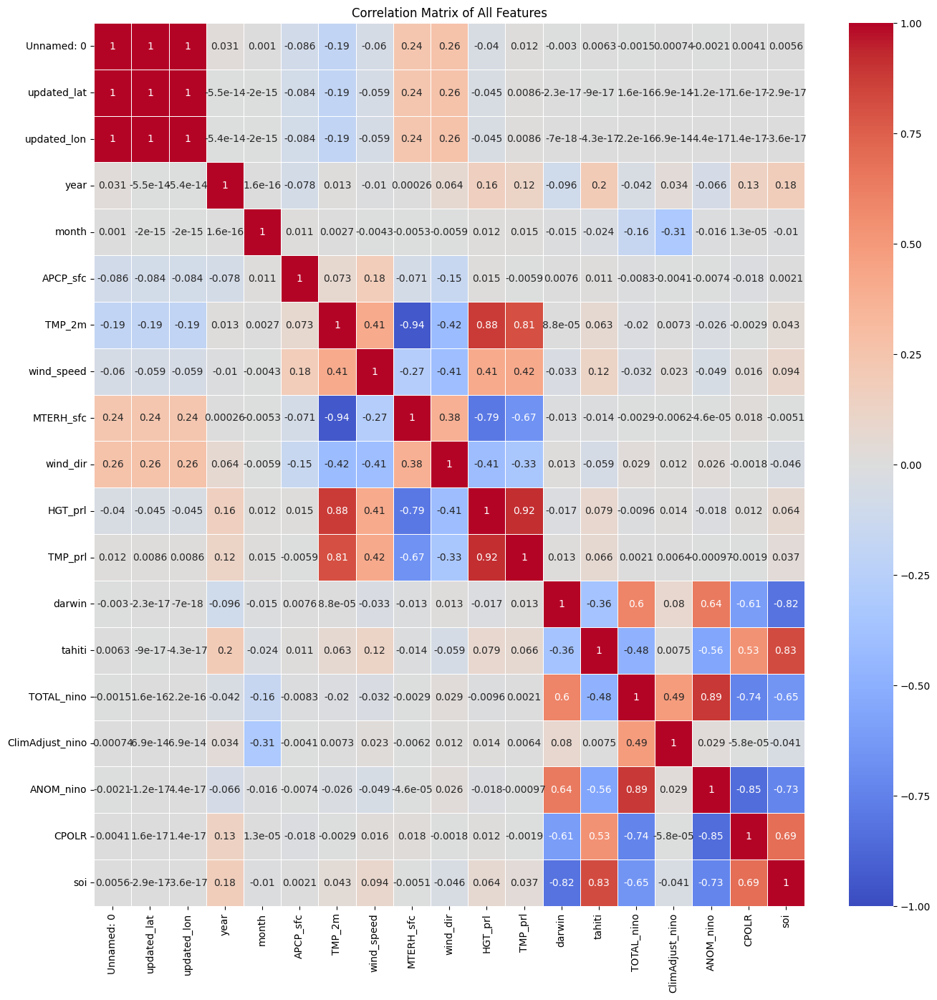

In [216]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('data.csv')

# Select numerical columns (if needed)
# Automatically select numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns

# Compute the correlation matrix for all numerical features
corr_matrix = df[numerical_columns].corr()

# Plot the correlation matrix
plt.figure(figsize=(16, 16))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix of All Features')
plt.show()


### Monthly Subdividional Rainfall prediction for 2000 to 2005 using 2 best parameters

Subdivision: 5.04_65.04, MSE=20.15, RMSE=4.49, R²=-15.94
Subdivision: 6.12_66.12, MSE=33.63, RMSE=5.80, R²=-15.00
Subdivision: 7.2_67.2, MSE=32.43, RMSE=5.69, R²=-35.86
Subdivision: 8.280000000000001_68.28, MSE=6.42, RMSE=2.53, R²=-0.41
Subdivision: 9.36_69.36, MSE=52.21, RMSE=7.23, R²=-0.15
Subdivision: 10.44_70.44, MSE=49.27, RMSE=7.02, R²=-0.12
Subdivision: 11.52_71.52, MSE=1.25, RMSE=1.12, R²=0.53
Subdivision: 12.6_72.6, MSE=8.86, RMSE=2.98, R²=0.07
Subdivision: 13.68_73.67999999999999, MSE=12.68, RMSE=3.56, R²=-0.17
Subdivision: 14.760000000000002_74.75999999999999, MSE=64.75, RMSE=8.05, R²=-0.32
Subdivision: 15.84_75.83999999999999, MSE=34.11, RMSE=5.84, R²=-0.28
Subdivision: 16.92_76.91999999999999, MSE=24.40, RMSE=4.94, R²=-0.24
Subdivision: 18.0_77.99999999999999, MSE=15.51, RMSE=3.94, R²=0.15
Subdivision: 19.08_79.07999999999998, MSE=9.67, RMSE=3.11, R²=0.51
Subdivision: 20.16_80.15999999999998, MSE=8.66, RMSE=2.94, R²=0.46
Subdivision: 21.24_81.23999999999998, MSE=83.44, RMS

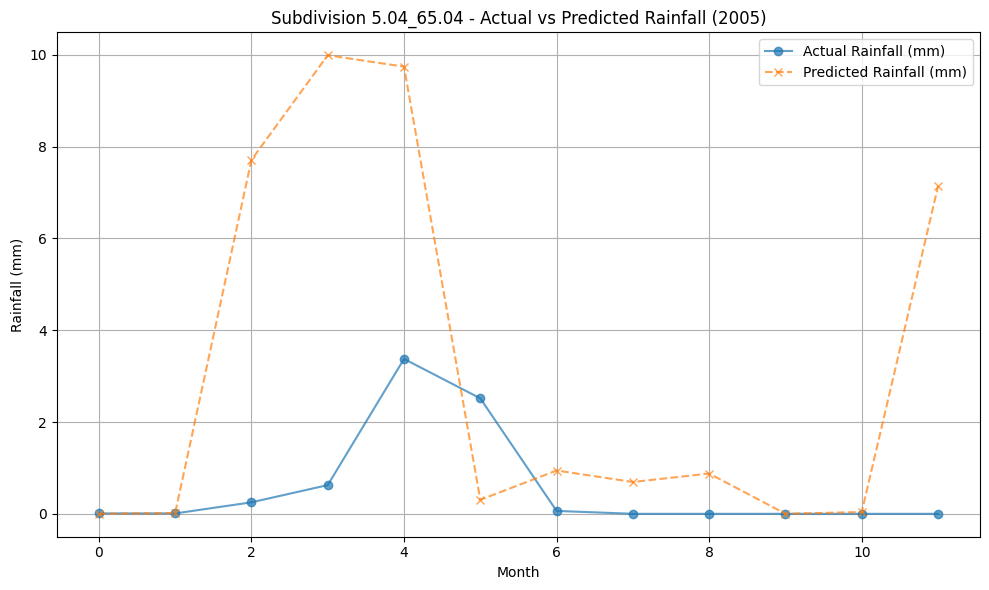

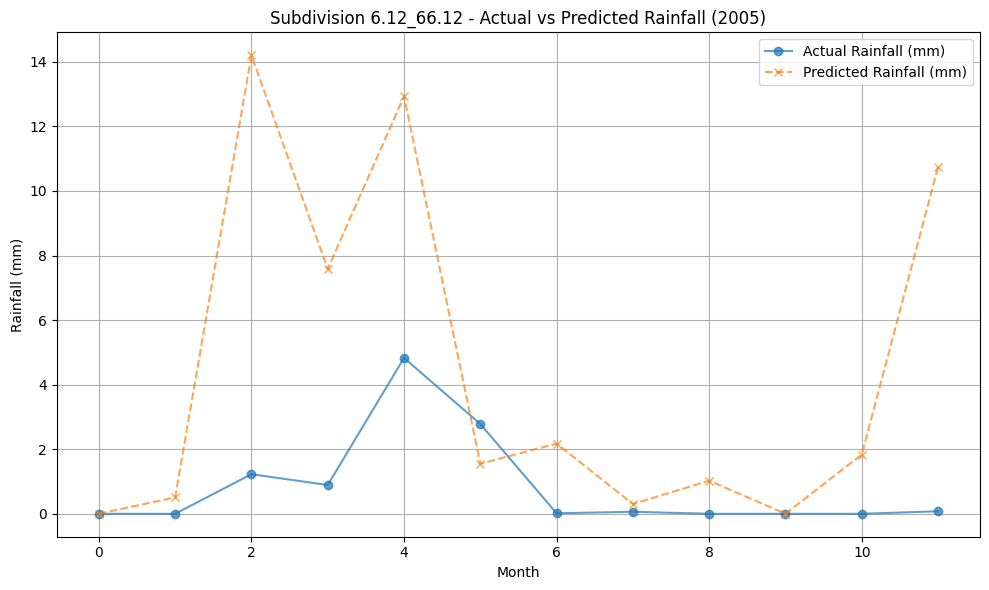

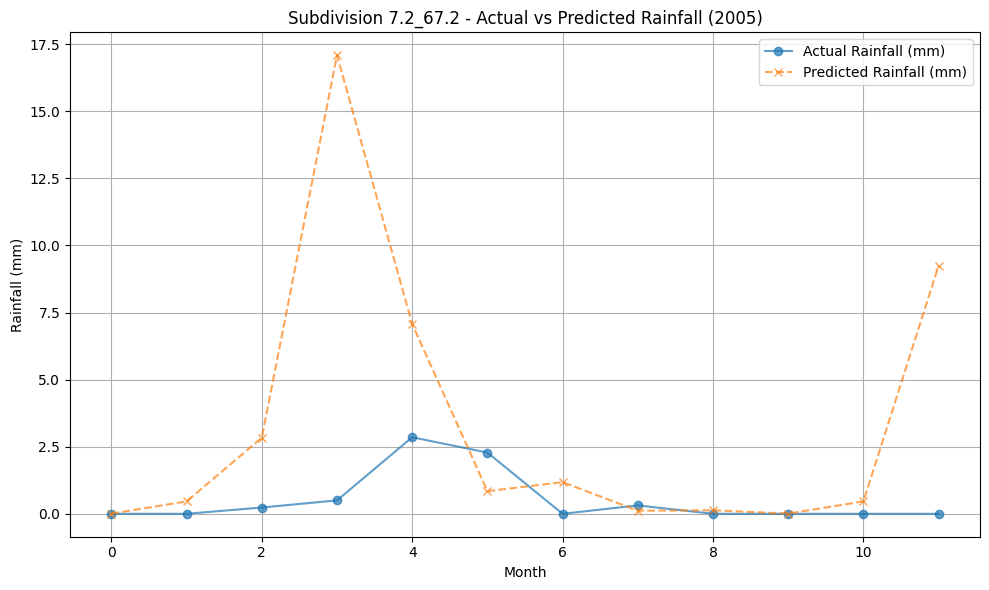

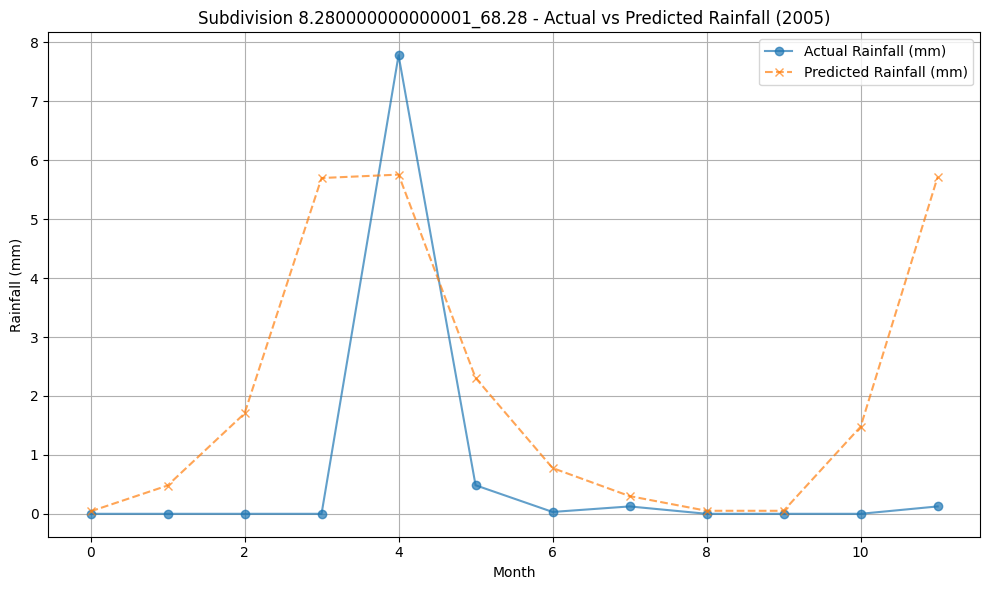

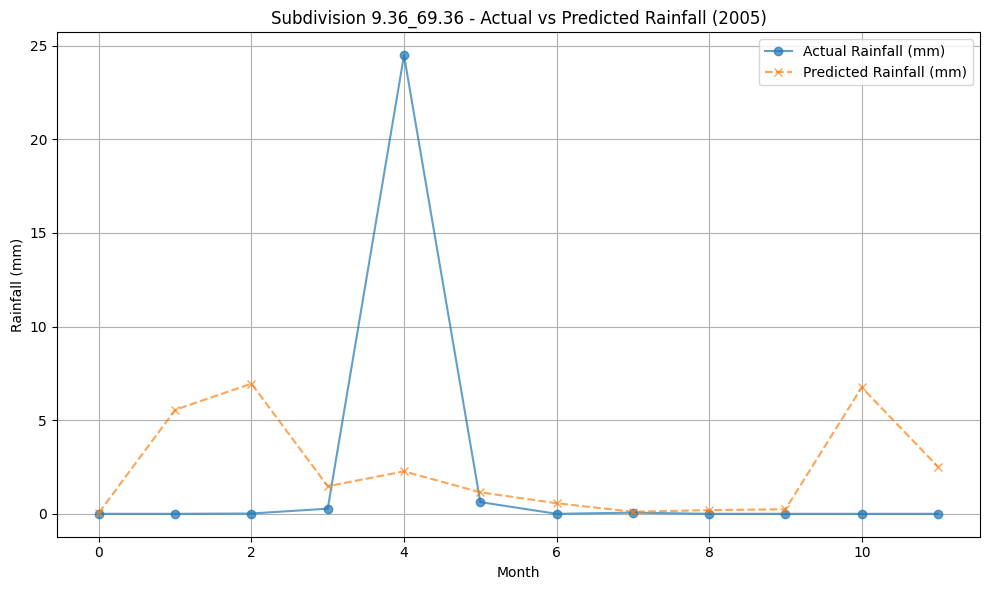

...

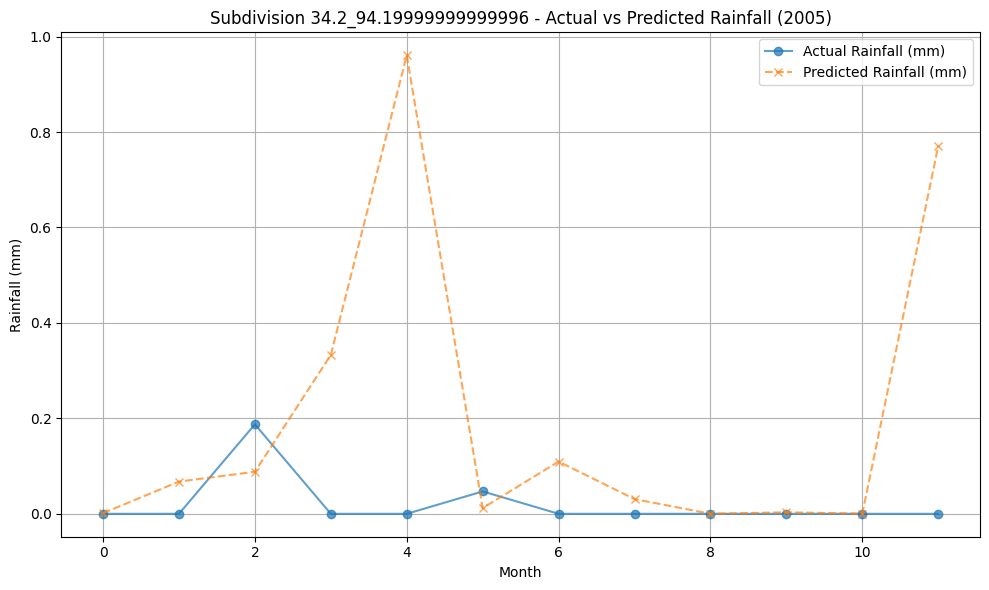

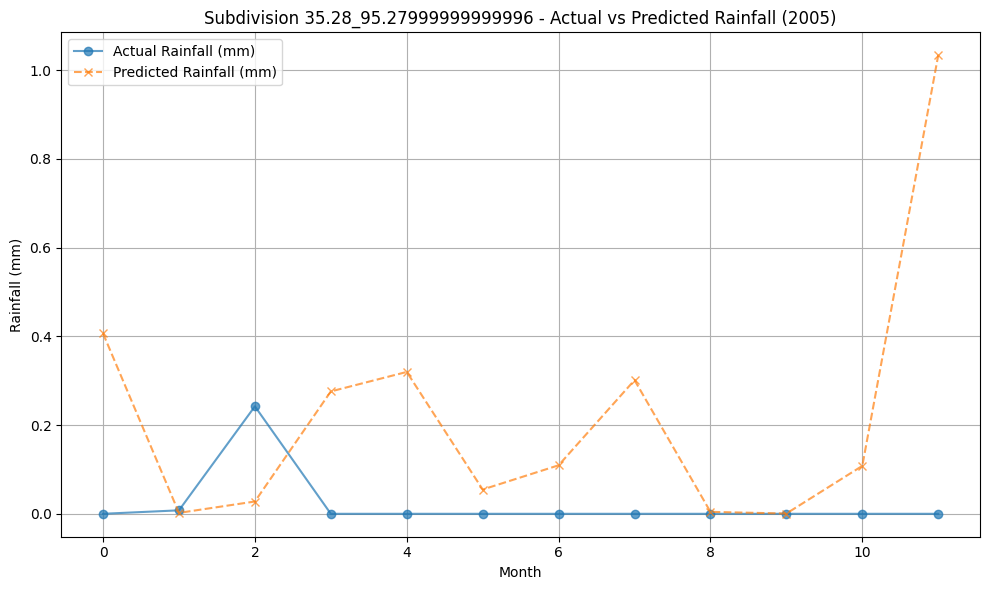

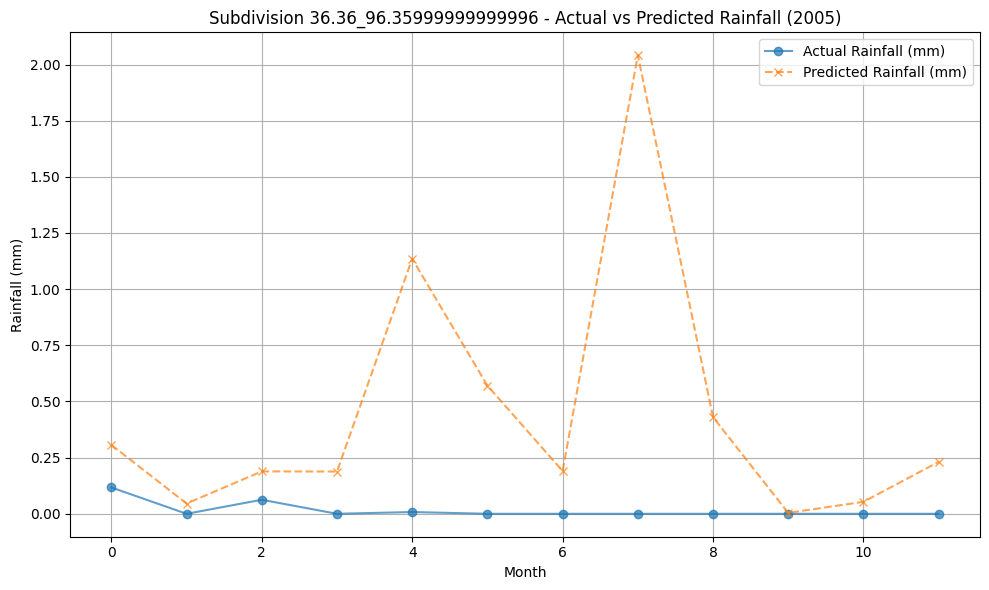

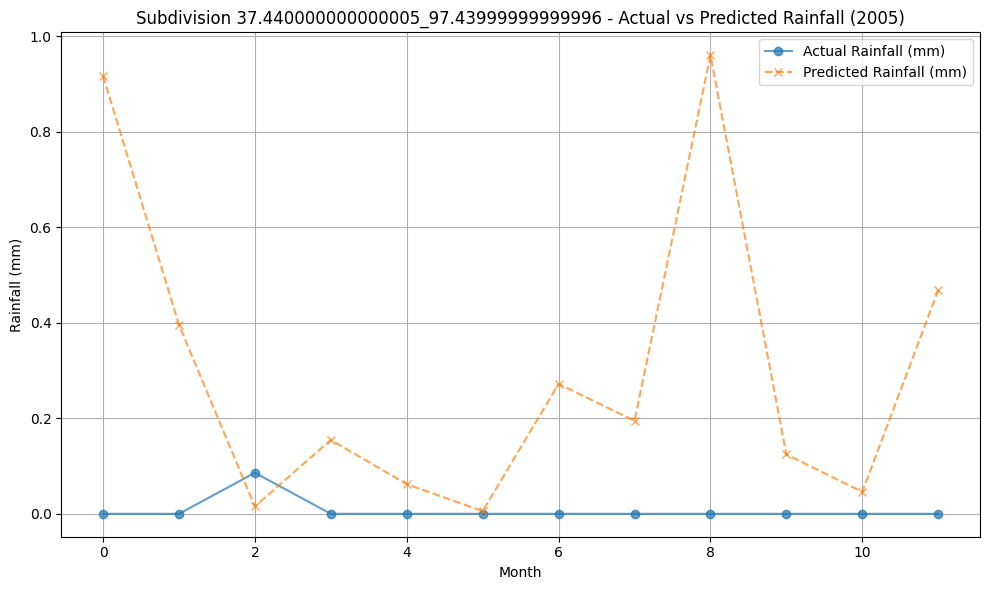

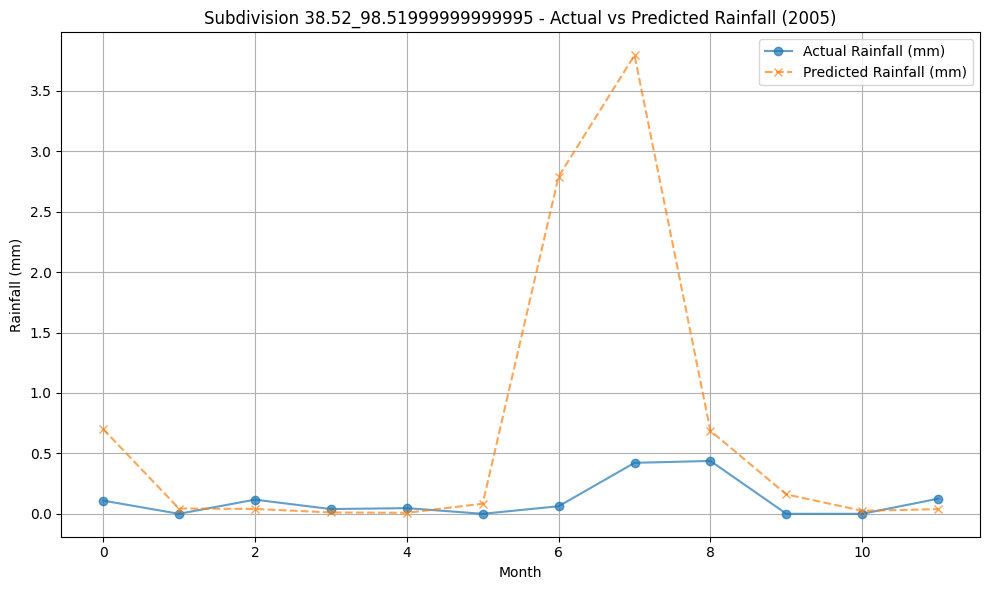

In [217]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' from 'time' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1990–2019) and testing (2020)
train_data = data[(data['year'] >= 2000) & (data['year'] < 2005)]
test_data = data[data['year'] == 2005]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Predict and evaluate subdivision-wise
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Train a Random Forest model
    rf_model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    rf_model.fit(X_train, y_train)

    # Predict and evaluate
    y_pred = rf_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Store results
    results[subdivision] = {
        'y_test': y_test,
        'y_pred': y_pred,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }
    print(f"Subdivision: {subdivision}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision
for subdivision, result in results.items():
    y_test = result['y_test']
    y_pred = result['y_pred']

    plt.figure(figsize=(10, 6))
    plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
    plt.plot(y_pred, label='Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
    plt.title(f"Subdivision {subdivision} - Actual vs Predicted Rainfall (2005)")
    plt.xlabel("Month")
    plt.ylabel("Rainfall (mm)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()


### Monthly Subdividional Rainfall prediction for 2000 to 2005 using all the parameters

Subdivision: 5.04_65.04, MSE=20.98, RMSE=4.58, R²=-16.64
Subdivision: 6.12_66.12, MSE=39.91, RMSE=6.32, R²=-17.99
Subdivision: 7.2_67.2, MSE=39.62, RMSE=6.29, R²=-44.04
Subdivision: 8.280000000000001_68.28, MSE=5.53, RMSE=2.35, R²=-0.21
Subdivision: 9.36_69.36, MSE=30.49, RMSE=5.52, R²=0.33
Subdivision: 10.44_70.44, MSE=49.94, RMSE=7.07, R²=-0.14
Subdivision: 11.52_71.52, MSE=1.19, RMSE=1.09, R²=0.55
Subdivision: 12.6_72.6, MSE=9.08, RMSE=3.01, R²=0.05
Subdivision: 13.68_73.67999999999999, MSE=11.86, RMSE=3.44, R²=-0.09
Subdivision: 14.760000000000002_74.75999999999999, MSE=64.53, RMSE=8.03, R²=-0.31
Subdivision: 15.84_75.83999999999999, MSE=34.57, RMSE=5.88, R²=-0.30
Subdivision: 16.92_76.91999999999999, MSE=23.72, RMSE=4.87, R²=-0.21
Subdivision: 18.0_77.99999999999999, MSE=14.29, RMSE=3.78, R²=0.22
Subdivision: 19.08_79.07999999999998, MSE=14.59, RMSE=3.82, R²=0.26
Subdivision: 20.16_80.15999999999998, MSE=13.00, RMSE=3.61, R²=0.18
Subdivision: 21.24_81.23999999999998, MSE=107.12, R

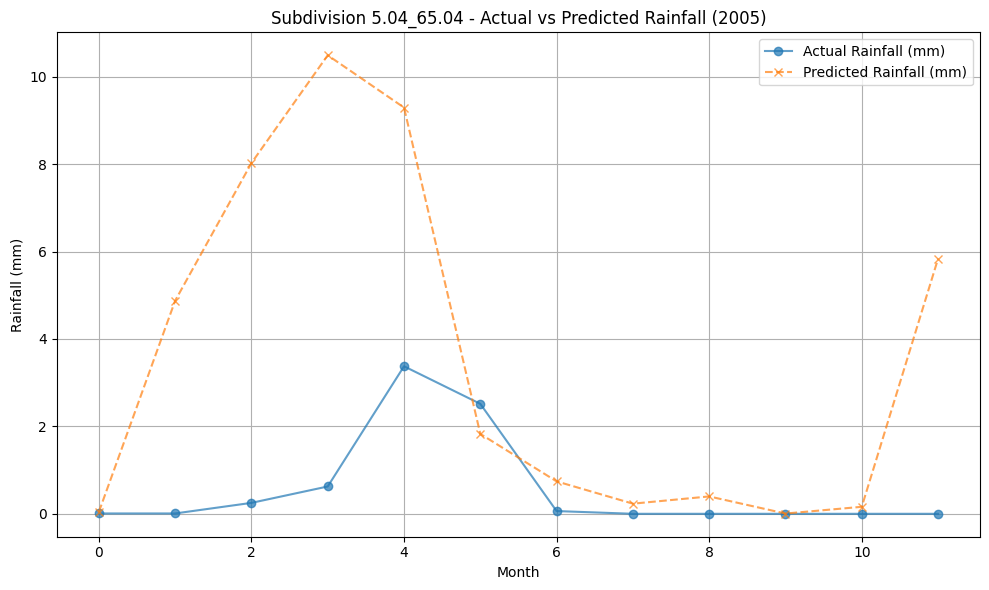

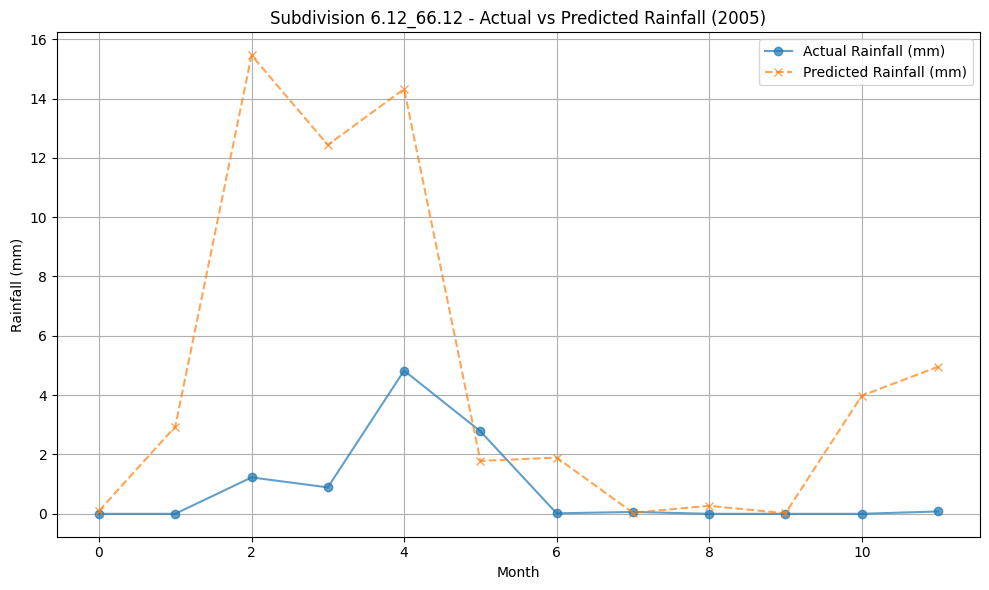

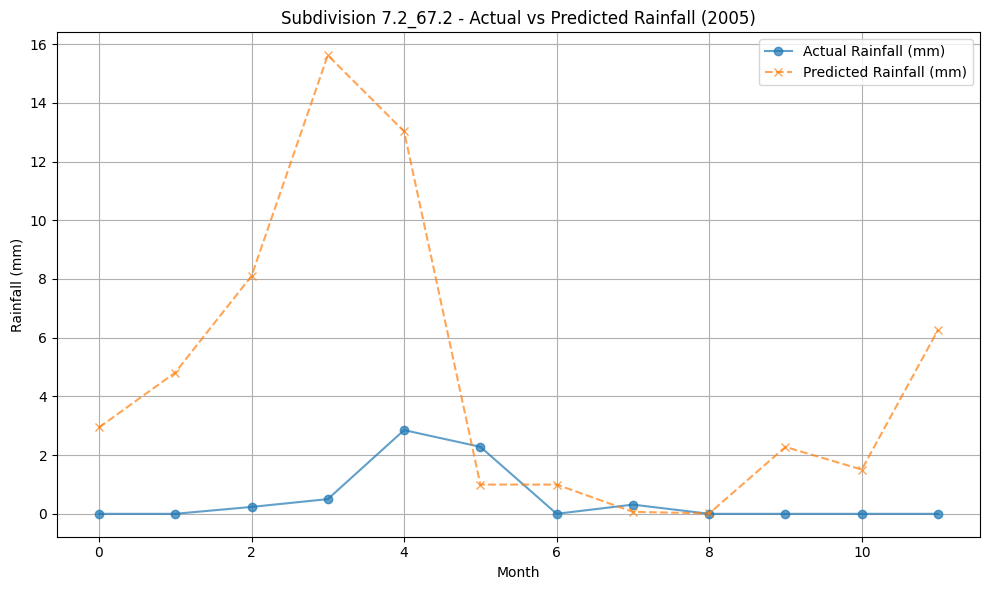

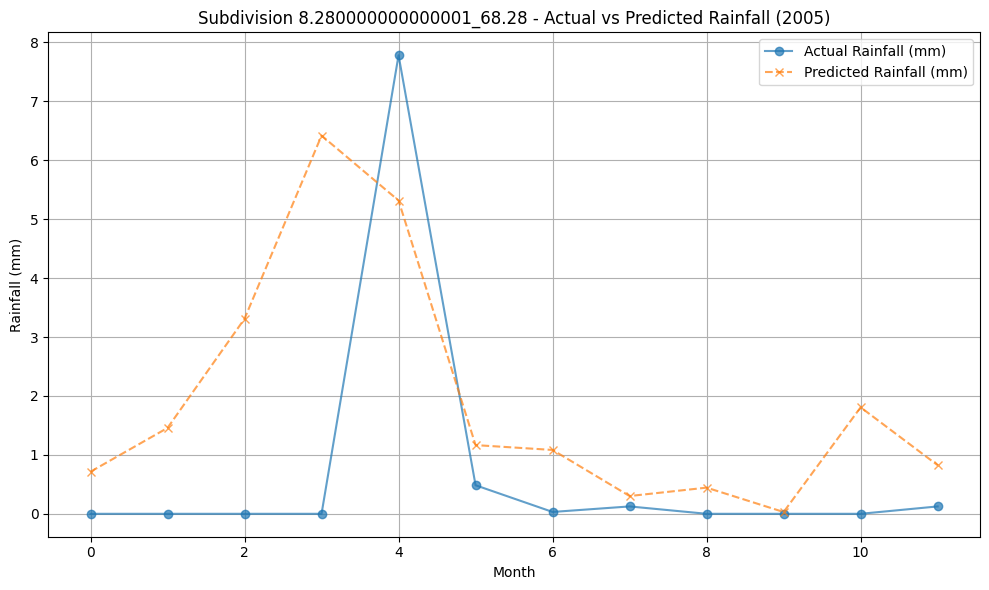

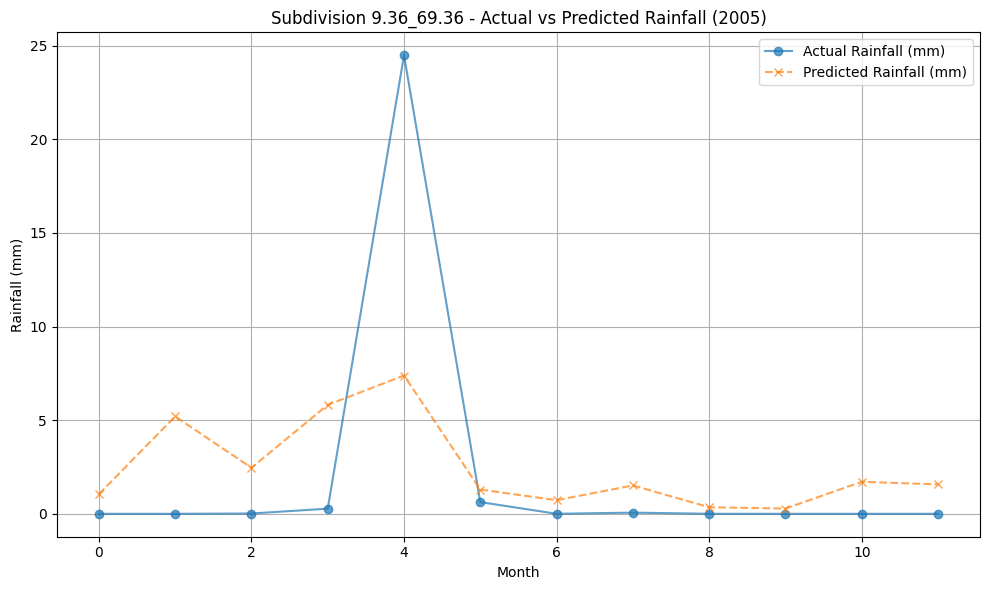

...

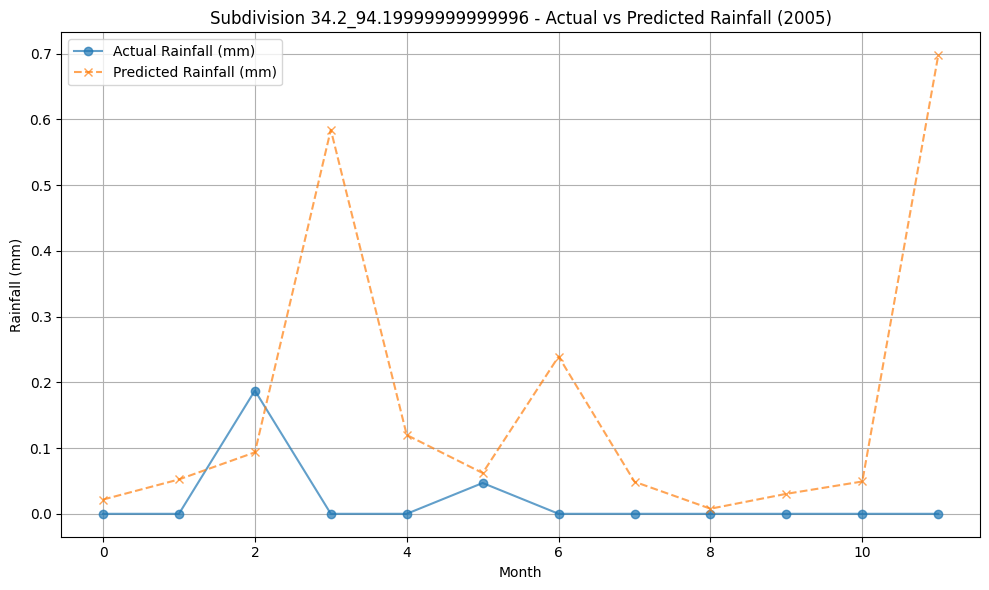

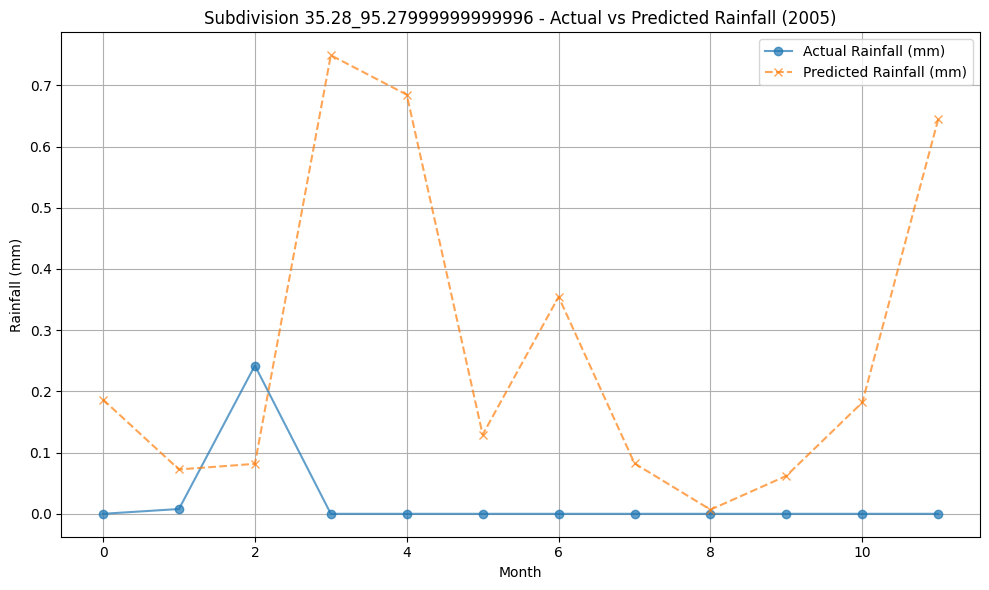

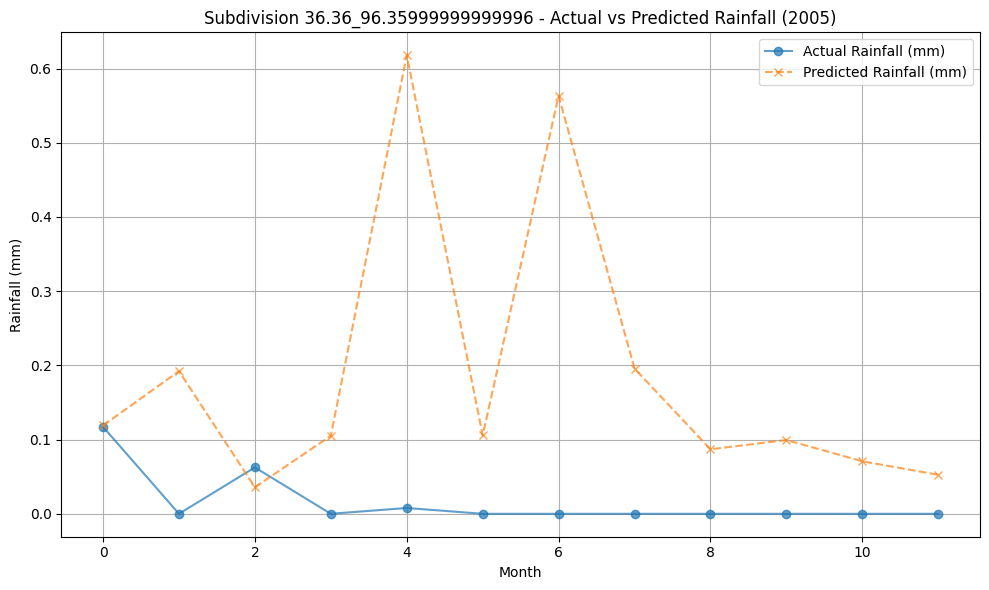

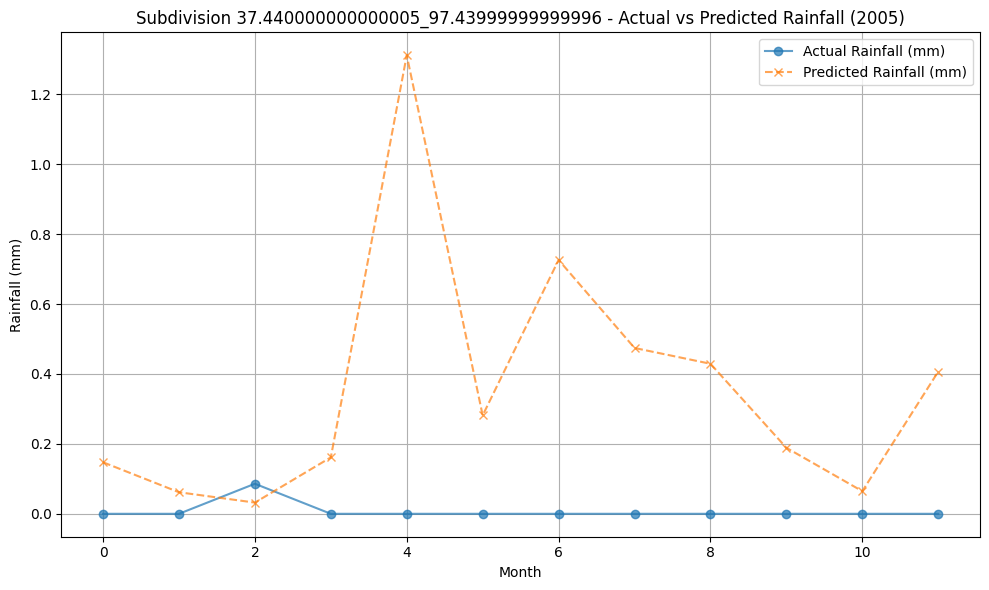

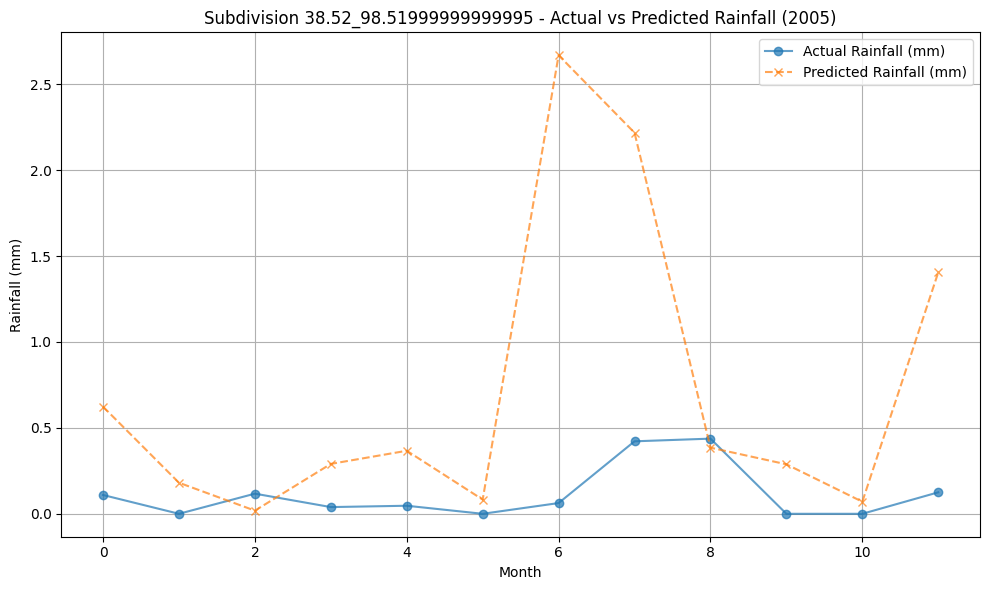

In [218]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' from 'time' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1990–2019) and testing (2020)
train_data = data[(data['year'] >= 2000) & (data['year'] < 2005)]
test_data = data[data['year'] == 2005]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed', 'MTERH_sfc', 'wind_dir', 'HGT_prl', 'TMP_prl', 'darwin', 
            'tahiti', 'TOTAL_nino', 'ClimAdjust_nino', 'ANOM_nino', 'CPOLR', 'soi']
target = 'APCP_sfc'

# Predict and evaluate subdivision-wise
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Train a Random Forest model
    rf_model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    rf_model.fit(X_train, y_train)

    # Predict and evaluate
    y_pred = rf_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Store results
    results[subdivision] = {
        'y_test': y_test,
        'y_pred': y_pred,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }
    print(f"Subdivision: {subdivision}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision
for subdivision, result in results.items():
    y_test = result['y_test']
    y_pred = result['y_pred']

    plt.figure(figsize=(10, 6))
    plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
    plt.plot(y_pred, label='Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
    plt.title(f"Subdivision {subdivision} - Actual vs Predicted Rainfall (2005)")
    plt.xlabel("Month")
    plt.ylabel("Rainfall (mm)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()


### Monthly Subdividional Rainfall prediction for 1990 to 1999 using 2 best parameters

In [219]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' from 'time' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1990–2019) and testing (2020)
train_data = data[(data['year'] >= 1995) & (data['year'] < 1998)]
test_data = data[data['year'] == 1999]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Predict and evaluate subdivision-wise
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Train a Random Forest model
    rf_model = RandomForestRegressor(n_estimators=100, max_depth=7, random_state=42)
    rf_model.fit(X_train, y_train)

    # Predict and evaluate
    y_pred = rf_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Store results
    results[subdivision] = {
        'y_test': y_test,
        'y_pred': y_pred,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }
    print(f"Subdivision: {subdivision}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision
# for subdivision, result in results.items():
#     y_test = result['y_test']
#     y_pred = result['y_pred']

#     plt.figure(figsize=(10, 6))
#     plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
#     plt.plot(y_pred, label='Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
#     plt.title(f"Subdivision {subdivision} - Actual vs Predicted Rainfall (1999)")
#     plt.xlabel("Month")
#     plt.ylabel("Rainfall (mm)")
#     plt.legend()
#     plt.grid()
#     plt.tight_layout()
#     plt.show()


Subdivision: 5.04_65.04, MSE=2.56, RMSE=1.60, R²=-5468.09
Subdivision: 6.12_66.12, MSE=8.94, RMSE=2.99, R²=-803.47
Subdivision: 7.2_67.2, MSE=5.36, RMSE=2.32, R²=-0.89
Subdivision: 8.280000000000001_68.28, MSE=10.64, RMSE=3.26, R²=-272.18
Subdivision: 9.36_69.36, MSE=24.59, RMSE=4.96, R²=-2.59
Subdivision: 10.44_70.44, MSE=49.83, RMSE=7.06, R²=-1.16
Subdivision: 11.52_71.52, MSE=16.42, RMSE=4.05, R²=-4.22
Subdivision: 12.6_72.6, MSE=3.77, RMSE=1.94, R²=-0.73
Subdivision: 13.68_73.67999999999999, MSE=2.95, RMSE=1.72, R²=0.02
Subdivision: 14.760000000000002_74.75999999999999, MSE=3.28, RMSE=1.81, R²=-0.05
Subdivision: 15.84_75.83999999999999, MSE=9.39, RMSE=3.06, R²=-0.08
Subdivision: 16.92_76.91999999999999, MSE=1.08, RMSE=1.04, R²=-0.34
Subdivision: 18.0_77.99999999999999, MSE=23.42, RMSE=4.84, R²=-0.25
Subdivision: 19.08_79.07999999999998, MSE=84.32, RMSE=9.18, R²=-0.35
Subdivision: 20.16_80.15999999999998, MSE=74.59, RMSE=8.64, R²=-0.36
Subdivision: 21.24_81.23999999999998, MSE=216.6

### Using Grid Search to find optimal parameters


Tuning RandomForest...
Best Parameters for RandomForest: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100, 'random_state': 42}
RandomForest - MSE: 43.62, RMSE: 6.60, R²: 0.29


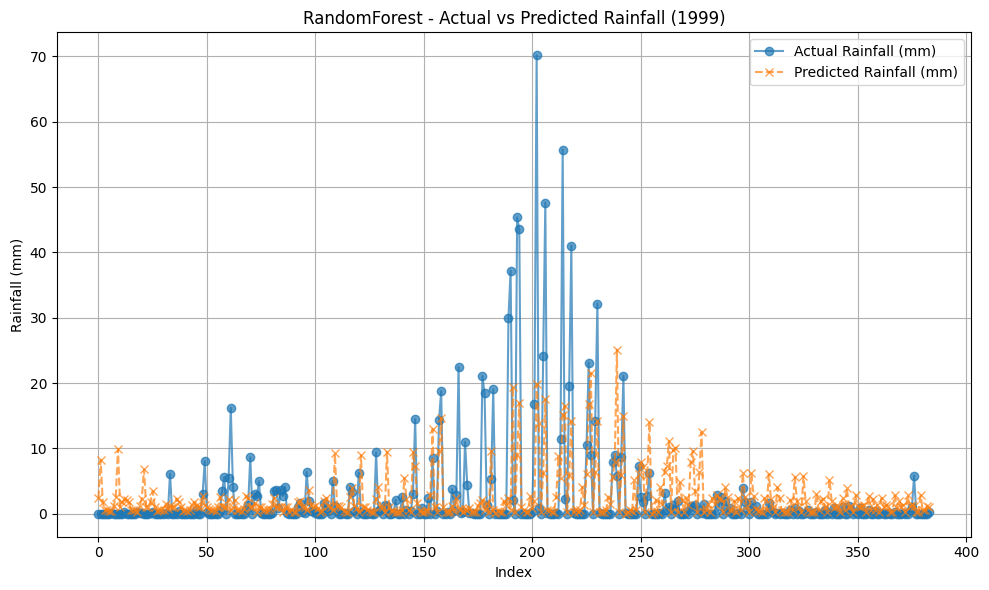


Tuning DecisionTree...
Best Parameters for DecisionTree: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'random_state': 42}
DecisionTree - MSE: 61.25, RMSE: 7.83, R²: 0.00


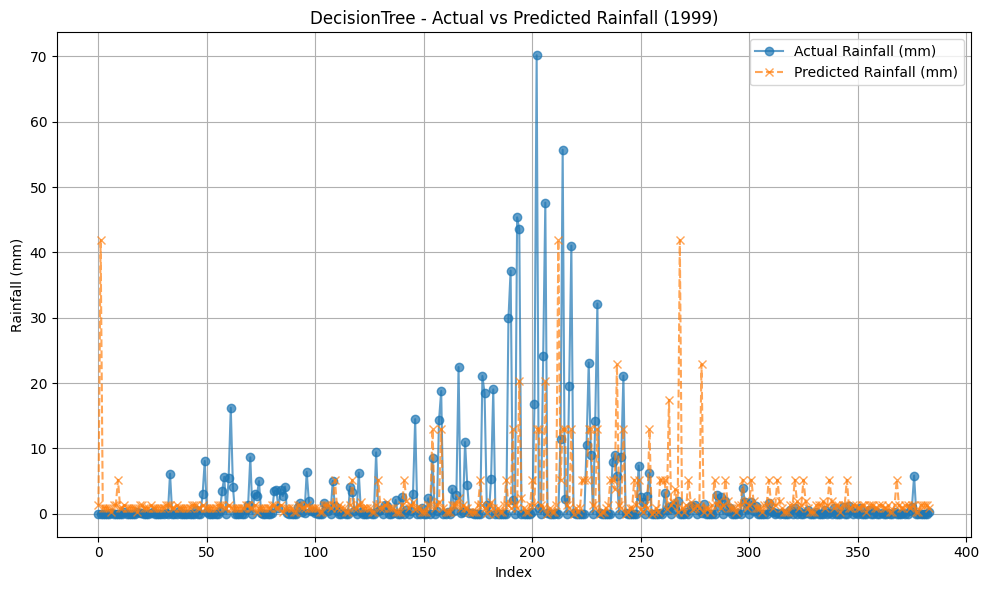


Tuning MLP...
Best Parameters for MLP: {'activation': 'tanh', 'hidden_layer_sizes': (50,), 'max_iter': 1000, 'random_state': 42, 'solver': 'sgd'}
MLP - MSE: 61.75, RMSE: 7.86, R²: -0.01


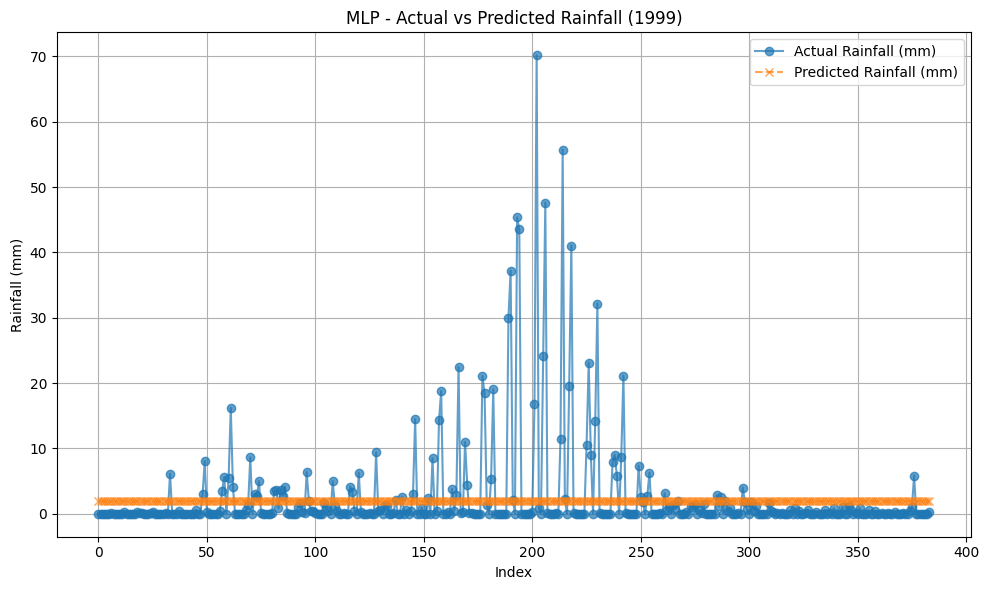


Tuning LinearRegression...
Best Parameters for LinearRegression: {'fit_intercept': False}
LinearRegression - MSE: 54.80, RMSE: 7.40, R²: 0.11


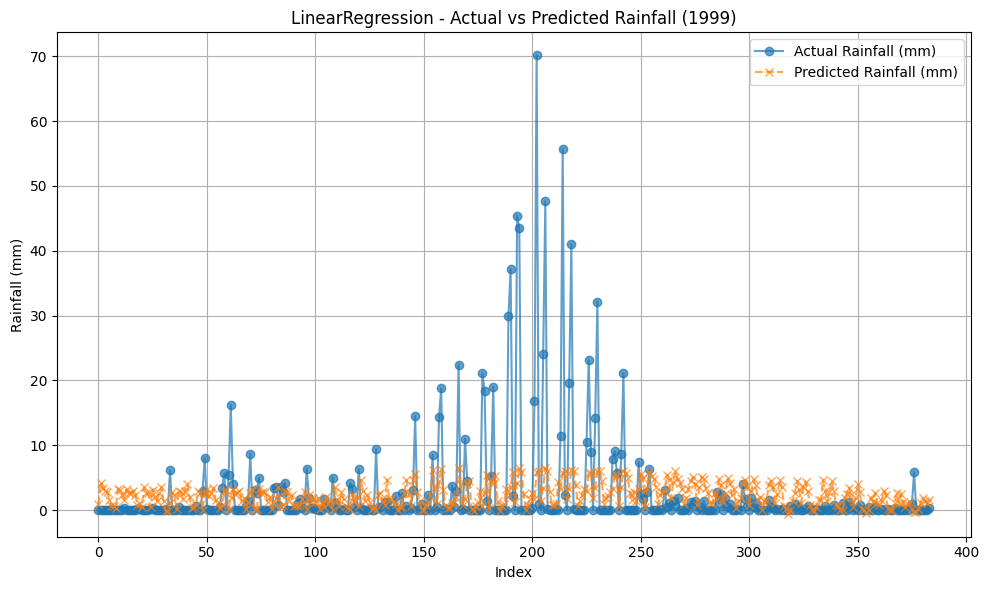

In [220]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' from 'time' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1990–2019) and testing (2020)
train_data = data[(data['year'] >= 1995) & (data['year'] < 1999)]
test_data = data[data['year'] == 1999]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Define parameter grids for each model
param_grids = {
    'RandomForest': {
        'n_estimators': [50, 100, 200],
        'max_depth': [5, 7, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'random_state': [42]
    },
    'DecisionTree': {
        'max_depth': [5, 7, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'random_state': [42]
    },
    'MLP': {
        'hidden_layer_sizes': [(50,), (100,), (50, 50)],
        'activation': ['relu', 'tanh'],
        'solver': ['adam', 'sgd'],
        'max_iter': [1000],
        'random_state': [42]
    },
    'LinearRegression': {
        'fit_intercept': [True, False]
    }
}

# Models
models = {
    'RandomForest': RandomForestRegressor(),
    'DecisionTree': DecisionTreeRegressor(),
    'MLP': MLPRegressor(),
    'LinearRegression': LinearRegression()
}

# Perform Grid Search for each model
best_models = {}
for model_name, model in models.items():
    print(f"\nTuning {model_name}...")
    grid_search = GridSearchCV(model, param_grids[model_name], cv=3, n_jobs=-1, scoring='neg_mean_squared_error')
    grid_search.fit(train_data[features], train_data[target])
    
    # Get the best model and parameters
    best_models[model_name] = grid_search.best_estimator_
    print(f"Best Parameters for {model_name}: {grid_search.best_params_}")

    # Predict with the best model
    y_pred = best_models[model_name].predict(test_data[features])
    mse = mean_squared_error(test_data[target], y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_data[target], y_pred)

    print(f"{model_name} - MSE: {mse:.2f}, RMSE: {rmse:.2f}, R²: {r2:.2f}")

    # Plot actual vs predicted rainfall
    plt.figure(figsize=(10, 6))
    plt.plot(test_data[target].values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
    plt.plot(y_pred, label='Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
    plt.title(f"{model_name} - Actual vs Predicted Rainfall (1999)")
    plt.xlabel("Index")
    plt.ylabel("Rainfall (mm)")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()




### Comparing MLP, linear Regression, Decision tree classifier, Random Forest for predicting monthly subdivisional rainfall for years 1995 to 1999

In [221]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1995–1998) and testing (1999)
train_data = data[(data['year'] >= 1995) & (data['year'] < 1999)]
test_data = data[data['year'] == 1999]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Initialize models
models = {
    "Random Forest": RandomForestRegressor(max_depth= 5, min_samples_leaf= 4, min_samples_split= 10, n_estimators= 100, random_state= 42),
    "Decision Tree": DecisionTreeRegressor(max_depth= 5, min_samples_leaf=1, min_samples_split= 5, random_state= 42),
    "Linear Regression": LinearRegression(),
    "MLP Regressor": MLPRegressor(activation= 'tanh', hidden_layer_sizes=(50,), max_iter= 1000, random_state= 42, solver= 'sgd')
}

# Predict and evaluate subdivision-wise for each model
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Initialize results dictionary for this subdivision
    results[subdivision] = {}

    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict and evaluate
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        # Store results
        results[subdivision][model_name] = {
            'y_test': y_test,
            'y_pred': y_pred,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2
        }
        print(f"Subdivision: {subdivision}, Model: {model_name}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision and model
# for subdivision, model_results in results.items():
#     for model_name, result in model_results.items():
#         y_test = result['y_test']
#         y_pred = result['y_pred']

#         plt.figure(figsize=(10, 6))
#         plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
#         plt.plot(y_pred, label=f'{model_name} Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
#         plt.title(f"Subdivision {subdivision} - {model_name}: Actual vs Predicted Rainfall (1999)")
#         plt.xlabel("Index")
#         plt.ylabel("Rainfall (mm)")
#         plt.legend()
#         plt.grid()
#         plt.tight_layout()
#         plt.show()


Subdivision: 5.04_65.04, Model: Random Forest, MSE=2.48, RMSE=1.57, R²=-5293.01
Subdivision: 5.04_65.04, Model: Decision Tree, MSE=6.14, RMSE=2.48, R²=-13120.60
Subdivision: 5.04_65.04, Model: Linear Regression, MSE=2.91, RMSE=1.70, R²=-6208.74
Subdivision: 5.04_65.04, Model: MLP Regressor, MSE=0.78, RMSE=0.88, R²=-1665.87
Subdivision: 6.12_66.12, Model: Random Forest, MSE=8.63, RMSE=2.94, R²=-775.13
Subdivision: 6.12_66.12, Model: Decision Tree, MSE=10.57, RMSE=3.25, R²=-950.48
Subdivision: 6.12_66.12, Model: Linear Regression, MSE=12.48, RMSE=3.53, R²=-1121.89
Subdivision: 6.12_66.12, Model: MLP Regressor, MSE=3.31, RMSE=1.82, R²=-296.79
Subdivision: 7.2_67.2, Model: Random Forest, MSE=7.14, RMSE=2.67, R²=-1.51
Subdivision: 7.2_67.2, Model: Decision Tree, MSE=4.59, RMSE=2.14, R²=-0.62
Subdivision: 7.2_67.2, Model: Linear Regression, MSE=6.78, RMSE=2.60, R²=-1.39
Subdivision: 7.2_67.2, Model: MLP Regressor, MSE=3.47, RMSE=1.86, R²=-0.22
Subdivision: 8.280000000000001_68.28, Model: Ran

In [222]:
# Aggregate metrics for model comparison
aggregate_results = {model_name: {'MSE': [], 'RMSE': [], 'R2': []} for model_name in models.keys()}

# Collect results
for subdivision, model_results in results.items():
    for model_name, metrics in model_results.items():
        aggregate_results[model_name]['MSE'].append(metrics['MSE'])
        aggregate_results[model_name]['RMSE'].append(metrics['RMSE'])
        aggregate_results[model_name]['R2'].append(metrics['R2'])

# Calculate average metrics (ignoring negative R2 values)
average_metrics = {}
for model_name, metrics in aggregate_results.items():
    positive_r2_values = [r2 for r2 in metrics['R2'] if r2 > 0]  # Ignore negative R2
    avg_mse = np.mean(metrics['MSE'])
    avg_rmse = np.mean(metrics['RMSE'])
    avg_r2 = np.mean(positive_r2_values) if positive_r2_values else float('-inf')  # Handle cases with no positive R2
    average_metrics[model_name] = {'Avg MSE': avg_mse, 'Avg RMSE': avg_rmse, 'Avg R2': avg_r2}

# Display results
print("\nAverage Metrics Across All Subdivisions 1995 to 1999:")
for model_name, metrics in average_metrics.items():
    print(f"{model_name}: Avg MSE={metrics['Avg MSE']:.2f}, Avg RMSE={metrics['Avg RMSE']:.2f}, Avg R2 ={metrics['Avg R2']:.2f}")

# Identify the best model based on Avg Positive R2
best_model = max(average_metrics, key=lambda x: average_metrics[x]['Avg R2'])
print(f"\nBest Model Based on Avg  R2: {best_model}")



Average Metrics Across All Subdivisions 1995 to 1999:
Random Forest: Avg MSE=45.97, Avg RMSE=4.84, Avg R2 =0.25
Decision Tree: Avg MSE=60.75, Avg RMSE=5.57, Avg R2 =0.27
Linear Regression: Avg MSE=45.35, Avg RMSE=4.55, Avg R2 =0.19
MLP Regressor: Avg MSE=55.71, Avg RMSE=4.62, Avg R2 =-inf

Best Model Based on Avg  R2: Decision Tree


### Comparing MLP, linear Regression, Decision tree classifier, Random Forest for predicting monthly subdivisional rainfall for years 2010 to 2020

In [223]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1995–1998) and testing (1999)
train_data = data[(data['year'] >= 2010) & (data['year'] < 2020)]
test_data = data[data['year'] == 2020]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Initialize models
models = {
    "Random Forest": RandomForestRegressor(max_depth= 5, min_samples_leaf= 4, min_samples_split= 10, n_estimators= 100, random_state= 42),
    "Decision Tree": DecisionTreeRegressor(max_depth= 5, min_samples_leaf=1, min_samples_split= 5, random_state= 42),
    "Linear Regression": LinearRegression(),
    "MLP Regressor": MLPRegressor(activation= 'tanh', hidden_layer_sizes=(50,), max_iter= 1000, random_state= 42, solver= 'sgd')
}

# Predict and evaluate subdivision-wise for each model
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Initialize results dictionary for this subdivision
    results[subdivision] = {}

    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict and evaluate
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        # Store results
        results[subdivision][model_name] = {
            'y_test': y_test,
            'y_pred': y_pred,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2
        }
        print(f"Subdivision: {subdivision}, Model: {model_name}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision and model
# for subdivision, model_results in results.items():
#     for model_name, result in model_results.items():
#         y_test = result['y_test']
#         y_pred = result['y_pred']

#         plt.figure(figsize=(10, 6))
#         plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
#         plt.plot(y_pred, label=f'{model_name} Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
#         plt.title(f"Subdivision {subdivision} - {model_name}: Actual vs Predicted Rainfall (2020)")
#         plt.xlabel("Index")
#         plt.ylabel("Rainfall (mm)")
#         plt.legend()
#         plt.grid()
#         plt.tight_layout()
#         plt.show()


Subdivision: 5.04_65.04, Model: Random Forest, MSE=14.25, RMSE=3.78, R²=-680.40
Subdivision: 5.04_65.04, Model: Decision Tree, MSE=17.61, RMSE=4.20, R²=-840.64
Subdivision: 5.04_65.04, Model: Linear Regression, MSE=4.57, RMSE=2.14, R²=-217.28
Subdivision: 5.04_65.04, Model: MLP Regressor, MSE=4.38, RMSE=2.09, R²=-208.32
Subdivision: 6.12_66.12, Model: Random Forest, MSE=10.42, RMSE=3.23, R²=-199.88
Subdivision: 6.12_66.12, Model: Decision Tree, MSE=6.24, RMSE=2.50, R²=-119.21
Subdivision: 6.12_66.12, Model: Linear Regression, MSE=4.39, RMSE=2.09, R²=-83.57
Subdivision: 6.12_66.12, Model: MLP Regressor, MSE=4.79, RMSE=2.19, R²=-91.39
Subdivision: 7.2_67.2, Model: Random Forest, MSE=9.42, RMSE=3.07, R²=-487.38
Subdivision: 7.2_67.2, Model: Decision Tree, MSE=2.74, RMSE=1.65, R²=-140.84
Subdivision: 7.2_67.2, Model: Linear Regression, MSE=4.08, RMSE=2.02, R²=-210.51
Subdivision: 7.2_67.2, Model: MLP Regressor, MSE=4.42, RMSE=2.10, R²=-228.36
Subdivision: 8.280000000000001_68.28, Model: Ra

In [224]:
# Aggregate metrics for model comparison
aggregate_results = {model_name: {'MSE': [], 'RMSE': [], 'R2': []} for model_name in models.keys()}

# Collect results
for subdivision, model_results in results.items():
    for model_name, metrics in model_results.items():
        aggregate_results[model_name]['MSE'].append(metrics['MSE'])
        aggregate_results[model_name]['RMSE'].append(metrics['RMSE'])
        aggregate_results[model_name]['R2'].append(metrics['R2'])

# Calculate average metrics (ignoring negative R2 values)
average_metrics = {}
for model_name, metrics in aggregate_results.items():
    positive_r2_values = [r2 for r2 in metrics['R2'] if r2 > 0]  # Ignore negative R2
    avg_mse = np.mean(metrics['MSE'])
    avg_rmse = np.mean(metrics['RMSE'])
    avg_r2 = np.mean(positive_r2_values) if positive_r2_values else float('-inf')  # Handle cases with no positive R2
    average_metrics[model_name] = {'Avg MSE': avg_mse, 'Avg RMSE': avg_rmse, 'Avg R2': avg_r2}

# Display results
print("\nAverage Metrics Across All Subdivisions 2010 to 2020:")
for model_name, metrics in average_metrics.items():
    print(f"{model_name}: Avg MSE={metrics['Avg MSE']:.2f}, Avg RMSE={metrics['Avg RMSE']:.2f}, Avg R2 ={metrics['Avg R2']:.2f}")

# Identify the best model based on Avg Positive R2
best_model = max(average_metrics, key=lambda x: average_metrics[x]['Avg R2'])
print(f"\nBest Model Based on Avg  R2: {best_model}")



Average Metrics Across All Subdivisions 2010 to 2020:
Random Forest: Avg MSE=3.50, Avg RMSE=1.54, Avg R2 =0.20
Decision Tree: Avg MSE=5.11, Avg RMSE=1.79, Avg R2 =0.27
Linear Regression: Avg MSE=2.05, Avg RMSE=1.20, Avg R2 =0.13
MLP Regressor: Avg MSE=2.36, Avg RMSE=1.22, Avg R2 =0.00

Best Model Based on Avg  R2: Decision Tree


### Comparing MLP, linear Regression, Decision tree classifier, Random Forest for predicting monthly subdivisional rainfall for years 2000 to 2010

In [225]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1995–1998) and testing (1999)
train_data = data[(data['year'] >= 2000) & (data['year'] < 2010)]
test_data = data[data['year'] == 2010]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Initialize models
models = {
    "Random Forest": RandomForestRegressor(max_depth= 5, min_samples_leaf= 4, min_samples_split= 10, n_estimators= 100, random_state= 42),
    "Decision Tree": DecisionTreeRegressor(max_depth= 5, min_samples_leaf=1, min_samples_split= 5, random_state= 42),
    "Linear Regression": LinearRegression(),
    "MLP Regressor": MLPRegressor(activation= 'tanh', hidden_layer_sizes=(50,), max_iter= 1000, random_state= 42, solver= 'sgd')
}

# Predict and evaluate subdivision-wise for each model
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Initialize results dictionary for this subdivision
    results[subdivision] = {}

    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict and evaluate
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        # Store results
        results[subdivision][model_name] = {
            'y_test': y_test,
            'y_pred': y_pred,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2
        }
        print(f"Subdivision: {subdivision}, Model: {model_name}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision and model
# for subdivision, model_results in results.items():
#     for model_name, result in model_results.items():
#         y_test = result['y_test']
#         y_pred = result['y_pred']

#         plt.figure(figsize=(10, 6))
#         plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
#         plt.plot(y_pred, label=f'{model_name} Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
#         plt.title(f"Subdivision {subdivision} - {model_name}: Actual vs Predicted Rainfall (2010)")
#         plt.xlabel("Index")
#         plt.ylabel("Rainfall (mm)")
#         plt.legend()
#         plt.grid()
#         plt.tight_layout()
#         plt.show()


Subdivision: 5.04_65.04, Model: Random Forest, MSE=7.65, RMSE=2.77, R²=-4.11
Subdivision: 5.04_65.04, Model: Decision Tree, MSE=4.55, RMSE=2.13, R²=-2.03
Subdivision: 5.04_65.04, Model: Linear Regression, MSE=5.61, RMSE=2.37, R²=-2.74
Subdivision: 5.04_65.04, Model: MLP Regressor, MSE=2.61, RMSE=1.62, R²=-0.74
Subdivision: 6.12_66.12, Model: Random Forest, MSE=10.46, RMSE=3.23, R²=-8.73
Subdivision: 6.12_66.12, Model: Decision Tree, MSE=15.04, RMSE=3.88, R²=-13.01
Subdivision: 6.12_66.12, Model: Linear Regression, MSE=9.63, RMSE=3.10, R²=-7.97
Subdivision: 6.12_66.12, Model: MLP Regressor, MSE=3.16, RMSE=1.78, R²=-1.94
Subdivision: 7.2_67.2, Model: Random Forest, MSE=18.09, RMSE=4.25, R²=-8.17
Subdivision: 7.2_67.2, Model: Decision Tree, MSE=57.97, RMSE=7.61, R²=-28.38
Subdivision: 7.2_67.2, Model: Linear Regression, MSE=8.60, RMSE=2.93, R²=-3.36
Subdivision: 7.2_67.2, Model: MLP Regressor, MSE=2.70, RMSE=1.64, R²=-0.37
Subdivision: 8.280000000000001_68.28, Model: Random Forest, MSE=6.

In [226]:
# Aggregate metrics for model comparison
aggregate_results = {model_name: {'MSE': [], 'RMSE': [], 'R2': []} for model_name in models.keys()}

# Collect results
for subdivision, model_results in results.items():
    for model_name, metrics in model_results.items():
        aggregate_results[model_name]['MSE'].append(metrics['MSE'])
        aggregate_results[model_name]['RMSE'].append(metrics['RMSE'])
        aggregate_results[model_name]['R2'].append(metrics['R2'])

# Calculate average metrics (ignoring negative R2 values)
average_metrics = {}
for model_name, metrics in aggregate_results.items():
    positive_r2_values = [r2 for r2 in metrics['R2'] if r2 > 0]  # Ignore negative R2
    avg_mse = np.mean(metrics['MSE'])
    avg_rmse = np.mean(metrics['RMSE'])
    avg_r2 = np.mean(positive_r2_values) if positive_r2_values else float('-inf')  # Handle cases with no positive R2
    average_metrics[model_name] = {'Avg MSE': avg_mse, 'Avg RMSE': avg_rmse, 'Avg R2': avg_r2}

# Display results
print("\nAverage Metrics Across All Subdivisions 2000 to 2010:")
for model_name, metrics in average_metrics.items():
    print(f"{model_name}: Avg MSE={metrics['Avg MSE']:.2f}, Avg RMSE={metrics['Avg RMSE']:.2f}, Avg R2 ={metrics['Avg R2']:.2f}")

# Identify the best model based on Avg Positive R2
best_model = max(average_metrics, key=lambda x: average_metrics[x]['Avg R2'])
print(f"\nBest Model Based on Avg  R2: {best_model}")



Average Metrics Across All Subdivisions 2000 to 2010:
Random Forest: Avg MSE=12.32, Avg RMSE=2.75, Avg R2 =0.23
Decision Tree: Avg MSE=22.33, Avg RMSE=3.39, Avg R2 =0.37
Linear Regression: Avg MSE=10.60, Avg RMSE=2.55, Avg R2 =0.08
MLP Regressor: Avg MSE=9.42, Avg RMSE=2.35, Avg R2 =-inf

Best Model Based on Avg  R2: Decision Tree


### Comparing MLP, linear Regression, Decision tree classifier, Random Forest for predicting monthly subdivisional rainfall for years 1990 to 1995

In [227]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv('data.csv')

# Ensure 'year' and 'month' columns exist in the dataset
if 'year' not in data.columns:
    data['year'] = pd.to_datetime(data['time']).dt.year  # Extract 'year' from 'time' if not already done
if 'month' not in data.columns:
    data['month'] = pd.to_datetime(data['time']).dt.month  # Extract 'month' if not already done

# Add subdivision column (e.g., based on `updated_lat` and `updated_lon`)
data['subdivision'] = data['updated_lat'].astype(str) + '_' + data['updated_lon'].astype(str)

# Filter data into training (1995–1998) and testing (1999)
train_data = data[(data['year'] >= 1990) & (data['year'] < 1995)]
test_data = data[data['year'] == 1995]

# Specify the features and target column
features = ['TMP_2m', 'wind_speed']
target = 'APCP_sfc'

# Initialize models
models = {
    "Random Forest": RandomForestRegressor(max_depth= 5, min_samples_leaf= 4, min_samples_split= 10, n_estimators= 100, random_state= 42),
    "Decision Tree": DecisionTreeRegressor(max_depth= 5, min_samples_leaf=1, min_samples_split= 5, random_state= 42),
    "Linear Regression": LinearRegression(),
    "MLP Regressor": MLPRegressor(activation= 'tanh', hidden_layer_sizes=(50,), max_iter= 1000, random_state= 42, solver= 'sgd')
}

# Predict and evaluate subdivision-wise for each model
subdivisions = data['subdivision'].unique()
results = {}

for subdivision in subdivisions:
    # Filter data for the current subdivision
    train_sub = train_data[train_data['subdivision'] == subdivision]
    test_sub = test_data[test_data['subdivision'] == subdivision]

    if train_sub.empty or test_sub.empty:
        print(f"No data for subdivision {subdivision}. Skipping.")
        continue

    # Prepare training and testing sets
    X_train = train_sub[features]
    y_train = train_sub[target]
    X_test = test_sub[features]
    y_test = test_sub[target]

    # Initialize results dictionary for this subdivision
    results[subdivision] = {}

    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict and evaluate
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        # Store results
        results[subdivision][model_name] = {
            'y_test': y_test,
            'y_pred': y_pred,
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2
        }
        print(f"Subdivision: {subdivision}, Model: {model_name}, MSE={mse:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}")

# Plot actual vs. predicted rainfall for each subdivision and model
# for subdivision, model_results in results.items():
#     for model_name, result in model_results.items():
#         y_test = result['y_test']
#         y_pred = result['y_pred']

#         plt.figure(figsize=(10, 6))
#         plt.plot(y_test.values, label='Actual Rainfall (mm)', marker='o', linestyle='-', alpha=0.7)
#         plt.plot(y_pred, label=f'{model_name} Predicted Rainfall (mm)', marker='x', linestyle='--', alpha=0.7)
#         plt.title(f"Subdivision {subdivision} - {model_name}: Actual vs Predicted Rainfall (1995)")
#         plt.xlabel("Index")
#         plt.ylabel("Rainfall (mm)")
#         plt.legend()
#         plt.grid()
#         plt.tight_layout()
#         plt.show()

# Aggregate metrics for model comparison
aggregate_results = {model_name: {'MSE': [], 'RMSE': [], 'R2': []} for model_name in models.keys()}

# Collect results
for subdivision, model_results in results.items():
    for model_name, metrics in model_results.items():
        aggregate_results[model_name]['MSE'].append(metrics['MSE'])
        aggregate_results[model_name]['RMSE'].append(metrics['RMSE'])
        aggregate_results[model_name]['R2'].append(metrics['R2'])

# Calculate average metrics (ignoring negative R2 values)
average_metrics = {}
for model_name, metrics in aggregate_results.items():
    positive_r2_values = [r2 for r2 in metrics['R2'] if r2 > 0]  # Ignore negative R2
    avg_mse = np.mean(metrics['MSE'])
    avg_rmse = np.mean(metrics['RMSE'])
    avg_r2 = np.mean(positive_r2_values) if positive_r2_values else float('-inf')  # Handle cases with no positive R2
    average_metrics[model_name] = {'Avg MSE': avg_mse, 'Avg RMSE': avg_rmse, 'Avg R2': avg_r2}

# Display results
print("\nAverage Metrics Across All Subdivisions 1990 to 1995:")
for model_name, metrics in average_metrics.items():
    print(f"{model_name}: Avg MSE={metrics['Avg MSE']:.2f}, Avg RMSE={metrics['Avg RMSE']:.2f}, Avg R2 ={metrics['Avg R2']:.2f}")

# Identify the best model based on Avg Positive R2
best_model = max(average_metrics, key=lambda x: average_metrics[x]['Avg R2'])
print(f"\nBest Model Based on Avg  R2: {best_model}")


Subdivision: 5.04_65.04, Model: Random Forest, MSE=1.36, RMSE=1.17, R²=0.72
Subdivision: 5.04_65.04, Model: Decision Tree, MSE=1.45, RMSE=1.20, R²=0.71
Subdivision: 5.04_65.04, Model: Linear Regression, MSE=1.50, RMSE=1.23, R²=0.70
Subdivision: 5.04_65.04, Model: MLP Regressor, MSE=5.03, RMSE=2.24, R²=-0.02
Subdivision: 6.12_66.12, Model: Random Forest, MSE=6.47, RMSE=2.54, R²=0.54
Subdivision: 6.12_66.12, Model: Decision Tree, MSE=9.04, RMSE=3.01, R²=0.35
Subdivision: 6.12_66.12, Model: Linear Regression, MSE=6.24, RMSE=2.50, R²=0.55
Subdivision: 6.12_66.12, Model: MLP Regressor, MSE=14.18, RMSE=3.77, R²=-0.02
Subdivision: 7.2_67.2, Model: Random Forest, MSE=1.17, RMSE=1.08, R²=0.59
Subdivision: 7.2_67.2, Model: Decision Tree, MSE=1.09, RMSE=1.04, R²=0.62
Subdivision: 7.2_67.2, Model: Linear Regression, MSE=1.23, RMSE=1.11, R²=0.57
Subdivision: 7.2_67.2, Model: MLP Regressor, MSE=2.90, RMSE=1.70, R²=-0.01
Subdivision: 8.280000000000001_68.28, Model: Random Forest, MSE=2.19, RMSE=1.48,